# **Marketing Campaign Analysis**

## **Executive Summary**

### **The objective:**

 - The objective of this audience segmentation is to identify distinguishing characteristics of our audience members in order to provide insights into their behavior and develop stratagies for how best to advertise to them in the future.

### **Best solution summary:**

 - I found that the best solution to achieve this goal was clustering using a gausian mixture method with the following 6 clusters.

1.   Low Income savers
2.   Low Income spenders
3.   Medium Income Online Shoppers
4.   Medium Income balanced shoppers
5.   High Income late adopters
6.   High Income small families


### **Next Steps:**

 - Improve data quality & provide context for future analysis
 - Create specialized marketing campaigns

### **Data Overview:**

 - Our dataset contained the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** The data was collected in the year 2016.

### **Solution Approach:**

 - In order to reach our final best solution I took the following steps


1.   Performing exploratory Data Analysis including univariate and bivariate analysis and Data Cleaning
2.   Performing Primary Component Analysis and T-distributed Stochastic Neighbor Embedding
3.   Performing K-Means, K-Medoids, Hierarchical Clustering, DBSCAN, & Gaussian Mixture Model clustering techniques with a variety of different settings.
4.   Creating a profile of the various clusters for each of the possible solutions.
5.   Suggesting reccomendations for stake holders on how to capitalize on the insights obtained.


## **Import the necessary libraries and load the data**

In [1]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 7.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-learn-extra: filename=scikit_learn_extra-0.3.0-cp312-cp312-linux_x86_64.whl size=1959510 sha256=ee0d81e6cd86b61037a2448a7b856952010a1a333eef469cbfd456d21828624e
  Stored in directory: /root/.cache/pip/wheels/17/4d/c3/c6d5d563c1bf8146d059d63be3678abc2f2801fba0aaf5f0b8
Successfully built scikit-learn-extra


**Note**: After running this commands, you’ll be prompted to restart your notebook/runtime. Please go ahead and do that. Once restarted, simply proceed to the next step of your workflow

In [2]:
!pip install numpy==1.26.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.9/17.9 MB 57.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
shap 0.50.0 requires numpy>=2, but you have numpy 1.26.0 which is incompatible.
rasterio 1.5.0 requires numpy>=2, but you have numpy 1.26.0 which is incompatible.
pytensor 2.36.3 requires numpy>=2.0, but you have numpy 1.26.0 which is incompatible.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.26.0 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; pyth

In [1]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

pd.set_option('display.max_columns', None)

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# To compute distances
from scipy.spatial.distance import cdist

# To perform K-means clustering and compute Silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# To visualize the elbow curve and Silhouette scores
from yellowbrick.cluster import SilhouetteVisualizer

# Importing PCA
from sklearn.decomposition import PCA

# To encode the variable
from sklearn.preprocessing import LabelEncoder

# Importing TSNE
from sklearn.manifold import TSNE

# To perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# To compute distances
from scipy.spatial.distance import pdist

# To import K-Medoids
from sklearn_extra.cluster import KMedoids

# To import Gaussian Mixture
from sklearn.mixture import GaussianMixture

# To supress warnings
import warnings

In [2]:
from google.colab import drive
drive.mount('/content/drive')
folderpath="/content/drive/MyDrive/data_skills_showcase/audience_segmentation/"

Mounted at /content/drive


## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for duplicated values
- Checking for missing values
- Correcting or dropping any present null values



In [3]:
df = pd.read_csv(folderpath+"marketing_campaign.csv")

In [4]:
df.shape

(2240, 27)

In [5]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


In [6]:
# Check that the number of unique values in each column makes sense
# EG: ID = row count, booleans have 2, no columns with only 1 value.
ucount = {}
for column in df.columns:
  ucount[column] = df[column].nunique()

ucount

{'ID': 2240,
 'Year_Birth': 59,
 'Education': 5,
 'Marital_Status': 8,
 'Income': 1974,
 'Kidhome': 3,
 'Teenhome': 3,
 'Dt_Customer': 663,
 'Recency': 100,
 'MntWines': 776,
 'MntFruits': 158,
 'MntMeatProducts': 558,
 'MntFishProducts': 182,
 'MntSweetProducts': 177,
 'MntGoldProds': 213,
 'NumDealsPurchases': 15,
 'NumWebPurchases': 15,
 'NumCatalogPurchases': 14,
 'NumStorePurchases': 14,
 'NumWebVisitsMonth': 16,
 'AcceptedCmp3': 2,
 'AcceptedCmp4': 2,
 'AcceptedCmp5': 2,
 'AcceptedCmp1': 2,
 'AcceptedCmp2': 2,
 'Complain': 2,
 'Response': 2}

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [8]:
# Income has some missing values.
df.isnull().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,24
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


In [9]:
#No obvious patterns emerges from looking at the missing values that would indicate we need to take any specific measures when remediating the null values.
df[df['Income'].isnull()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
10,1994,1983,Graduation,Married,NaN,1,0,15-11-2013,11,5,5,6,0,2,1,1,1,0,2,7,0,0,0,0,0,0,0
27,5255,1986,Graduation,Single,NaN,1,0,20-02-2013,19,5,1,3,3,263,362,0,27,0,0,1,0,0,0,0,0,0,0
43,7281,1959,PhD,Single,NaN,0,0,05-11-2013,80,81,11,50,3,2,39,1,1,3,4,2,0,0,0,0,0,0,0
48,7244,1951,Graduation,Single,NaN,2,1,01-01-2014,96,48,5,48,6,10,7,3,2,1,4,6,0,0,0,0,0,0,0
58,8557,1982,Graduation,Single,NaN,1,0,17-06-2013,57,11,3,22,2,2,6,2,2,0,3,6,0,0,0,0,0,0,0
71,10629,1973,2n Cycle,Married,NaN,1,0,14-09-2012,25,25,3,43,17,4,17,3,3,0,3,8,0,0,0,0,0,0,0
90,8996,1957,PhD,Married,NaN,2,1,19-11-2012,4,230,42,192,49,37,53,12,7,2,8,9,0,0,0,0,0,0,0
91,9235,1957,Graduation,Single,NaN,1,1,27-05-2014,45,7,0,8,2,0,1,1,1,0,2,7,0,0,0,0,0,0,0
92,5798,1973,Master,Together,NaN,0,0,23-11-2013,87,445,37,359,98,28,18,1,2,4,8,1,0,0,0,0,0,0,0
128,8268,1961,PhD,Married,NaN,0,1,11-07-2013,23,352,0,27,10,0,15,3,6,1,7,6,0,0,0,0,0,0,0


In [10]:
df['Income'].mean()

52247.25135379061

In [11]:
df['Income'].median()

51381.5

In [12]:
df[df['Income'] == 0]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response


In [15]:
# I'd rather use the median as I know there is a significant outlier on the upper limit of our Income
# Best solution would be to perform a regression based on age and use that to fill in our null values but that's not my focus here.
df.fillna(df['Income'].median(), inplace=True)

In [16]:
df[df['Income'].isnull()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response


In [17]:
# Not getting any use out of the decimal places so the field doesn't need to be a float
df['Income'] = df['Income'].astype(int)

In [18]:
# Checking for duplicate rows while ignoring the ID column which we know is unique identifies 182 as being duplicates of a previous row in our dataset
df[df.duplicated(subset=df.columns.difference(['ID']))]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
83,4119,1963,Master,Together,38620,0,0,11-05-2013,56,112,17,44,34,22,89,1,2,5,3,3,0,0,0,0,0,0,0
179,6935,1951,2n Cycle,Married,78497,0,0,01-12-2013,44,207,26,447,75,0,223,1,5,7,12,2,0,0,0,1,0,0,0
281,10144,1976,Graduation,Together,51369,0,1,25-10-2012,84,297,7,79,0,11,182,2,8,2,4,8,0,0,0,0,0,0,0
282,8652,1946,Graduation,Together,37760,0,0,31-08-2012,20,84,5,38,150,12,28,2,4,1,6,7,0,0,0,0,0,0,0
363,933,1978,PhD,Married,37717,1,0,23-11-2012,31,9,0,6,4,1,5,1,1,0,2,9,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218,4838,1978,Graduation,Together,22775,1,0,19-06-2013,40,5,1,8,0,0,1,1,1,0,2,8,0,0,0,0,0,0,0
2221,7366,1982,Master,Single,75777,0,0,04-07-2013,12,712,26,538,69,13,80,1,3,6,11,1,0,1,1,0,0,0,1
2225,4749,1968,Graduation,Together,58554,1,1,26-09-2012,55,368,24,68,38,0,88,6,8,2,6,7,0,0,0,0,0,0,0
2234,8372,1974,Graduation,Married,34421,1,0,01-07-2013,81,3,3,7,6,2,9,1,1,0,2,7,0,0,0,0,0,0,0


In [19]:
# Changing keep = False and sorting to allow me to visually see the duplicate rows side by side. This set has 358 values which is less than double the 182 marked as duplicates but that is because there are some rows that appear more than twice.
with pd.option_context('display.max_rows', None):
  display(df[df.duplicated(subset=df.columns.difference(['ID']), keep=False)].sort_values(by=['Year_Birth','Income']))

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
39,2968,1943,PhD,Divorced,48948,0,0,01-02-2013,53,437,8,206,160,49,42,2,7,10,5,6,1,0,0,0,0,0,1
894,8800,1943,PhD,Divorced,48948,0,0,01-02-2013,53,437,8,206,160,49,42,2,7,10,5,6,1,0,0,0,0,0,1
17,4939,1946,Graduation,Together,37760,0,0,31-08-2012,20,84,5,38,150,12,28,2,4,1,6,7,0,0,0,0,0,0,0
282,8652,1946,Graduation,Together,37760,0,0,31-08-2012,20,84,5,38,150,12,28,2,4,1,6,7,0,0,0,0,0,0,0
393,455,1946,PhD,Married,51012,0,0,18-04-2013,86,102,9,63,2,9,24,1,4,1,4,6,0,0,0,0,0,0,0
1771,7592,1946,PhD,Married,51012,0,0,18-04-2013,86,102,9,63,2,9,24,1,4,1,4,6,0,0,0,0,0,0,0
1487,5529,1946,PhD,Together,64014,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2236,4001,1946,PhD,Together,64014,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
182,10562,1946,Master,Married,66835,0,0,28-09-2013,21,620,26,195,34,17,141,1,6,4,13,2,0,0,0,0,0,0,0
1747,7881,1946,Master,Married,66835,0,0,28-09-2013,21,620,26,195,34,17,141,1,6,4,13,2,0,0,0,0,0,0,0


In [20]:
# It is not impossible that there could be unique individuals whose metrics exactly match anothers but my intuition is that 182 out of 2240 matching on 26 fields is not a statistical outlier it's a data issue.  The duplicate rows need to be removed.
df.drop_duplicates(subset=df.columns.difference(['ID']), inplace=True)

In [21]:
# 2240-2058 = 182. Our duplicate rows have been dropped and the dataframe reindexed.
df.reset_index(drop=True)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2053,9432,1977,Graduation,Together,666666,1,0,02-06-2013,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0
2054,10870,1967,Graduation,Married,61223,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2055,7270,1981,Graduation,Divorced,56981,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2056,8235,1956,Master,Together,69245,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [22]:
df[df.duplicated(subset=df.columns.difference(['ID']))]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response


In [23]:
# If we go one level deeper we also see that there are severl duplicates that exist when ignoring the ID & Response field.  This feels exceptionally unlikely to be anything other than a data error and the solution that makes the most sense to be is to remove the rows that responded with a 0.
# My reasoning is that the only thing that makes sense to me is someone would initially reject the offer (a 0 response) and then return to the promotion later and choose to accept it (a 1 response).
with pd.option_context('display.max_rows', None):
  display(df[df.duplicated(subset=df.columns.difference(['ID', 'Response']), keep=False)].sort_values(by=['Year_Birth', 'Income', 'Response']))

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
1060,4491,1949,Master,Married,62845,1,1,01-10-2012,3,1099,0,45,0,0,34,11,3,4,10,8,0,1,0,0,0,0,0
1342,873,1949,Master,Married,62845,1,1,01-10-2012,3,1099,0,45,0,0,34,11,3,4,10,8,0,1,0,0,0,0,1
1838,9847,1955,2n Cycle,Married,62972,0,1,03-08-2012,39,313,15,47,20,0,192,2,7,4,3,6,0,0,0,0,0,0,0
1256,9094,1955,2n Cycle,Married,62972,0,1,03-08-2012,39,313,15,47,20,0,192,2,7,4,3,6,0,0,0,0,0,0,1
852,4856,1957,2n Cycle,Married,82347,0,0,06-11-2012,38,556,54,845,202,133,63,1,7,7,10,3,1,0,0,1,0,0,0
2193,8722,1957,2n Cycle,Married,82347,0,0,06-11-2012,38,556,54,845,202,133,63,1,7,7,10,3,1,0,0,1,0,0,1
1373,5675,1960,PhD,Divorced,50611,0,1,04-10-2012,98,459,0,24,6,0,4,6,4,5,7,6,0,1,0,0,0,0,0
690,7230,1960,PhD,Divorced,50611,0,1,04-10-2012,98,459,0,24,6,0,4,6,4,5,7,6,0,1,0,0,0,0,1
256,309,1961,PhD,Together,63342,0,1,16-10-2012,48,918,21,118,13,10,21,3,8,3,5,6,0,1,0,0,0,0,0
1750,3571,1961,PhD,Together,63342,0,1,16-10-2012,48,918,21,118,13,10,21,3,8,3,5,6,0,1,0,0,0,0,1


In [24]:
dupe_resp = df[df.duplicated(subset=df.columns.difference(['ID', 'Response']), keep=False )].sort_values(by=['Year_Birth', 'Income', 'Response'])

In [25]:
df.drop(index = list(dupe_resp[dupe_resp['Response']==0].index), inplace=True)

In [26]:
# 2058-2039 = 19 rows dropped. Our duplicate rows have been dropped and the dataframe reindexed.
df.reset_index(drop=True)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2034,9432,1977,Graduation,Together,666666,1,0,02-06-2013,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0
2035,10870,1967,Graduation,Married,61223,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2036,7270,1981,Graduation,Divorced,56981,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2037,8235,1956,Master,Together,69245,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


## **Exploratory Data Analysis (EDA)**


In [27]:
# Making a list of all variables and checking the counts of each value just as an additional sanity check
catagories = list(df.columns)
catagories.remove('ID') #ID is a unique identifier we don't needs stats on

# Printing number of count of each unique value in each column
for column in catagories:
    print("~" * 25) #padding
    print(df[column].value_counts())
print("~" * 25) #padding


~~~~~~~~~~~~~~~~~~~~~~~~~
Year_Birth
1976    80
1971    79
1975    76
1970    73
1972    72
1978    71
1973    66
1965    66
1969    65
1974    61
1956    52
1958    51
1977    49
1952    49
1959    47
1979    47
1968    46
1954    45
1966    44
1960    44
1955    43
1967    41
1962    40
1957    40
1951    40
1963    39
1980    39
1986    39
1982    39
1981    38
1964    38
1984    37
1983    36
1953    33
1961    32
1985    29
1949    27
1950    26
1987    25
1988    25
1989    25
1948    19
1990    16
1947    15
1991    13
1992    12
1946    11
1945     8
1944     7
1943     6
1995     4
1993     4
1994     3
1996     2
1899     1
1941     1
1893     1
1900     1
1940     1
Name: count, dtype: int64
~~~~~~~~~~~~~~~~~~~~~~~~~
Education
Graduation    1025
PhD            442
Master         337
2n Cycle       186
Basic           49
Name: count, dtype: int64
~~~~~~~~~~~~~~~~~~~~~~~~~
Marital_Status
Married     788
Together    517
Single      445
Divorced    213
Widow        70
Alone     

In [28]:
# Most fields look fine but there are a few that stand out.
# In higher education, the second cycle typically refers to postgraduate studies, such as master's degree programs.
# The last 3 Marital_Status catagories look like they should be combined with either Single or Divorced.

# ~~~~~~~~~~~~~~~~~~~~~~~~~
# Education
# Graduation    1030
# PhD            450
# Master         341
# 2n Cycle       188
# Basic           49
# Name: count, dtype: int64
# ~~~~~~~~~~~~~~~~~~~~~~~~~
# Marital_Status
# Married     795
# Together    521
# Single      448
# Divorced    216
# Widow        71
# Alone         3
# Absurd        2
# YOLO          2
# Name: count, dtype: int64

# THere are also some year_birth values that seem to suggest people over 100 years old.

In [29]:
df['Education'] = df['Education'].replace('2n Cycle','Master')

In [30]:
# There's no way to tell for sure if this is correct but I'm going to make an educated guess based on the reported values of Kidhome and Teenhome that the YOLO and Alone values should be recategorized as Divorced and the Absurd values as Single
df[df['Marital_Status'].str.contains('Alone|YOLO|Absurd')].sort_values(by='Marital_Status')

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2093,7734,1993,Graduation,Absurd,79244,0,0,19-12-2012,58,471,102,125,212,61,245,1,4,10,7,1,0,0,1,1,0,0,1
2134,4369,1957,Master,Absurd,65487,0,0,10-01-2014,48,240,67,500,199,0,163,3,3,5,6,2,0,0,0,0,0,0,0
131,433,1958,Master,Alone,61331,1,1,10-03-2013,42,534,5,47,0,5,41,5,11,1,6,8,0,0,0,0,0,0,0
138,7660,1973,PhD,Alone,35860,1,1,19-05-2014,37,15,0,8,4,2,20,2,1,1,2,5,1,0,0,0,0,0,1
153,92,1988,Graduation,Alone,34176,1,0,12-05-2014,12,5,7,24,19,14,20,4,3,0,4,6,0,0,0,0,0,0,0
2202,11133,1973,PhD,YOLO,48432,0,1,18-10-2012,3,322,3,50,4,3,42,5,7,1,6,8,0,0,0,0,0,0,1


In [31]:
df['Marital_Status'] = df['Marital_Status'].replace('YOLO','Divorced')
df['Marital_Status'] = df['Marital_Status'].replace('Alone','Divorced')
df['Marital_Status'] = df['Marital_Status'].replace('Absurd','Single')

In [32]:
for column in ['Marital_Status','Education']:
    print("~" * 25) #padding
    print(df[column].value_counts())
print("~" * 25) #padding

~~~~~~~~~~~~~~~~~~~~~~~~~
Marital_Status
Married     788
Together    517
Single      447
Divorced    217
Widow        70
Name: count, dtype: int64
~~~~~~~~~~~~~~~~~~~~~~~~~
Education
Graduation    1025
Master         523
PhD            442
Basic           49
Name: count, dtype: int64
~~~~~~~~~~~~~~~~~~~~~~~~~


### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

- Plot histogram and box plot for different numerical features and understand how the data looks like.
- Explore the categorical variables like Education, Kidhome, Teenhome, Complain.

In [33]:
pasGreen = '#66c2a5'
pasOrange = '#fc8d62'
pasBlue = '#8da0cb'

In [34]:
# function to plot a boxplot and a histogram along the same scale.

def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """

    plotFigure, (plotBox, plotHist) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid = 2
        sharex=True,  # x-axis will be shared among both subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize
    )  # creating the 2 subplots

    sns.boxplot(data=data, x=feature, ax=plotBox, showmeans=True, color=pasOrange)  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(data=data, x=feature, kde=kde, ax=plotHist, bins=bins, color=pasBlue) if bins else sns.histplot(data=data, x=feature, kde=kde, ax=plotHist, color=pasBlue)  # For histogram

    plotHist.axvline(data[feature].mean(), color=pasGreen, linestyle="--") # Add mean to the histogram
    plotHist.axvline(data[feature].median(), color="black", linestyle="-") # Add median to the histogram

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2039 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2039 non-null   int64 
 1   Year_Birth           2039 non-null   int64 
 2   Education            2039 non-null   object
 3   Marital_Status       2039 non-null   object
 4   Income               2039 non-null   int64 
 5   Kidhome              2039 non-null   int64 
 6   Teenhome             2039 non-null   int64 
 7   Dt_Customer          2039 non-null   object
 8   Recency              2039 non-null   int64 
 9   MntWines             2039 non-null   int64 
 10  MntFruits            2039 non-null   int64 
 11  MntMeatProducts      2039 non-null   int64 
 12  MntFishProducts      2039 non-null   int64 
 13  MntSweetProducts     2039 non-null   int64 
 14  MntGoldProds         2039 non-null   int64 
 15  NumDealsPurchases    2039 non-null   int64 
 16  NumWebPurch

In [36]:
df['Year_Birth'] = pd.to_datetime(df['Year_Birth'], format='%Y')
df['Year_Birth'] = df['Year_Birth'].dt.year

In [37]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


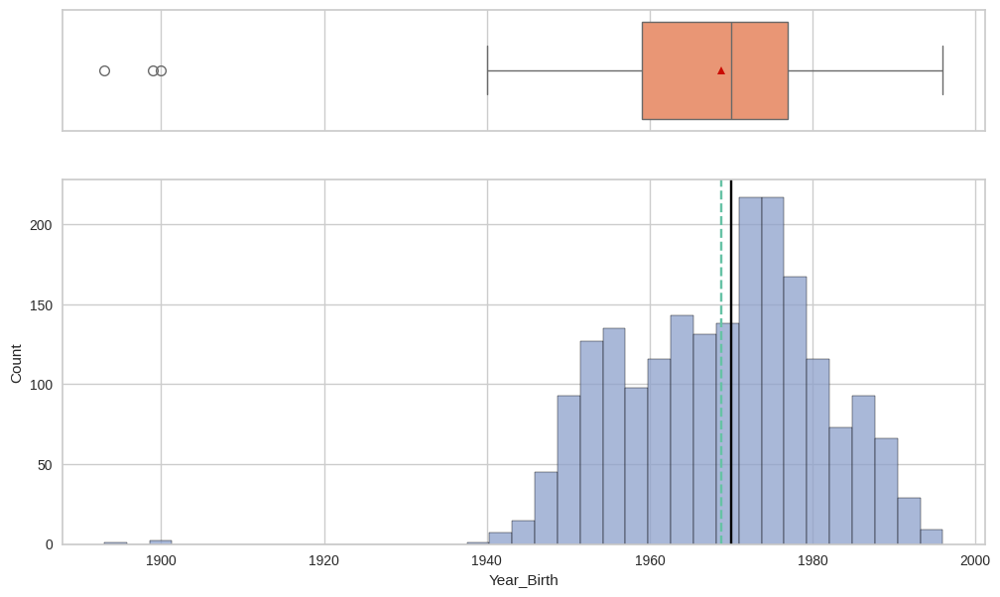

In [38]:
# There are some very serious outliers here that don't seem plausible to be real and without any reasonable way to guess what the correct DoB should be I think it's best to remove these few outliers
histogram_boxplot(df,'Year_Birth')

In [39]:
df[df['Year_Birth'] < 1940]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
192,7829,1900,Master,Divorced,36640,1,0,26-09-2013,99,15,6,8,7,4,25,1,2,1,2,5,0,0,0,0,0,1,0
239,11004,1893,Master,Single,60182,0,1,17-05-2014,23,8,0,5,7,0,2,1,1,0,2,4,0,0,0,0,0,0,0
339,1150,1899,PhD,Together,83532,0,0,26-09-2013,36,755,144,562,104,64,224,1,4,6,4,1,0,0,1,0,0,0,0


In [40]:
df = df.drop(df[df.Year_Birth < 1910].index)
df.reset_index(drop=True)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2031,9432,1977,Graduation,Together,666666,1,0,02-06-2013,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0
2032,10870,1967,Graduation,Married,61223,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2033,7270,1981,Graduation,Divorced,56981,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2034,8235,1956,Master,Together,69245,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


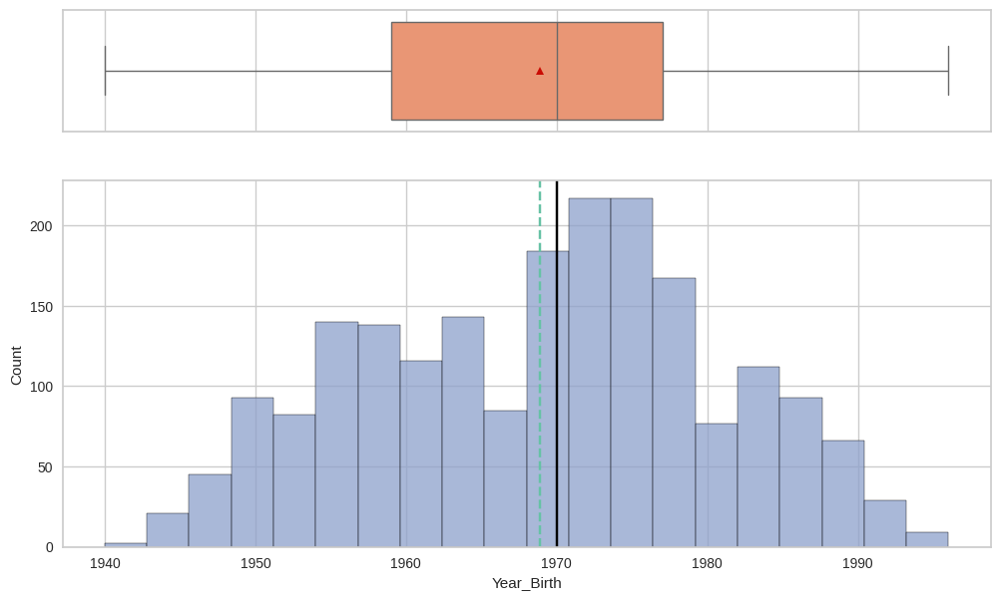

In [41]:
# Re-graphing 'Year_Birth' with outliers removed
histogram_boxplot(df,'Year_Birth')

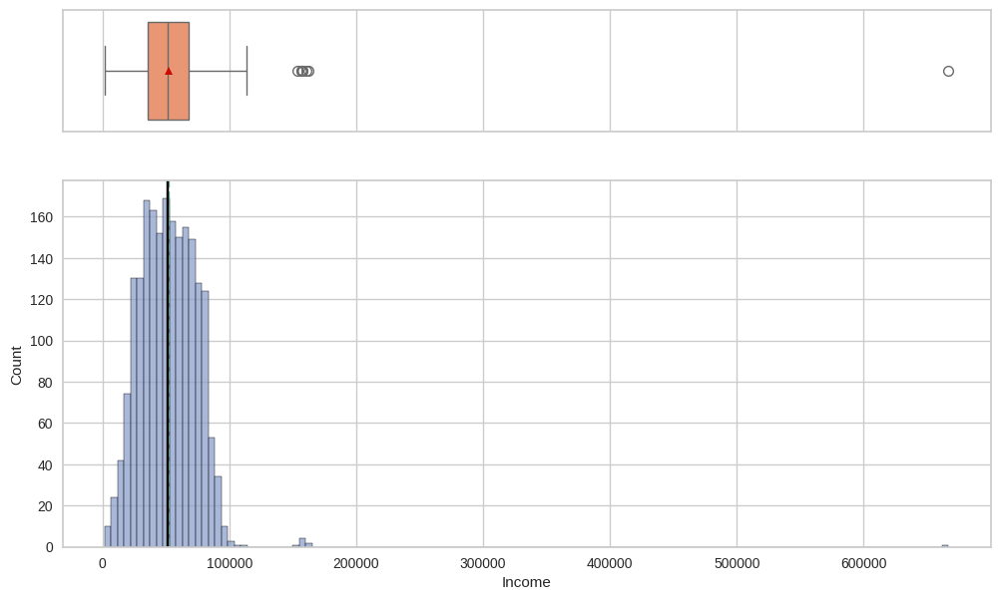

In [42]:
#Another Dramatic outlier in our data that I think we're better off plucking out for the sake of our analysis
histogram_boxplot(df,'Income')

In [43]:
df[df['Income'] > 300000]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2233,9432,1977,Graduation,Together,666666,1,0,02-06-2013,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0


In [44]:
df = df.drop(df[df.Income > 300000].index)
df.reset_index(drop=True)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2030,8080,1986,Graduation,Single,26816,0,0,17-08-2012,50,5,1,6,3,4,3,1,0,0,3,4,0,0,0,0,0,0,0
2031,10870,1967,Graduation,Married,61223,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2032,7270,1981,Graduation,Divorced,56981,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2033,8235,1956,Master,Together,69245,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


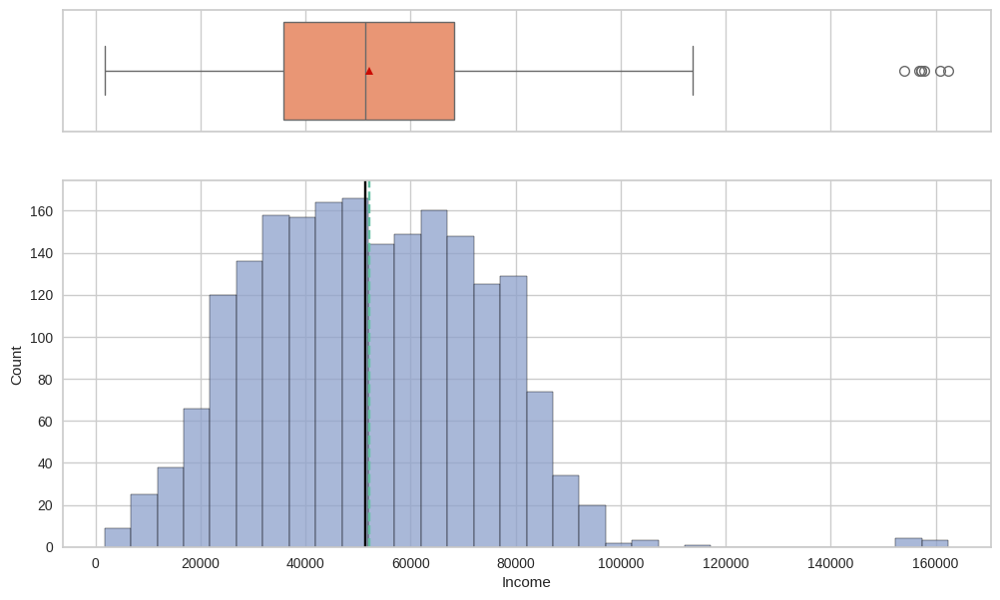

In [45]:
# Pretty standard distribution with a small cluster of outliers on the high side.
histogram_boxplot(df,'Income')

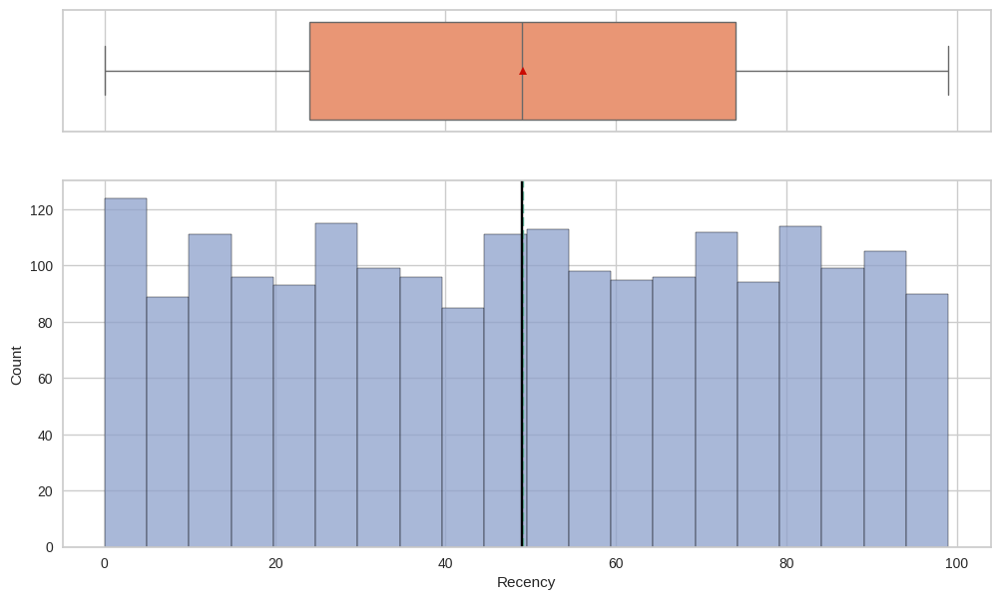

In [46]:
# number of days since previous purchase.
histogram_boxplot(df,'Recency', bins=20)

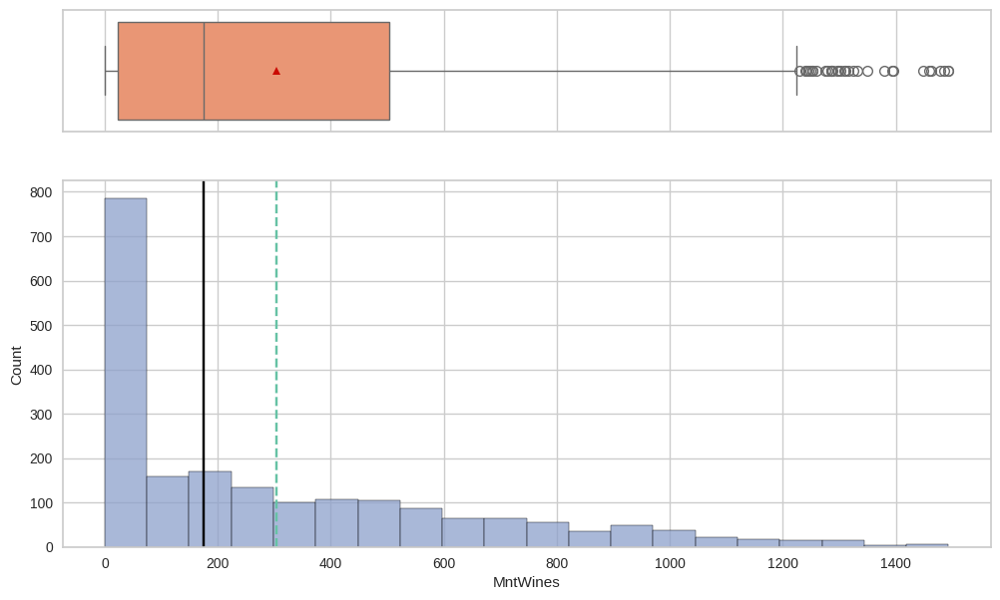

In [47]:
histogram_boxplot(df,'MntWines')

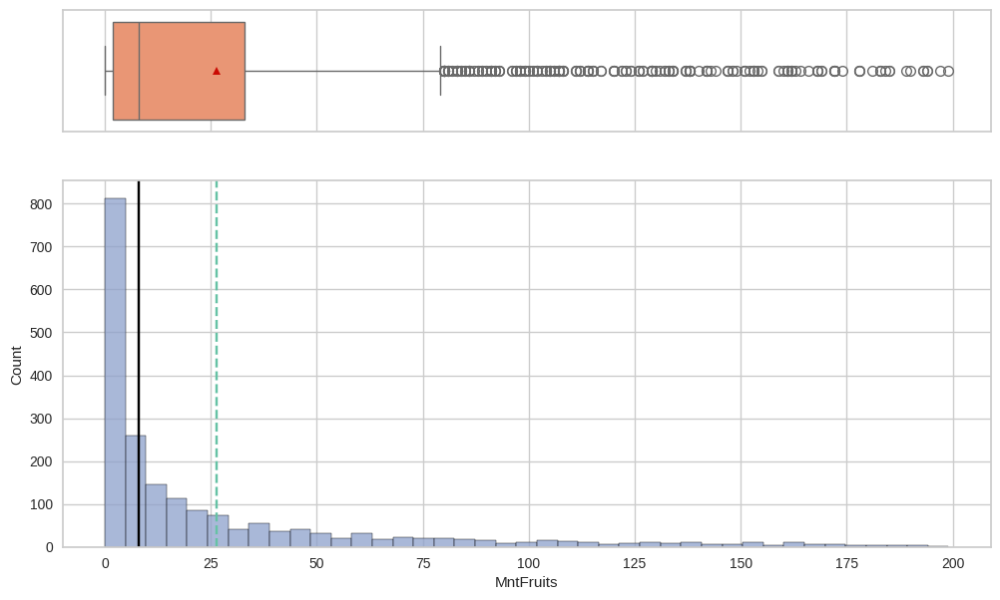

In [48]:
histogram_boxplot(df,'MntFruits')

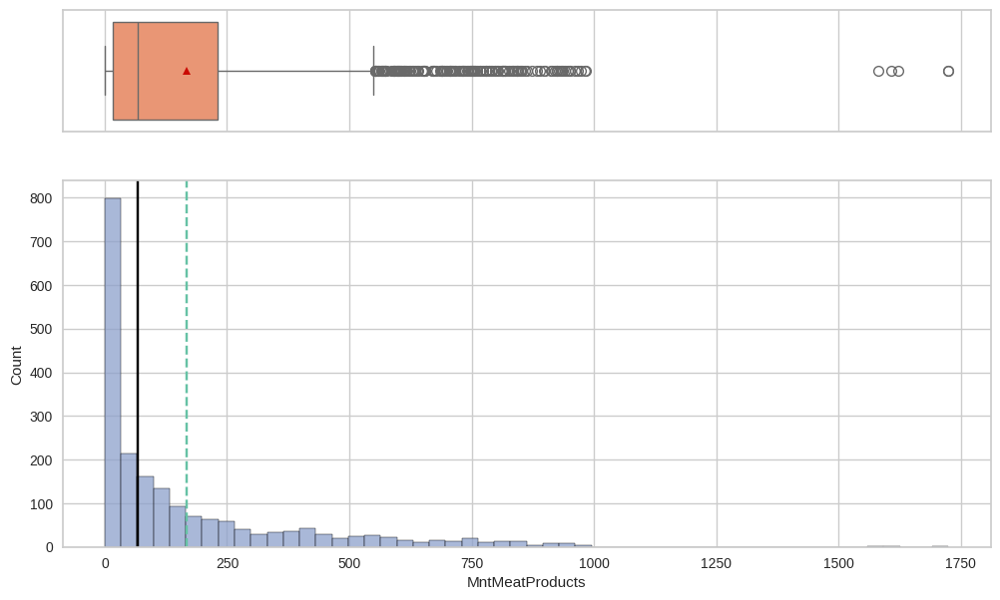

In [49]:
histogram_boxplot(df,'MntMeatProducts')

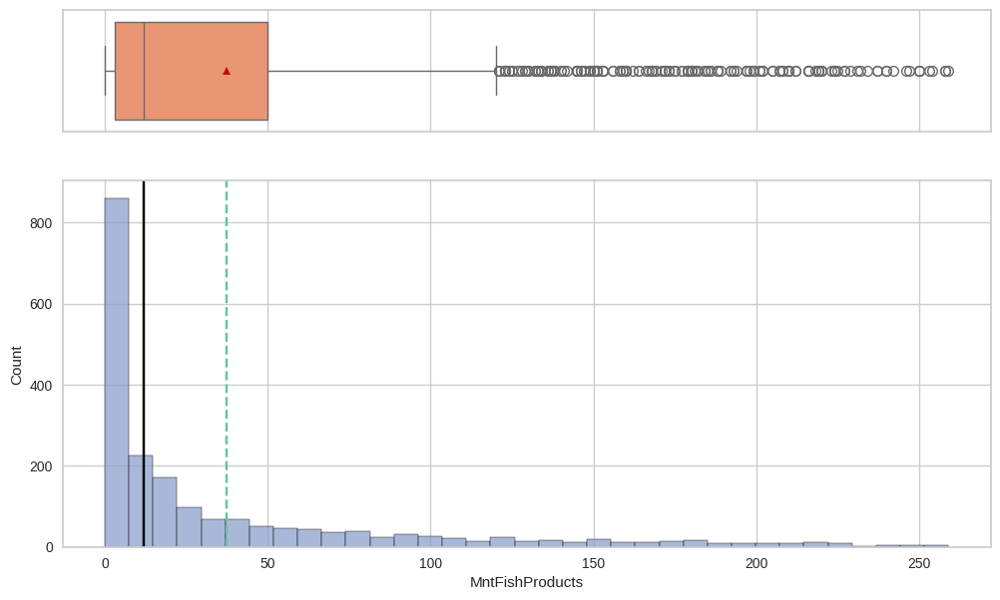

In [50]:
histogram_boxplot(df,'MntFishProducts')

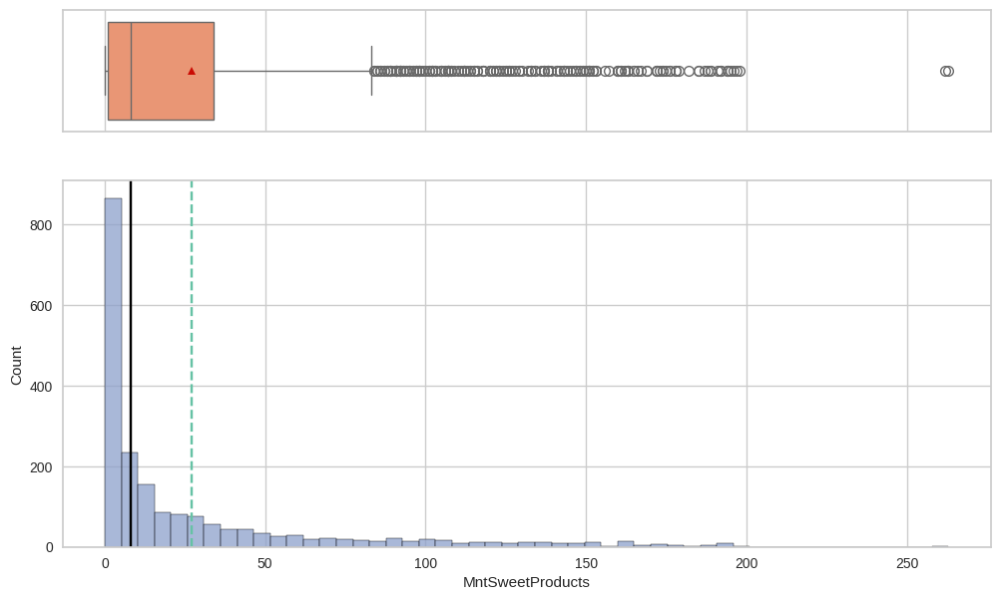

In [51]:
histogram_boxplot(df,'MntSweetProducts')

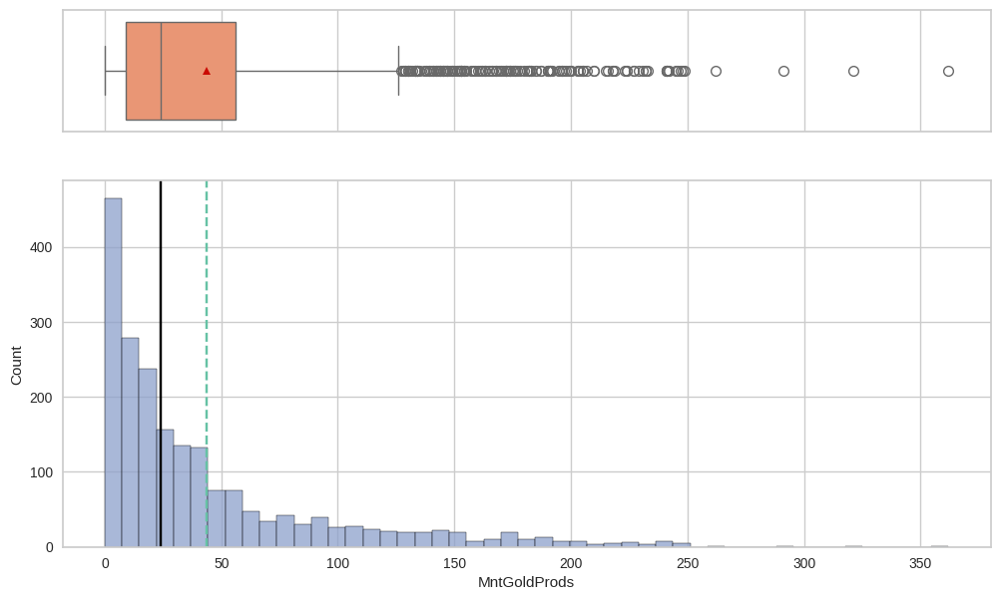

In [52]:
histogram_boxplot(df,'MntGoldProds')

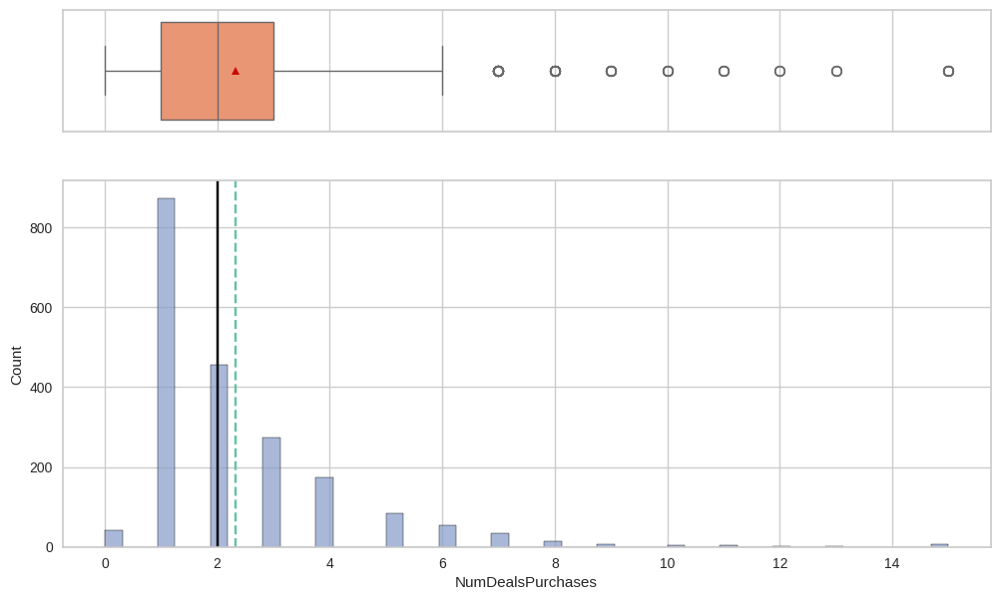

In [53]:
histogram_boxplot(df,'NumDealsPurchases')

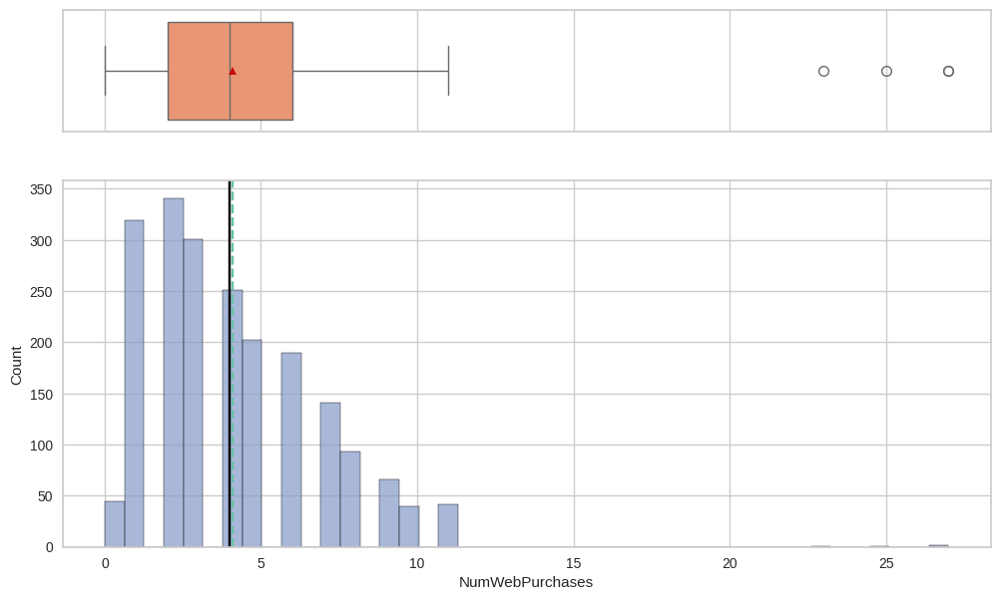

In [54]:
histogram_boxplot(df,'NumWebPurchases')

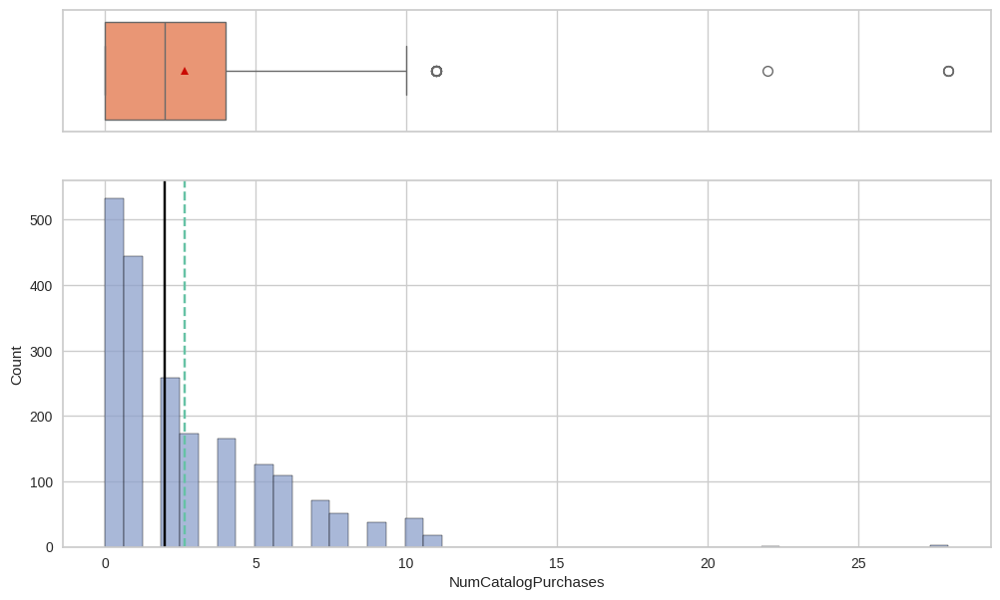

In [55]:
histogram_boxplot(df,'NumCatalogPurchases')

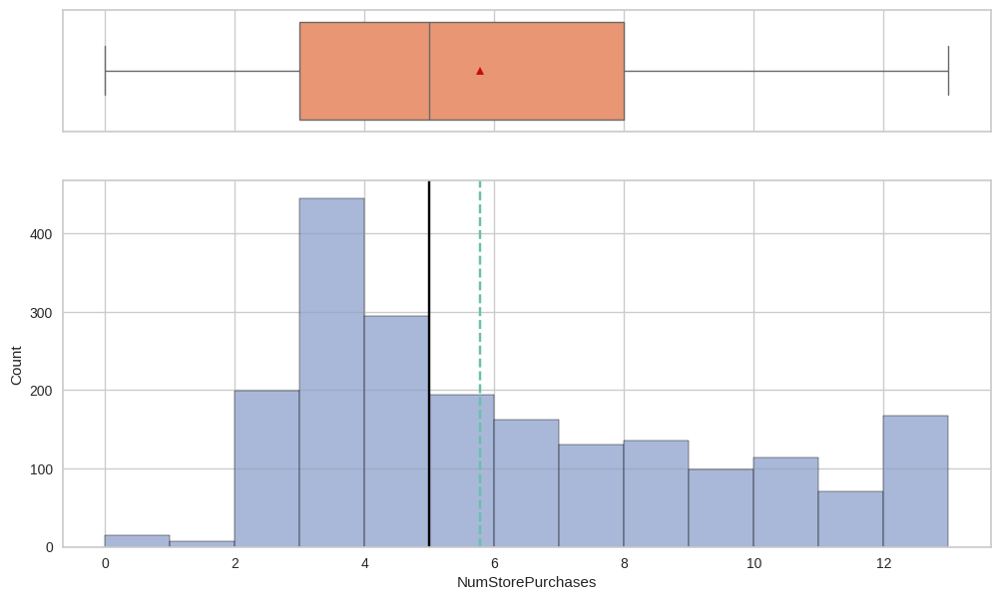

In [56]:
histogram_boxplot(df,'NumStorePurchases', bins=13)

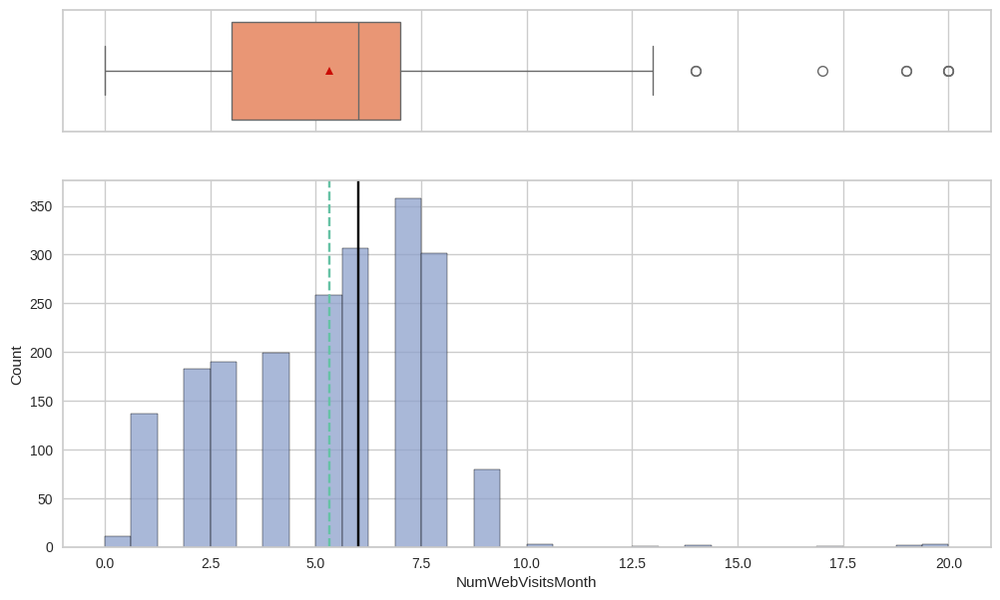

In [57]:
histogram_boxplot(df,'NumWebVisitsMonth')

In [58]:
def labeled_barplot(data, feature, perc=False):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()

    colorcode = "Set2"

    plt.figure(figsize=(count + 1, 5))
    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data = data,
        x = feature,
        hue = feature,
        palette = colorcode,
        order = data[feature].value_counts().index[:].sort_values(), #sort alphabetically rather than by counts
        legend = False
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(100 * p.get_height() / total)  # percentage of each class of the category
        else:
            label = "{:.0f}".format(p.get_height())  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

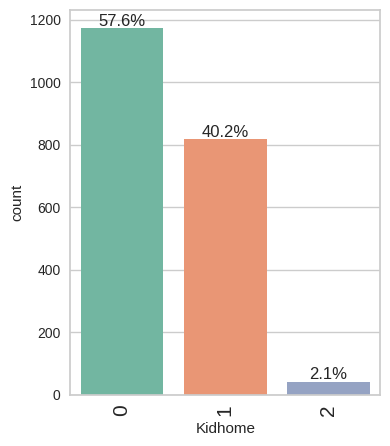

In [59]:
# Most households having less than one half of a child in them.
labeled_barplot(df,'Kidhome', perc=True)

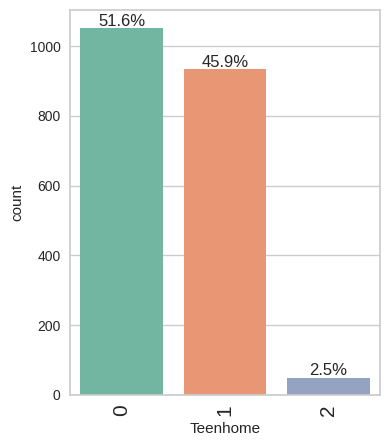

In [60]:
# Slightly more teens than kids
labeled_barplot(df,'Teenhome', perc=True)

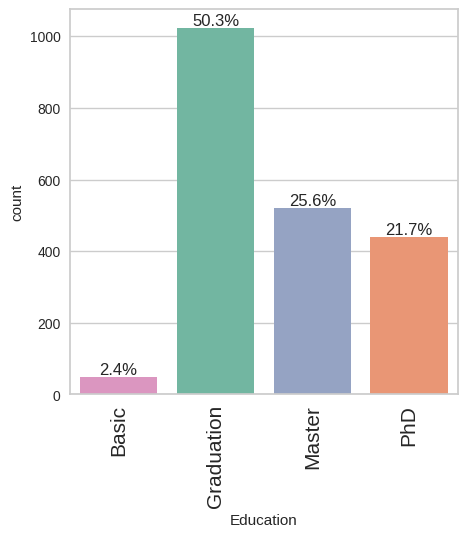

In [61]:
labeled_barplot(df,'Education', perc=True)

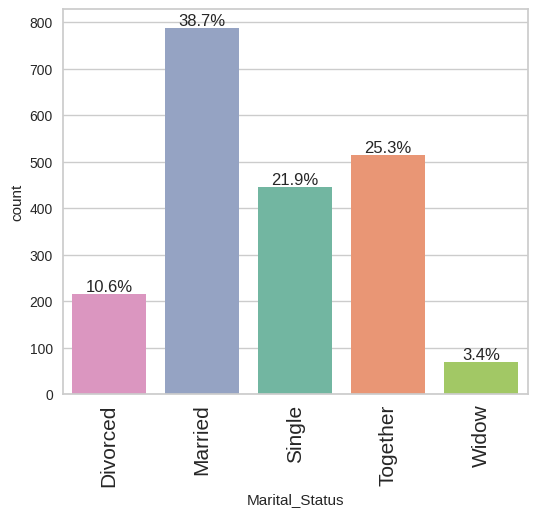

In [62]:
labeled_barplot(df,'Marital_Status', perc=True)

In [63]:
# We need to convert or Dt_Customer field to an actual Datetime Format
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

In [64]:
# We'll also add a field that's just the year part so we can get a better sense of how long our customers have been with us as a whole while graphing
df['Yr_Customer'] = df['Dt_Customer'].dt.year

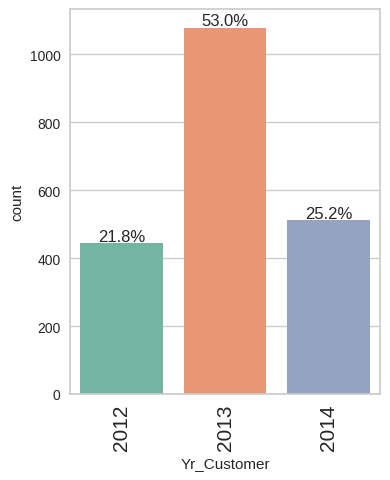

In [65]:
# looks like the bulk of the customers came in during 2013.  I wonder why they had a large increase from 2012 but then a similar drop in 2014.
labeled_barplot(df,'Yr_Customer', perc=True)

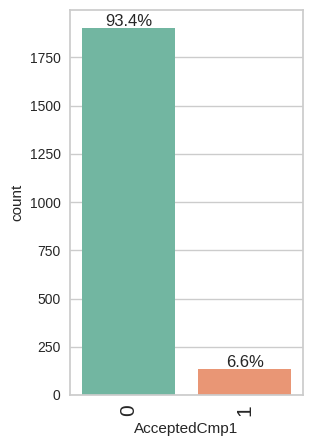

In [66]:
labeled_barplot(df,'AcceptedCmp1', perc=True)

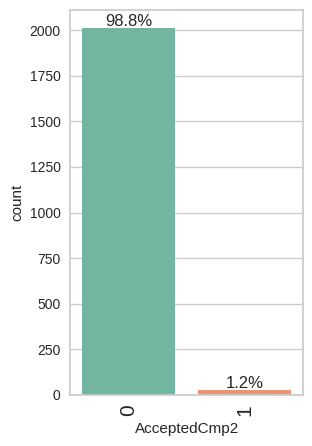

In [67]:
labeled_barplot(df,'AcceptedCmp2', perc=True)

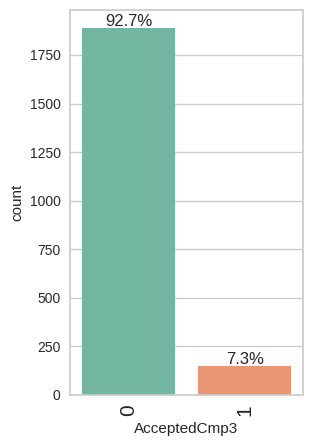

In [68]:
labeled_barplot(df,'AcceptedCmp3', perc=True)

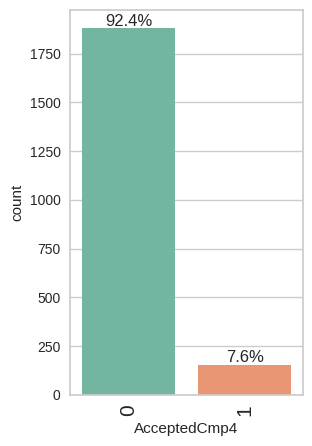

In [69]:
labeled_barplot(df,'AcceptedCmp4', perc=True)

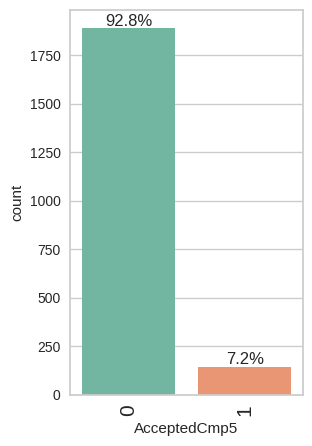

In [70]:
labeled_barplot(df,'AcceptedCmp5', perc=True)

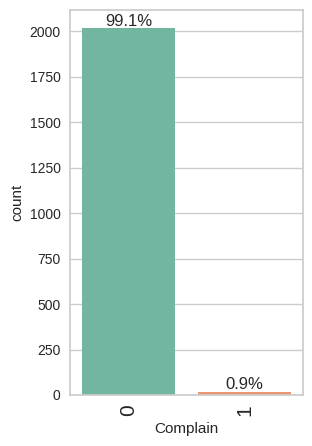

In [71]:
labeled_barplot(df,'Complain', perc=True)

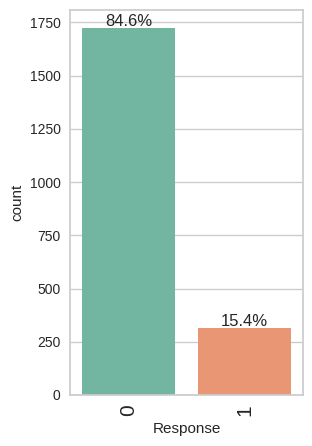

In [72]:
labeled_barplot(df,'Response', perc=True)

### **Bivariate Analysis**

 - Analyzing different categorical and numerical variables and checking how different variables are related to each other.
 - Checking the relationship of numerical variables with categorical variables.

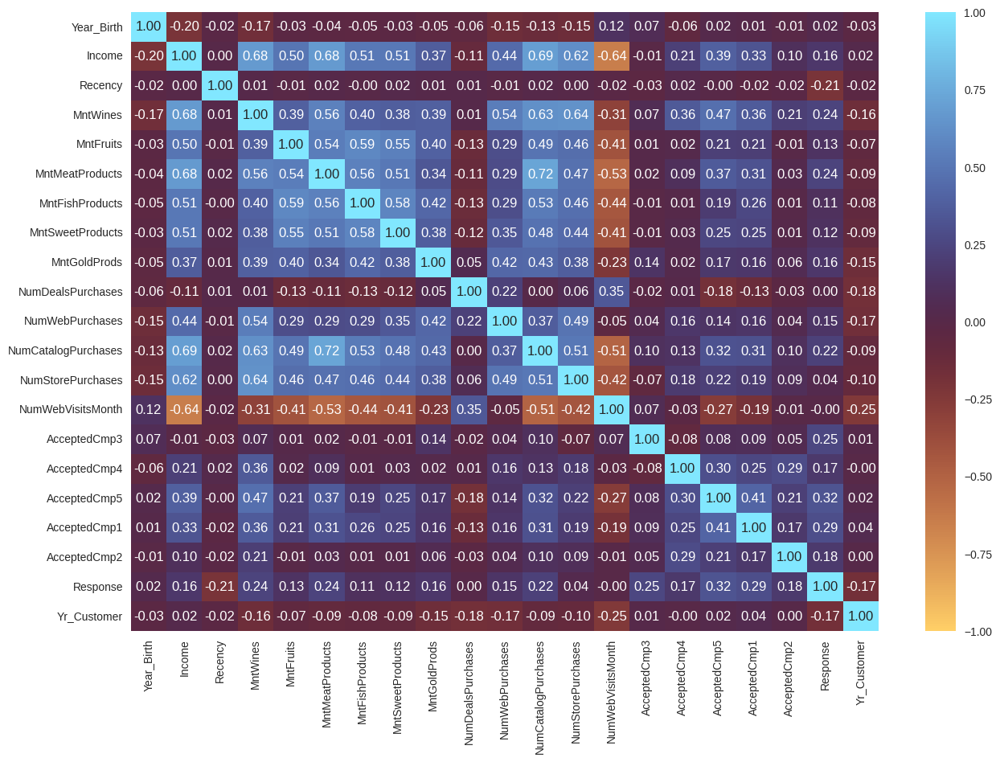

In [73]:
column_list = df.select_dtypes(include=np.number).columns.tolist()

column_list.remove('ID')
column_list.remove('Kidhome')
column_list.remove('Teenhome')
column_list.remove('Complain')

plt.figure(figsize=(15, 10))
sns.heatmap(df[column_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="managua")
plt.show()

<Axes: xlabel='Education', ylabel='Income'>

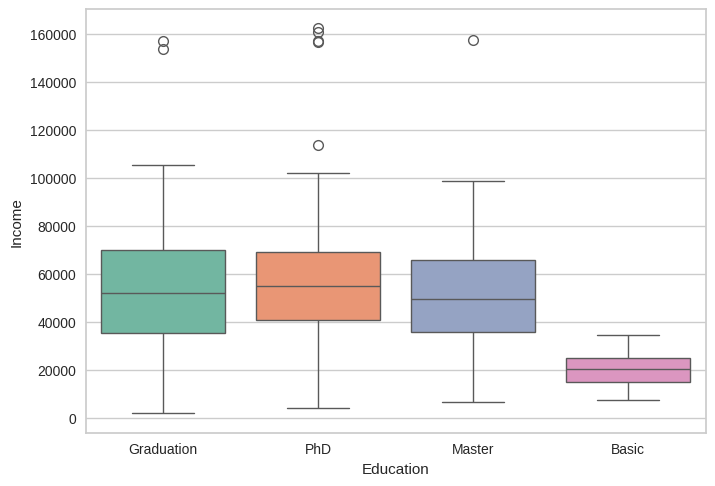

In [74]:
# Shows there is a correlation between income and a higher education
sns.boxplot(x='Education', y='Income', data=df, palette='Set2', hue='Education')

<Axes: xlabel='Marital_Status', ylabel='Income'>

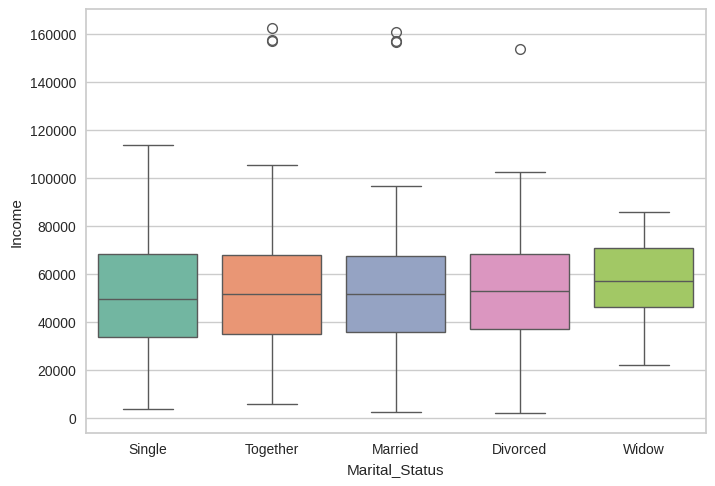

In [75]:
sns.boxplot(x='Marital_Status', y='Income', data=df, palette='Set2', hue='Marital_Status')

<Axes: xlabel='Kidhome', ylabel='Income'>

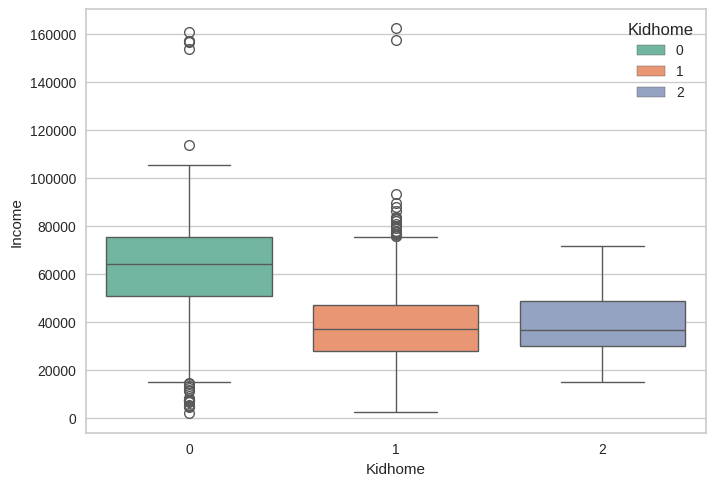

In [76]:
sns.boxplot(x='Kidhome', y='Income', data=df, palette='Set2', hue='Kidhome')

In [77]:
pd.crosstab(df['Kidhome'],df['Marital_Status'])

Marital_Status,Divorced,Married,Single,Together,Widow
Kidhome,,,,,
0,129,448,250,291,55
1,83,322,186,213,15
2,4,18,10,11,0


In [78]:
# We can see that divorced individuals tend to have more teens in the home than they do kids
pd.crosstab(df['Teenhome'],df['Marital_Status'])

Marital_Status,Divorced,Married,Single,Together,Widow
Teenhome,,,,,
0,91,400,276,256,28
1,119,367,160,247,41
2,6,21,10,12,1


### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values
- Creating new features with the data we have
- Combing features for PCA

### Extracting the age of each customer to create a new feature.

In [79]:
df['Age'] = 2016 - df['Year_Birth']

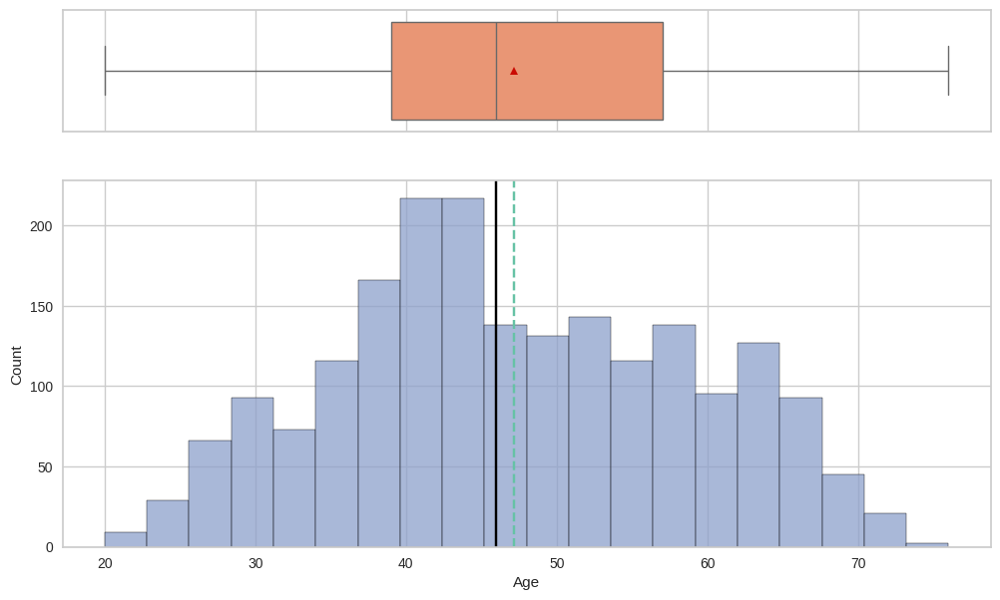

In [80]:
histogram_boxplot(df, 'Age')

In [81]:
df['MntFoods'] = df['MntMeatProducts']  + df['MntFishProducts'] + df['MntFruits']

In [82]:
df['MntLuxuryProducts'] = df['MntGoldProds']  + df['MntSweetProducts'] + df['MntWines']

<Axes: xlabel='Age', ylabel='MntFoods'>

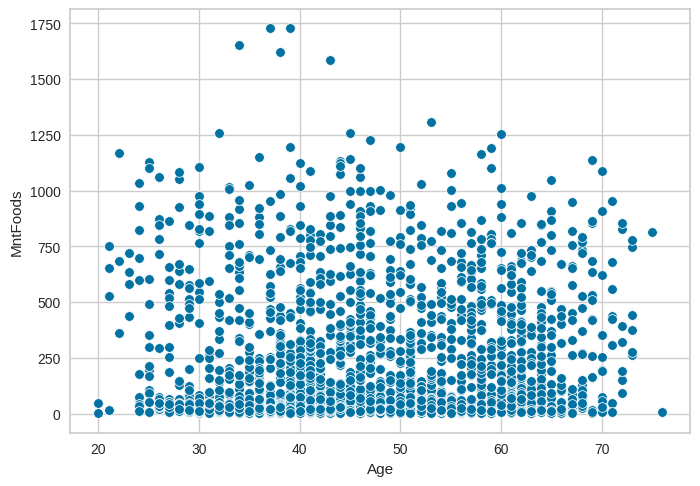

In [83]:
# Pretty even throughout maybe a bit less spending for those under 35/40
sns.scatterplot(x='Age', y='MntFoods', data=df)

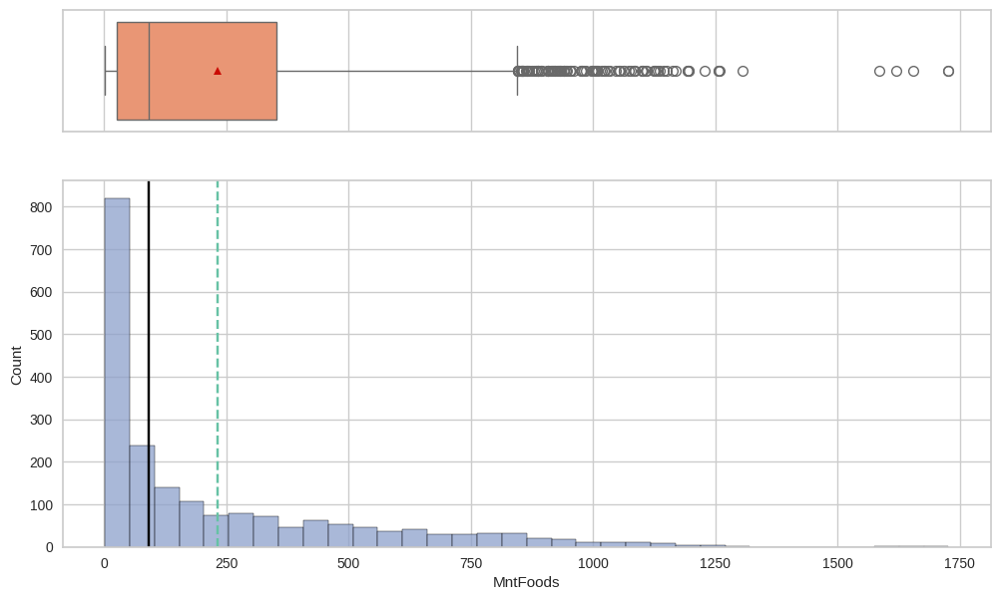

In [84]:
histogram_boxplot(df, 'MntFoods')

<Axes: xlabel='Age', ylabel='MntLuxuryProducts'>

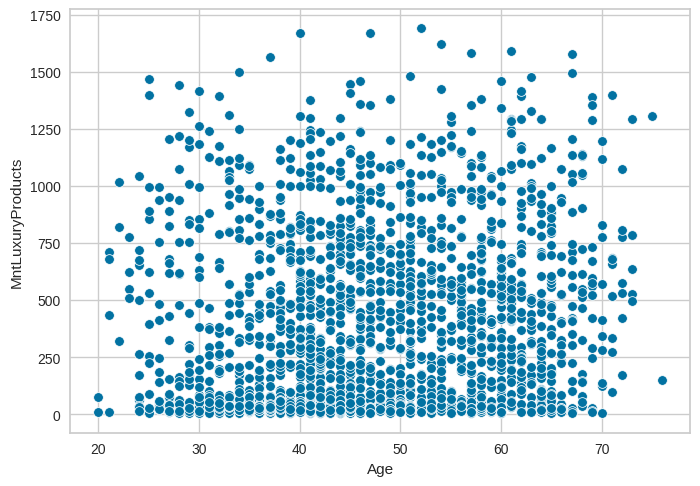

In [85]:
# This one is more obviously sparse where the age is under 40 and amount spent increases
sns.scatterplot(x='Age', y='MntLuxuryProducts', data=df)

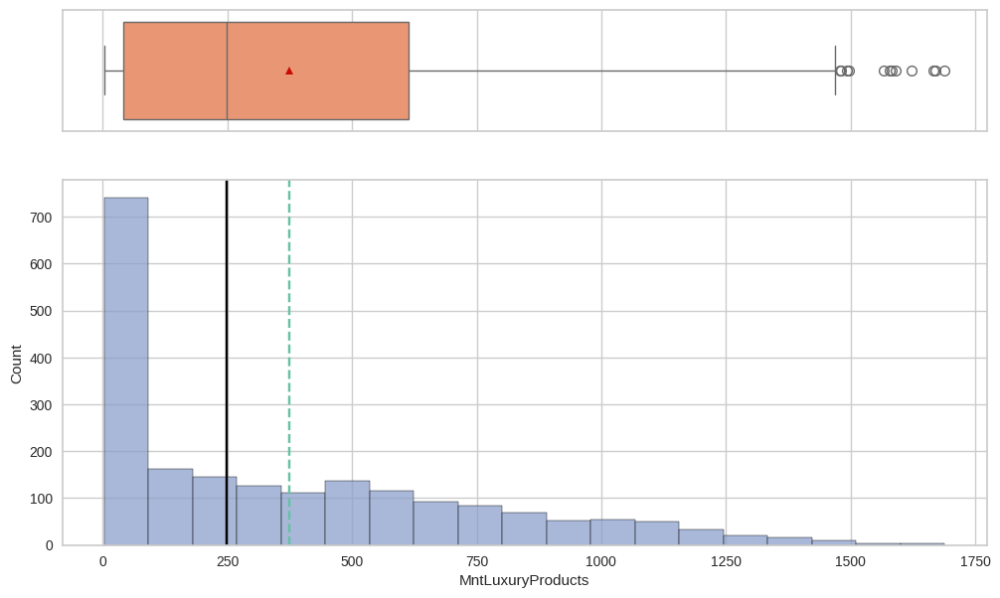

In [86]:
histogram_boxplot(df, 'MntLuxuryProducts')

### Determining the total number of dependants in a home to create a new feature.

In [87]:
df['Kids'] = df['Kidhome'] + df['Teenhome']

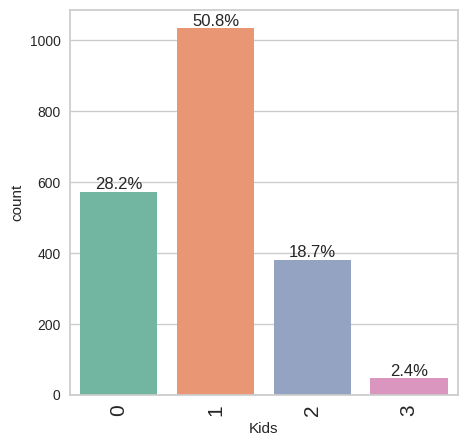

In [88]:
labeled_barplot(df,'Kids', perc=True)

<Axes: xlabel='Kids', ylabel='Income'>

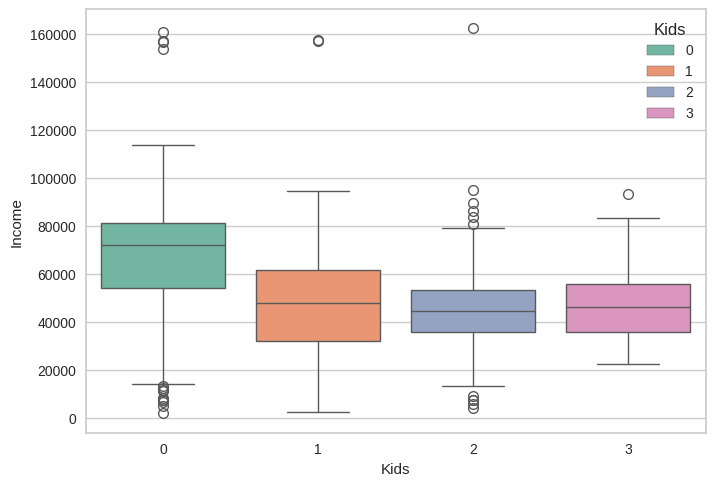

In [89]:
sns.boxplot(x='Kids', y='Income', data=df, palette='Set2', hue='Kids')

### Determining the total number of adults in a household and total number of people in a household.

In [90]:
df['Marital_Status'].value_counts()

,count
Marital_Status,
Married,788
Together,515
Single,446
Divorced,216
Widow,70


In [91]:
def adult_count(row):
  if row['Marital_Status'] == 'Single':
    return 1
  elif row['Marital_Status'] == 'Widow':
    return 1
  elif row['Marital_Status'] == 'Divorced':
    return 1
  elif row['Marital_Status'] == 'Married':
    return 2
  elif row['Marital_Status'] == 'Together':
    return 2
  else:
    return 0

In [92]:
df['Adults'] = df.apply(adult_count, axis=1)

In [93]:
df['Adults'].value_counts()

,count
Adults,
2,1303
1,732


In [94]:
df['Family_Size'] = df['Adults'] + df['Kids']

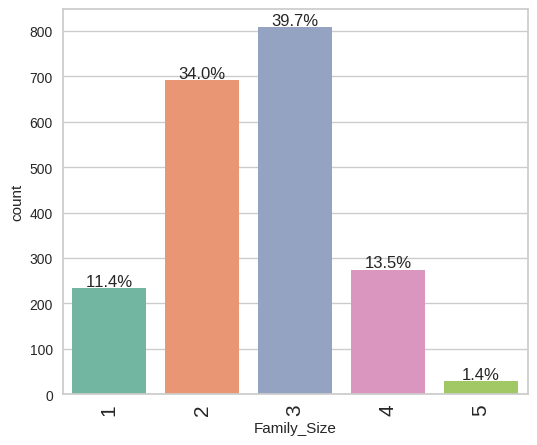

In [95]:
labeled_barplot(df,'Family_Size', perc=True)

### Determining a customer's total amount spent with us.

In [96]:
df['Expenses'] = df['MntLuxuryProducts'] + df['MntFoods']

<Axes: xlabel='Family_Size', ylabel='Expenses'>

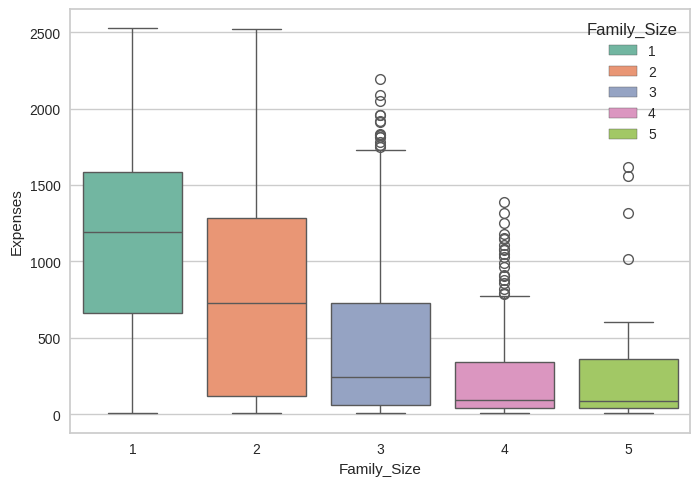

In [97]:
# Honestly this surprised me a bit.  I expected expenses to increase with family size but this could be because bigger families have to stretch their money further they might be spending more with other companies or making more sale purchases to make their money go further.
sns.boxplot(x='Family_Size', y='Expenses', data=df, palette='Set2', hue='Family_Size')

<Axes: xlabel='Age', ylabel='Expenses'>

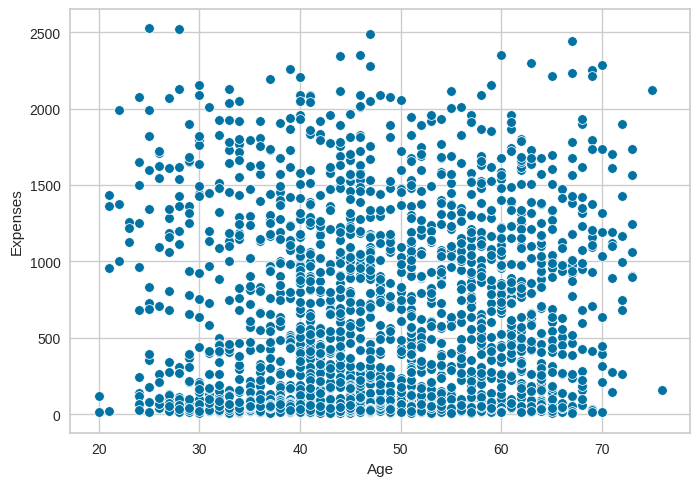

In [98]:
# Similar to the Luxury Goods by Age scatterplot
sns.scatterplot(x='Age', y='Expenses', data=df)

### Finding the total number of purchases made by each customer.

In [99]:
# Thought process here is that Web, Catalog, and Store signify purchases while df['NumDealsPurchases'] is how many of those purchases were made with a discount
df['NumTotalPurchases'] = df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases']

<Axes: xlabel='NumTotalPurchases', ylabel='Income'>

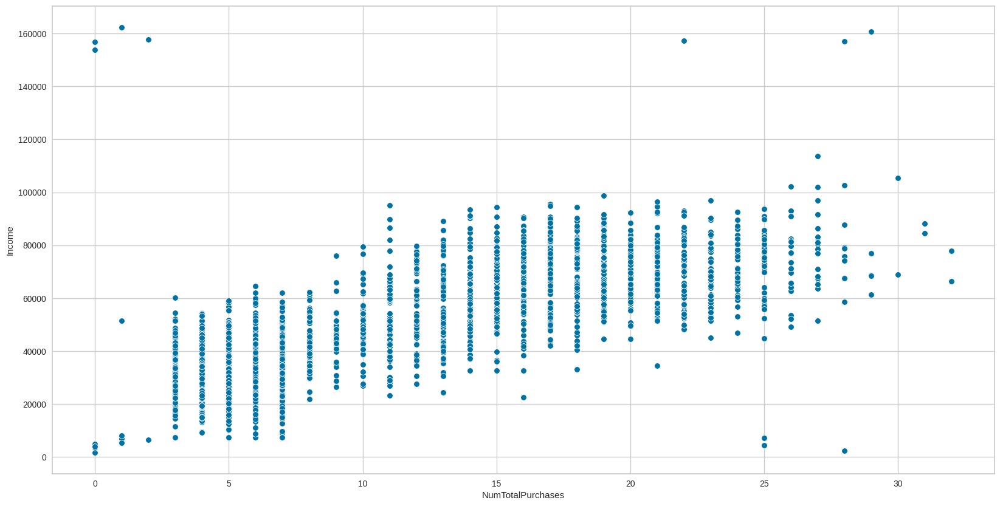

In [100]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data = df, x='NumTotalPurchases', y='Income')

In [101]:
# ID 5376 spending over half their income on meats out of the catalog
df[(df['Income'] < 5000) & (df['NumTotalPurchases'] > 25)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases
21,5376,1979,Graduation,Married,2447,1,0,2013-01-06,42,1,1,1725,1,1,1,15,0,28,0,1,0,0,0,0,0,0,0,2013,37,1727,3,1,2,3,1730,28


In [102]:
# Our Graph also shows that we have some entries that made no purchases.  We don't really want them in our dataset since or analysis is on purchases and they could potentially cause us to hit some problems in the future like division by 0
df[df['NumTotalPurchases'] == 0]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases
655,5555,1975,Graduation,Divorced,153924,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2014,41,3,3,0,1,1,6,0
981,3955,1965,Graduation,Divorced,4861,0,0,2014-06-22,20,2,1,1,1,0,1,0,0,0,0,14,0,0,0,0,0,0,0,2014,51,3,3,0,1,1,6,0
1245,6862,1971,Graduation,Divorced,1730,0,0,2014-05-18,65,1,1,3,1,1,1,15,0,0,0,20,0,0,0,0,0,0,0,2014,45,5,3,0,1,1,8,0
1524,11110,1973,Graduation,Single,3502,1,0,2013-04-13,56,2,1,1,0,0,1,0,0,0,0,14,0,0,0,0,0,0,0,2013,43,2,3,1,1,2,5,0
1846,9931,1963,PhD,Married,4023,1,1,2014-06-23,29,5,0,1,1,1,1,15,0,0,0,19,0,0,0,0,0,0,0,2014,53,2,7,2,2,4,9,0
2132,11181,1949,PhD,Married,156924,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2013,67,4,4,0,2,2,8,0


In [103]:
# Dropping our zero purchase friends and resetting our index (Down to 2031 data points)
df = df.drop(df[df.NumTotalPurchases == 0].index).reset_index(drop=True)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases
0,5524,1957,Graduation,Single,58138,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,2012,59,806,811,0,1,1,1617,22
1,2174,1954,Graduation,Single,46344,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,2014,62,9,18,2,1,3,27,4
2,4141,1965,Graduation,Together,71613,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,2013,51,287,489,0,2,2,776,20
3,6182,1984,Graduation,Together,26646,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,2014,32,34,19,1,2,3,53,6
4,5324,1981,PhD,Married,58293,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,2014,35,207,215,1,2,3,422,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024,8080,1986,Graduation,Single,26816,0,0,2012-08-17,50,5,1,6,3,4,3,1,0,0,3,4,0,0,0,0,0,0,0,2012,30,10,12,0,1,1,22,3
2025,10870,1967,Graduation,Married,61223,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,2013,49,267,1074,1,2,3,1341,16
2026,7270,1981,Graduation,Divorced,56981,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,2014,35,297,944,0,1,1,1241,18
2027,8235,1956,Master,Together,69245,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,2014,60,324,519,1,2,3,843,21


In [104]:
# There is also this person whose behaviour is rather abberant making a single huge meat purchase.  They would not likely not fit the profile of our other customers without heavily skewing the clustering so I think we should remove them
df[(df['NumTotalPurchases'] == 1) & (df['MntMeatProducts'] == 1607)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases
2020,8720,1978,Master,Together,51381,0,0,2012-08-12,53,32,2,1607,12,4,22,0,0,0,1,0,0,1,0,0,0,0,0,2012,38,1621,58,0,2,2,1679,1


In [105]:
# # Down to 2028 data points
df = df.drop(df[(df['NumTotalPurchases'] == 1) & (df['MntMeatProducts'] == 1607)].index).reset_index(drop=True)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases
0,5524,1957,Graduation,Single,58138,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,2012,59,806,811,0,1,1,1617,22
1,2174,1954,Graduation,Single,46344,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,2014,62,9,18,2,1,3,27,4
2,4141,1965,Graduation,Together,71613,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,2013,51,287,489,0,2,2,776,20
3,6182,1984,Graduation,Together,26646,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,2014,32,34,19,1,2,3,53,6
4,5324,1981,PhD,Married,58293,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,2014,35,207,215,1,2,3,422,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023,8080,1986,Graduation,Single,26816,0,0,2012-08-17,50,5,1,6,3,4,3,1,0,0,3,4,0,0,0,0,0,0,0,2012,30,10,12,0,1,1,22,3
2024,10870,1967,Graduation,Married,61223,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,2013,49,267,1074,1,2,3,1341,16
2025,7270,1981,Graduation,Divorced,56981,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,2014,35,297,944,0,1,1,1241,18
2026,8235,1956,Master,Together,69245,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,2014,60,324,519,1,2,3,843,21


<Axes: xlabel='NumTotalPurchases', ylabel='Expenses'>

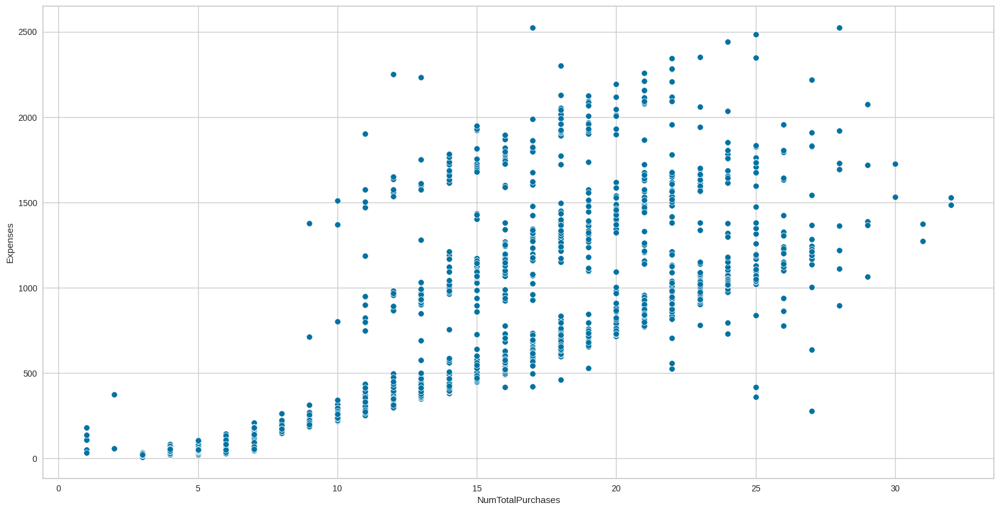

In [106]:
# Expenses trending upward with number of purchases but in groups that likely indicate people purchasing more expensive catagory or quality of products
# Looks like 3 visible clusters of data points showing variations of more and less frugal people in the same income brackets
plt.figure(figsize=(20, 10))
sns.scatterplot(data = df, x='NumTotalPurchases', y='Expenses')

<Axes: xlabel='Income', ylabel='Expenses'>

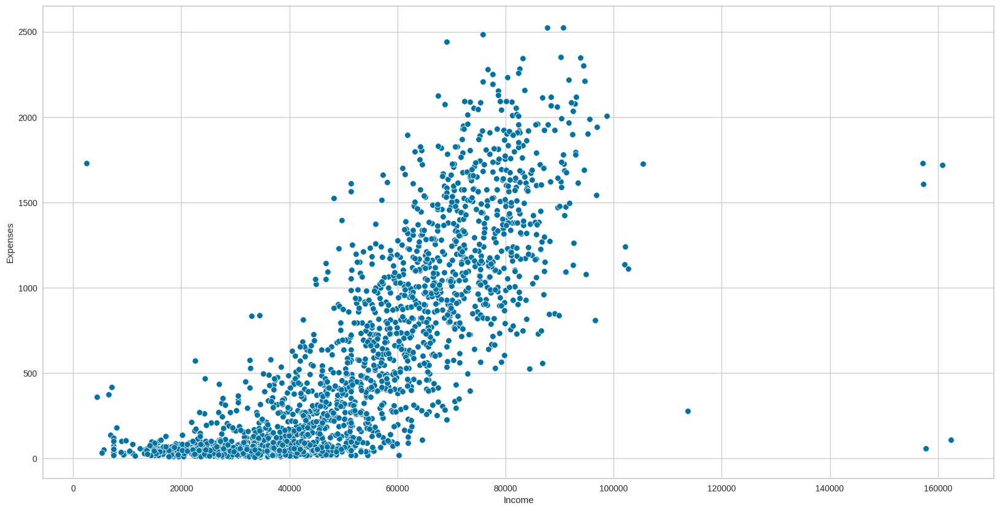

In [107]:
# Expenses trending upward with income
plt.figure(figsize=(20, 10))
sns.scatterplot(data = df, x='Income', y='Expenses')

### Determining total number of campaign offers accepted by each customer

In [108]:
df['TotalAcceptedCmp'] = df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp3'] + df['AcceptedCmp4'] + df['AcceptedCmp5'] + df['Response']

In [109]:
pd.crosstab(df['TotalAcceptedCmp'], df['Family_Size'])

Family_Size,1,2,3,4,5
TotalAcceptedCmp,,,,,
0,110,469,639,225,25
1,58,120,121,38,2
2,31,56,36,8,1
3,15,24,6,2,0
4,12,17,5,0,0
5,4,3,1,0,0


### Determining each customer's amount spent per purchase.

In [110]:
# AmountPerPurchase indicating amount of money spent on each purchase
df['AmountPerPurchase'] = (df['Expenses'] / df['NumTotalPurchases']).round(2)

<Axes: xlabel='AmountPerPurchase', ylabel='Income'>

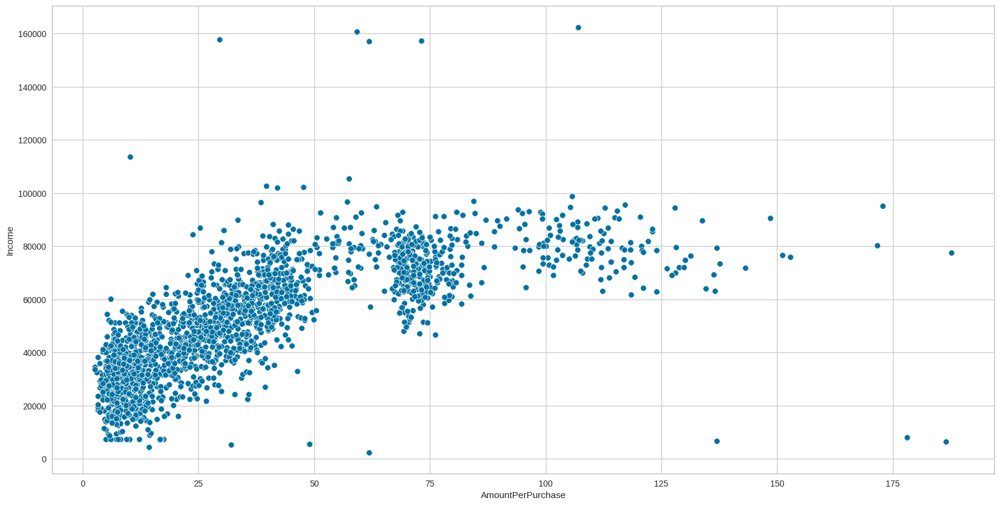

In [111]:
# As income brackets goes up people tend to spend more per purchase / buy more expensive
# Looks like there are 3 different levels of goods
plt.figure(figsize=(20, 10))
sns.scatterplot(data = df[(df['AmountPerPurchase'] < 1500)], x='AmountPerPurchase', y='Income')

### Calculating days engaged

In [112]:
# Dt_Customer is the date of the customer's enrollment with the company but we're not given the exact date the data was last collected.

In [113]:
df['Dt_Customer'].max()

Timestamp('2014-06-29 00:00:00')

In [114]:
df['Dt_Customer'].min()

Timestamp('2012-07-30 00:00:00')

In [115]:
# Dt_Customer is the only date field we have other than birthyear and the last signup date we have in the data set is 2014-06-29.

In [116]:
# We can see from observing the last month of sign ups in the data set that the values for Recency regularly exceed 30 days so clearly data collection on sales has continued past the point when people continued to sign up.
with pd.option_context('display.max_rows', None):
  display(df[df['Dt_Customer'] > '2014-06-01'].sort_values(by=['Dt_Customer']))

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases,TotalAcceptedCmp,AmountPerPurchase
1040,4790,1958,Graduation,Divorced,79803,0,1,2014-06-02,54,574,8,216,21,16,33,1,4,3,5,1,0,0,0,0,0,0,0,2014,58,245,623,1,1,2,868,12,0,72.33
1874,10509,1955,Master,Single,36927,1,1,2014-06-02,46,51,0,16,0,0,4,2,3,0,3,8,0,0,0,0,0,0,0,2014,61,16,55,2,1,3,71,6,0,11.83
1732,6892,1968,Graduation,Divorced,61671,0,1,2014-06-03,23,641,7,56,0,0,28,8,10,4,6,8,0,1,0,1,0,0,0,2014,48,63,669,1,1,2,732,20,2,36.60
705,6255,1952,Master,Together,70545,0,1,2014-06-03,29,138,39,63,55,18,21,1,4,1,7,2,0,0,0,0,0,0,0,2014,64,157,177,1,2,3,334,12,0,27.83
1552,7788,1983,PhD,Married,23536,1,0,2014-06-04,53,6,0,3,0,0,1,1,0,0,3,3,0,0,0,0,0,0,0,2014,33,3,7,1,2,3,10,3,0,3.33
1000,9725,1966,PhD,Together,28764,1,1,2014-06-05,16,8,0,3,0,0,1,1,1,0,2,8,1,0,0,0,0,0,0,2014,50,3,9,2,2,4,12,3,1,4.00
407,6528,1982,Master,Together,18492,1,0,2014-06-05,75,2,2,2,2,1,1,1,1,0,2,8,0,0,0,0,0,0,0,2014,34,6,4,1,2,3,10,3,0,3.33
239,7411,1964,PhD,Married,31686,1,1,2014-06-05,31,11,0,5,0,0,1,2,1,0,3,6,0,0,0,0,0,0,0,2014,52,5,12,2,2,4,17,4,0,4.25
1648,8439,1964,Graduation,Together,63404,0,2,2014-06-06,97,734,26,70,11,44,17,2,6,3,4,4,0,0,0,1,0,0,0,2014,52,107,795,2,2,4,902,13,1,69.38
53,2225,1977,Graduation,Divorced,82582,0,0,2014-06-07,54,510,120,550,156,40,241,1,4,9,7,1,1,0,0,1,0,0,1,2014,39,826,791,0,1,1,1617,20,3,80.85


In [117]:
# Checking signup dates of customers who have had the most amount of time pass since they last ordered something and ordering it by signup date.
df[df['Recency'] == df['Recency'].max()].sort_values(by=['Dt_Customer'])

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Yr_Customer,Age,MntFoods,MntLuxuryProducts,Kids,Adults,Family_Size,Expenses,NumTotalPurchases,TotalAcceptedCmp,AmountPerPurchase
1374,4070,1969,PhD,Married,94871,0,2,2012-09-01,99,169,24,553,188,0,144,1,8,5,4,7,0,1,1,0,0,0,1,2012,47,765,313,2,2,4,1078,17,3,63.41
1434,528,1978,Graduation,Married,65819,0,0,2012-11-29,99,267,38,701,149,165,63,1,5,4,10,3,0,0,0,0,0,0,0,2012,38,888,495,0,2,2,1383,19,0,72.79
473,22,1976,Graduation,Divorced,46310,1,0,2012-12-03,99,185,2,88,15,5,14,2,6,1,5,8,0,0,0,0,0,0,0,2012,40,105,204,1,1,2,309,12,0,25.75
984,5263,1977,Master,Married,31056,1,0,2013-01-22,99,5,10,13,3,8,16,1,1,0,3,8,0,0,0,0,0,0,0,2013,39,26,29,1,2,3,55,4,0,13.75
657,10142,1976,PhD,Divorced,66476,0,1,2013-03-07,99,372,18,126,47,48,78,2,5,2,11,4,0,0,0,0,0,0,0,2013,40,191,498,1,1,2,689,18,0,38.28
672,9977,1973,Graduation,Divorced,78901,0,1,2013-09-17,99,321,11,309,33,26,34,3,9,3,5,4,0,0,0,0,0,0,0,2013,43,353,381,1,1,2,734,17,0,43.18
38,8595,1973,Graduation,Widow,42429,0,1,2014-02-11,99,55,0,6,2,0,4,2,1,1,3,5,0,0,0,0,0,0,0,2014,43,8,59,1,1,2,67,5,0,13.40
428,2106,1974,Master,Married,20130,0,0,2014-03-17,99,0,6,3,7,6,12,1,1,0,3,8,0,0,0,0,0,0,0,2014,42,16,18,0,2,2,34,4,0,8.50
1554,7947,1969,Graduation,Married,42231,1,1,2014-03-25,99,24,0,8,0,1,4,1,1,0,3,5,0,0,0,0,0,0,0,2014,47,8,29,2,2,4,37,4,0,9.25
1665,2415,1962,Graduation,Together,62568,0,1,2014-04-07,99,362,17,398,80,35,61,3,5,3,5,4,0,0,0,1,0,0,0,2014,54,495,458,1,2,3,953,13,1,73.31


In [118]:
# Given our max Receny value occurs so close to our max Dt_Customer value it suggest we can use them to determine aproximatly the last date this data set was update.
max_date = (df['Dt_Customer'] + pd.to_timedelta(df['Recency'], unit='D')).max()
max_date

Timestamp('2014-10-04 00:00:00')

In [119]:
# We don't know exactly what the schedule for the data collection is so just for safety we should assume some extra time past 2014-10-4.
# Additionally since our spending fields are based of $ amount spent in the last 2 years it would feel appropriate to me to use the start of the new year as our cut off to count back from.
df['Days_Engaged'] = (pd.to_datetime('2015-01-01') - df['Dt_Customer']).dt.days

In [120]:
df['Days_Engaged'].describe()

,Days_Engaged
count,2028.000000
mean,538.466963
std,201.733933
min,186.000000
25%,365.000000
50%,538.000000
75%,714.000000
max,885.000000


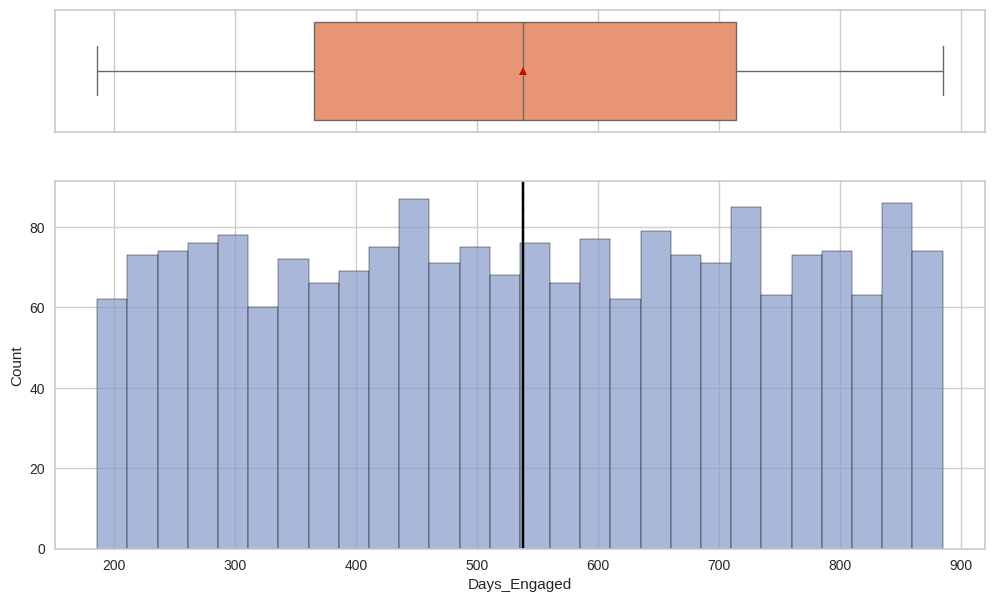

In [121]:
histogram_boxplot(df, 'Days_Engaged', bins=28)

## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

In [122]:
# Creating new dataframe keeping only our features that describe customer behavior.
data = df.drop(
    columns = [
            # Inconsequential Fields
              'ID'
              ,'Complain'
              ,'Recency'

            # Demographic Data fields
              ,'Education'
              ,'Marital_Status'
              ,'Income'
              ,'Age'
              ,'Family_Size'

            # Removed in favor of features we've constructed ourselves. (Reduce multicollinearity)
              ,'MntFishProducts'
              ,'MntMeatProducts'
              ,'MntFruits'
              ,'MntSweetProducts'
              ,'MntWines'
              ,'MntGoldProds'

              ,'AcceptedCmp1'
              ,'AcceptedCmp2'
              ,'AcceptedCmp3'
              ,'AcceptedCmp4'
              ,'AcceptedCmp5'
              ,'Response'

              ,'Year_Birth'
              ,'Dt_Customer'
              ,'Yr_Customer'

              ,'Kidhome'
              ,'Teenhome'
              ,'Kids'
              ,'Adults'

            # Removed because I think I'll get useful insights from the original fields (Reduce multicollinearity by keeping it out)
              ,'NumTotalPurchases'
              # ,'NumWebPurchases'
              # ,'NumCatalogPurchases'
              # ,'NumStorePurchases'
               ],
              axis=1,
)

In [123]:
data

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,MntFoods,MntLuxuryProducts,Expenses,TotalAcceptedCmp,AmountPerPurchase,Days_Engaged
0,3,8,10,4,7,806,811,1617,1,73.50,849
1,2,1,1,2,5,9,18,27,0,6.75,299
2,1,8,2,10,4,287,489,776,0,38.80,498
3,2,2,0,4,6,34,19,53,0,8.83,325
4,5,5,3,6,5,207,215,422,0,30.14,347
...,...,...,...,...,...,...,...,...,...,...,...
2023,1,0,0,3,4,10,12,22,0,7.33,867
2024,2,9,3,4,5,267,1074,1341,0,83.81,567
2025,1,2,3,13,6,297,944,1241,1,68.94,341
2026,2,6,5,10,3,324,519,843,0,40.14,342


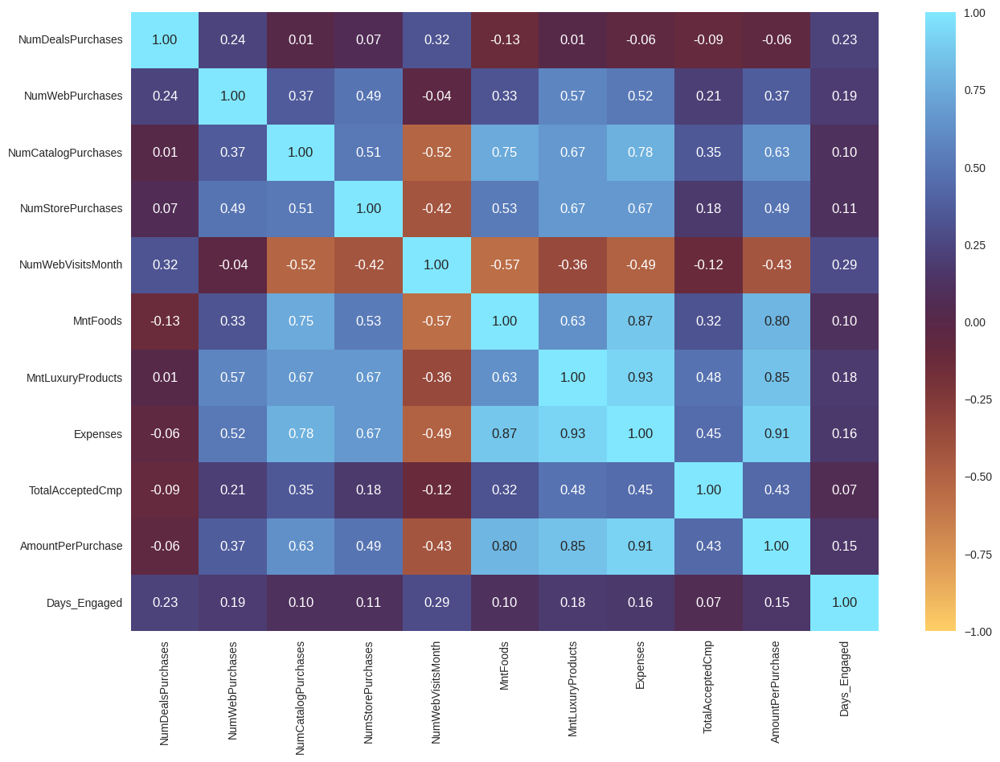

In [124]:
column_list_pca = data.columns.tolist()
plt.figure(figsize=(15, 10))
sns.heatmap(data[column_list_pca].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="managua")
plt.show()

### Applying a scalar to our data
StandardScaler standardizes a feature by subtracting the mean and then scaling to unit variance. Unit variance means dividing all the values by the standard deviation.

* Doing this rescales all our features so that they have a mean of 0 and a variance of 1.  
* The purpose is to bring all our features onto a common scale without changing the differences in the range of the values.
* Having data that is on a standard scale helps avoid the problem of having one feature that is on a larger scale from dominating the others because the unsupervised learning algorithms rely on distance to find the similarity between data points.

In [125]:
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data), columns = data.columns)
data_scaled.head()

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,MntFoods,MntLuxuryProducts,Expenses,TotalAcceptedCmp,AmountPerPurchase,Days_Engaged
0,0.357370,1.389625,2.495646,-0.557511,0.715891,2.006757,1.151412,1.679428,0.611926,1.190563,1.539699
1,-0.170871,-1.114770,-0.568222,-1.177716,-0.125504,-0.777567,-0.946377,-0.965266,-0.508097,-1.021009,-1.187336
2,-0.699112,1.389625,-0.227792,1.303102,-0.546201,0.193628,0.299599,0.280568,-0.508097,0.040877,-0.200645
3,-0.170871,-0.756999,-0.908652,-0.557511,0.295193,-0.690229,-0.943731,-0.922019,-0.508097,-0.952094,-1.058422
4,1.413853,0.316313,0.112637,0.062693,-0.125504,-0.085853,-0.425236,-0.308251,-0.508097,-0.246048,-0.949340


## **Applying T-SNE (t-distributed Stochastic Neighbor Embedding) and PCA (Principal Component Analysis) to the data to visualize the data distributed in 2 to 3 dimensions**

In [126]:
# Fitting T-SNE with number of components equal to 2 to visualize how data is distributed
def tsne(p):
  tsne2 = TSNE(n_components = 2, random_state = 1, perplexity = p) # Initializing T-SNE with perplexity p
  data_tsne2 = tsne2.fit_transform(data_scaled)                    # fit_transform T-SNE on new data
  data_tsne2 = pd.DataFrame(data_tsne2, columns=[0, 1])            # Converting the embeddings to a dataframe
  plt.figure(figsize=(7, 7))                                       # Scatter plot for two components
  sns.scatterplot(x=0, y=1, data=data_tsne2)


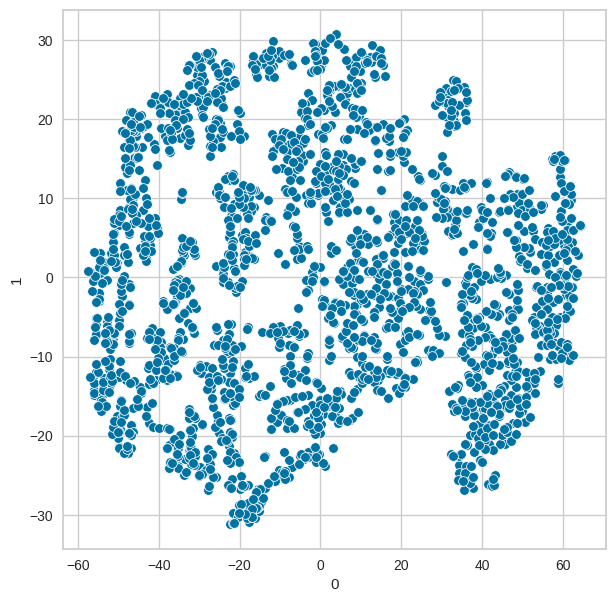

In [127]:
tsne(35)

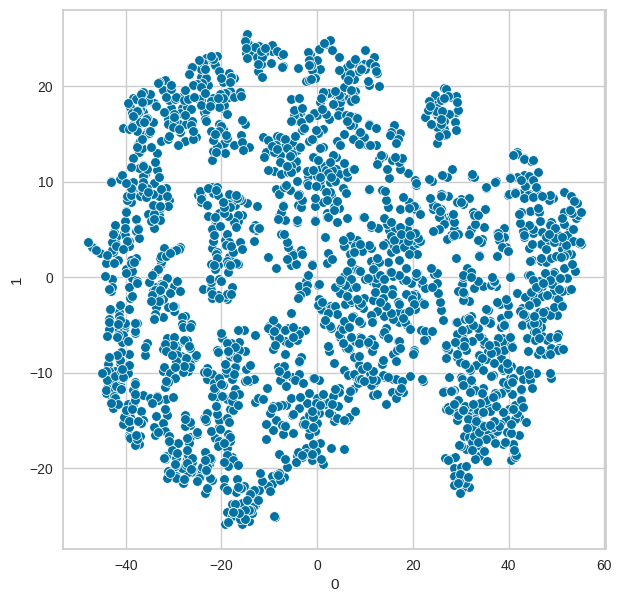

In [128]:
tsne(50)

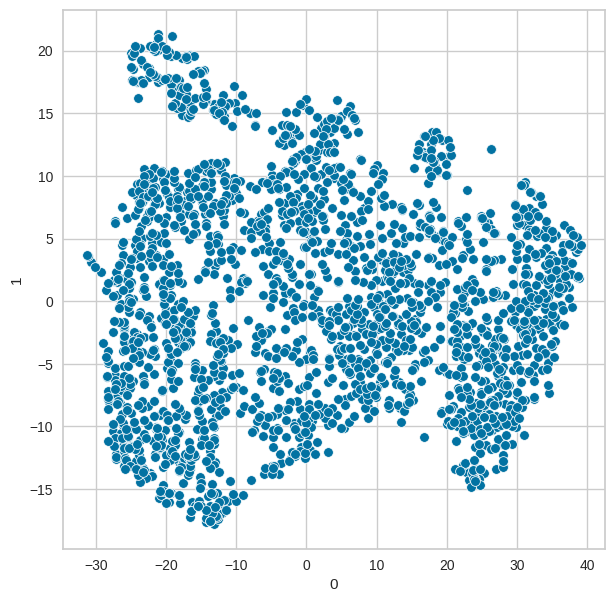

In [129]:
tsne(85)

In [130]:
# T-SNE with 3 components
tsne3 = TSNE(n_components = 3, random_state = 1, perplexity = 35)
data_tsne3 = tsne3.fit_transform(data_scaled)
data_tsne3 = pd.DataFrame(data_tsne3, columns = ['X1', 'X2', 'X3'])

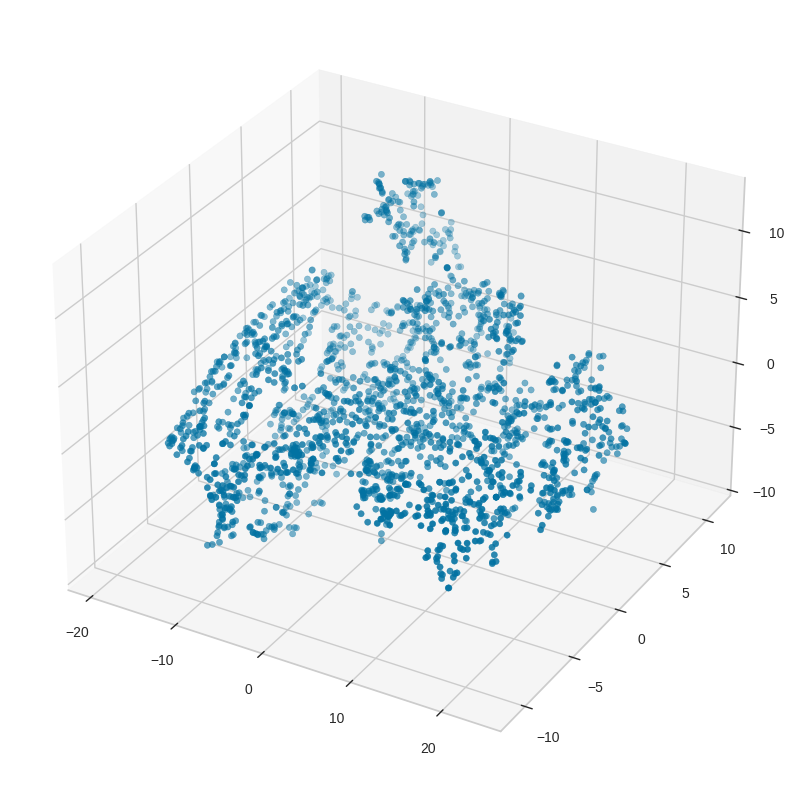

In [131]:
# Scatter plot for all three components
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111, projection = '3d')
x = data_tsne3['X1']
y = data_tsne3['X2']
z = data_tsne3['X3']
ax.scatter(x, y, z)
plt.show()

**Observation and Insights:** T-SNE when reduced to 2 dimensions with various perpexity values results in some very obserable clustering with it converginging a bit into a more blob shape once you reach 85 perplexity.
Trying to evaluate T-SNE in 3 dimensions is more difficulty to evaluate but I do see what appears to be about 3 or 4 different pillars of data points.

### **Applying PCA**

When the variables used in clustering are highly correlated, it causes multicollinearity, which affects the clustering method and results in poor cluster profiling (or biased toward a few variables). Because of this we will use PCA to reduce the multicollinearity between the variables before we determine the number of clusters to use.

In [132]:
# Defining the number of principal components to generate
n = data_scaled.shape[1]                                      # Storing the number of variables in the data
pca = PCA(n_components = n, random_state = 1)                 # Initialize PCA with n_components = n and random_state=1
data_pca = pd.DataFrame(pca.fit_transform(data_scaled))       # fit_transform PCA on the scaled data # create data_pca

# The percentage of variance explained by each principal component is stored
exp_var = pca.explained_variance_ratio_

**Let's plot the first two components and see how the data points are distributed.**

In [133]:
ncomponents = data_scaled.shape[1]

In [134]:
data_scaled.shape[1]

11

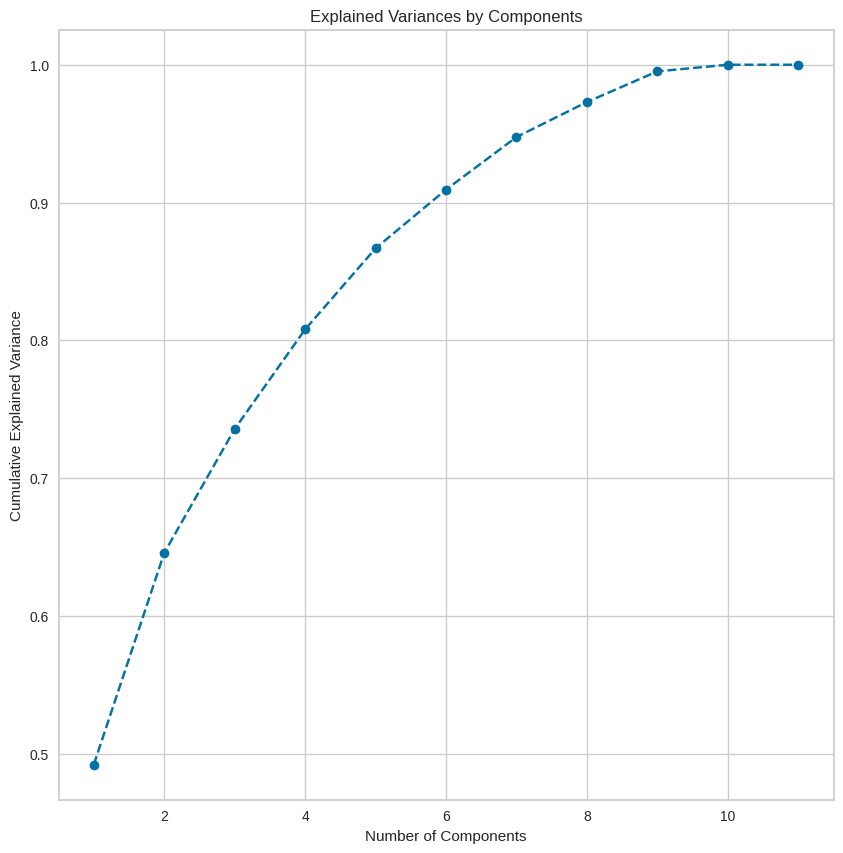

In [135]:
# Scatter plot for two components using the dataframe data_pca
plt.figure(figsize = (10, 10))
plt.plot(range(1, ncomponents + 1), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title("Explained Variances by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.show()

In [136]:
# Finding the least number of components that can explain more than 70% variance
sum = 0
min = 0

for ix, i in enumerate(exp_var):

    sum = sum + i

    if(sum>0.85):
        print("Number of PCs that explain at least 85% variance:", ix + 1)
        min = ix + 1
        break

Number of PCs that explain at least 85% variance: 5


In [137]:
reduction = int((1 - min / ncomponents ) * 100)
print(f'This represnts a {reduction}% reduction in dimensionality with only a 15% loss in variance')

This represnts a 54% reduction in dimensionality with only a 15% loss in variance


In [138]:
pc_comps = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']

data_pca_t = pd.DataFrame(np.round(pca.components_[:5,:],2), index = pc_comps, columns = data_scaled.columns)

data_pca_t.T

,PC1,PC2,PC3,PC4,PC5
NumDealsPurchases,-0.02,0.56,-0.35,-0.15,0.69
NumWebPurchases,0.24,0.38,-0.23,-0.39,-0.44
NumCatalogPurchases,0.35,-0.05,-0.07,0.12,0.32
NumStorePurchases,0.31,0.08,-0.40,-0.06,-0.31
NumWebVisitsMonth,-0.24,0.49,0.29,-0.09,-0.10
MntFoods,0.37,-0.13,-0.01,0.27,0.17
MntLuxuryProducts,0.39,0.12,0.07,-0.13,-0.13
Expenses,0.42,0.01,0.04,0.04,-0.00
TotalAcceptedCmp,0.21,0.01,0.68,-0.49,0.17
AmountPerPurchase,0.38,-0.01,0.16,0.10,0.11


In [139]:
def color_high(val):

    if val <= -0.25:
        return 'background: pink'

    elif val >= 0.25:
        return 'background: skyblue'

data_pca_t.T.style.map(color_high)

,PC1,PC2,PC3,PC4,PC5
NumDealsPurchases,-0.020000,0.560000,-0.350000,-0.150000,0.690000
NumWebPurchases,0.240000,0.380000,-0.230000,-0.390000,-0.440000
NumCatalogPurchases,0.350000,-0.050000,-0.070000,0.120000,0.320000
NumStorePurchases,0.310000,0.080000,-0.400000,-0.060000,-0.310000
NumWebVisitsMonth,-0.240000,0.490000,0.290000,-0.090000,-0.100000
MntFoods,0.370000,-0.130000,-0.010000,0.270000,0.170000
MntLuxuryProducts,0.390000,0.120000,0.070000,-0.130000,-0.130000
Expenses,0.420000,0.010000,0.040000,0.040000,-0.000000
TotalAcceptedCmp,0.210000,0.010000,0.680000,-0.490000,0.170000
AmountPerPurchase,0.380000,-0.010000,0.160000,0.100000,0.110000


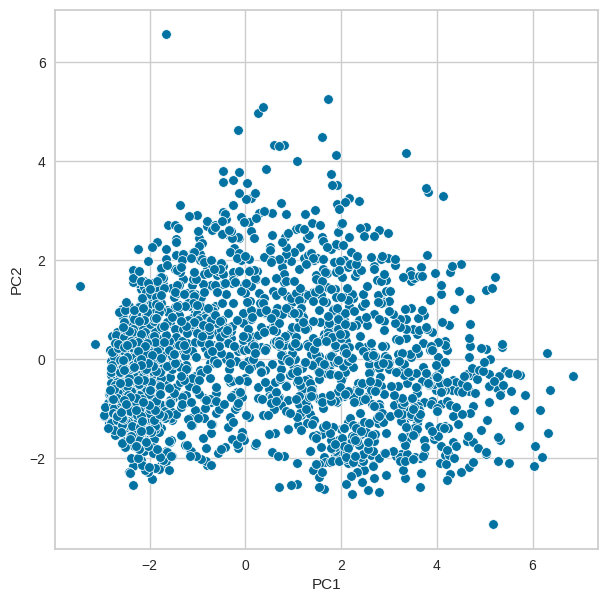

In [140]:
# This is the plot we will be breaking into clusters.
# I would cut it down the middle if I were doing it by eye maybe 3rds
plt.figure(figsize = (7,7))
sns.scatterplot(x = data_pca[0], y = data_pca[1])
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

## **K-Means**

In [141]:
# In order to determine the correct number of clusters to use i'll create an elbow plot
distortions = []                                                                                # list for distortion values
K = range(2, 12)                                                                                # Setting the K range from 2 to 12

for k in K:
    kmeanModel = KMeans(n_clusters=k,random_state=1, init='k-means++', n_init=20).fit(data_pca) # Initialize K-Means and Fit K-Means on the data
    distortions.append(kmeanModel.inertia_)                                                     # Append distortion values to the empty list created above

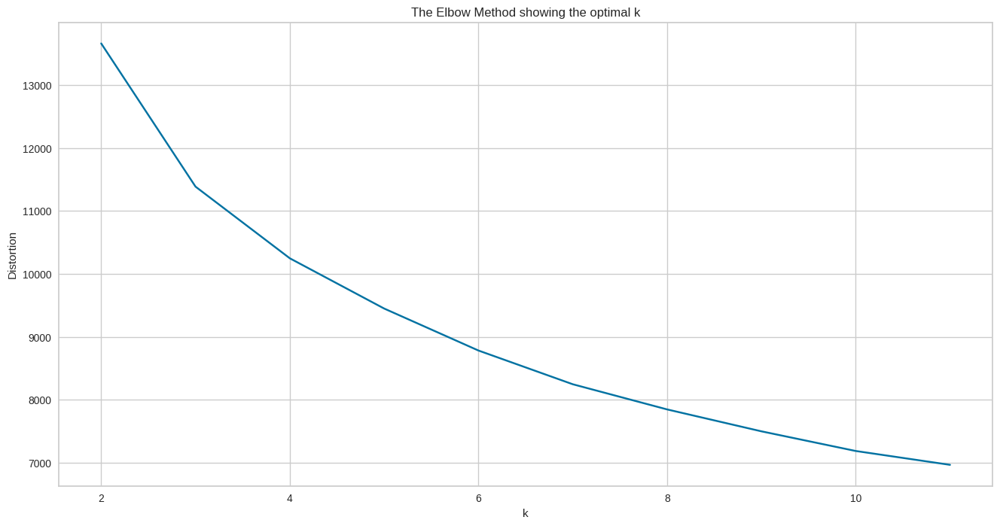

In [142]:
# Plotting the elbow plot
plt.figure(figsize=(16, 8))                                            # Setting the plot size
plt.plot(K, distortions, "bx-")                                        # Plotting the K on X-axis and distortions on y-axis
plt.xlabel("k")                                                        # Title of x-axis
plt.ylabel("Distortion")                                               # Title of y-axis
plt.title("The Elbow Method showing the optimal k")                    # Title of the plot
plt.show()

**In the above plot, there is a pretty consistent dip with no clear 'elbow' (Maybe at 3) but it's not particularly dramatic.  Lets try getting silhouette scores as well to see if we can find a clearer indicator.**

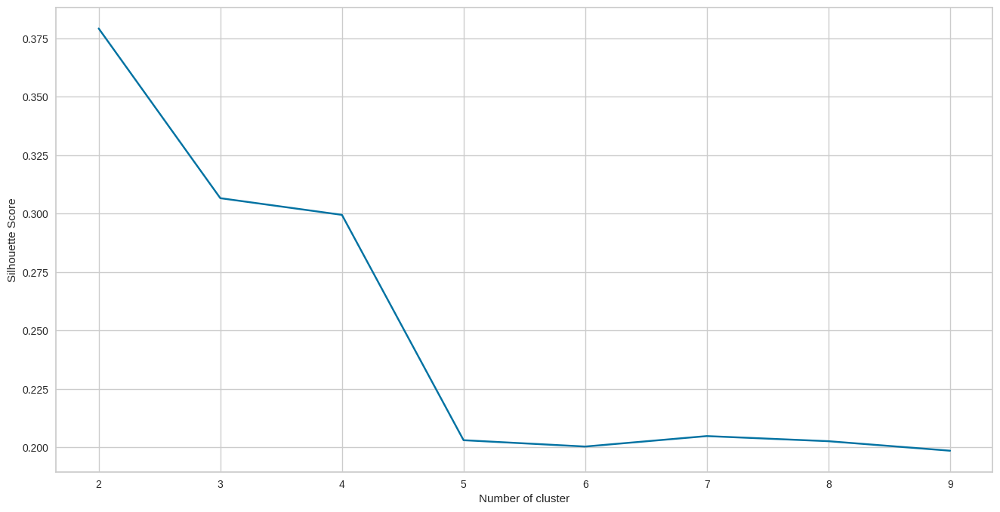

In [143]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=1, init='k-means++', n_init=10).fit(data_pca)

    labels = kmeans.predict(data_pca)

    sc[k] = silhouette_score(data_pca, labels)

# Elbow plot
plt.figure(figsize=(16, 8))
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()

## When charting our silhouette scores we are seeing prominent elbows at 3 and 5 clusters.

## However a higher silhouette score indicates that the clusters will be more well defined and since the silhouette score for our elbows is higher at 3 than at 5 i'll be beginning my analysis by breaking our data into 3 clusters.

In [144]:
sc

{2: 0.3792555895077021,
 3: 0.3066350048863182,
 4: 0.29950108399381564,
 5: 0.20308415455610584,
 6: 0.20037218298412512,
 7: 0.20484750154753342,
 8: 0.20265588461745748,
 9: 0.1985860345936792}

### **Cluster Profiling**

In [145]:
# Copy PCA DF to add labels to
df_kmeans3 = data_pca.copy()

In [146]:
# Initialize K-Means algorithm with 3 clusters and fitting to copy of PCA data frame
kmeans3 = KMeans(n_clusters=3, random_state=1, init='k-means++', n_init=20).fit(df_kmeans3)

In [147]:
# Adding cluster prediction labels to the data frame
df_kmeans3['KMeans_Labels3'] = kmeans3.predict(df_kmeans3)

In [148]:
# Checking the distribution of counts within the clusters
df_kmeans3['KMeans_Labels3'].value_counts().sort_values(ascending=True)

,count
KMeans_Labels3,
1,498
0,579
2,951


### **Applying KMeans on the PCA data and visualize the clusters**

In [149]:
def PCA_PLOT(X, Y, PCA, cluster):
  sns.scatterplot(x=X, y=1, data=PCA, palette='Set2', hue=cluster)

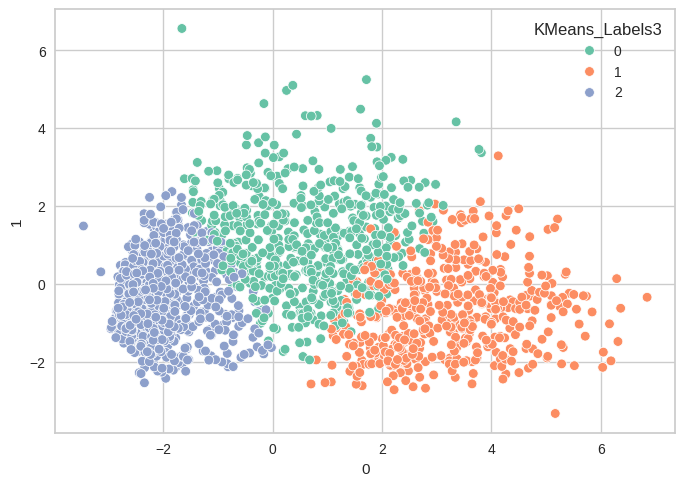

In [150]:
PCA_PLOT(0,1, df_kmeans3, 'KMeans_Labels3')

In [151]:
# Adding cluster labels to our initial DF
df['KMeans_Labels3'] = df_kmeans3['KMeans_Labels3']

In [152]:
# Adding numeric demographic columns to PCA fields to do analysis on
demographic_columns = ['Income', 'Age', 'Family_Size', 'NumTotalPurchases'] # always included

product_columns = ['MntFishProducts', 'MntMeatProducts', 'MntFruits', 'MntSweetProducts', 'MntWines', 'MntGoldProds']
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']
family_columns = ['Kids', 'Adults']

columns_analysis = column_list_pca + demographic_columns

In [153]:
# kmeans3_analysis = columns_analysis + ['KMeans_Labels3']

# mean = df[kmeans3_analysis].groupby('KMeans_Labels3').mean()
# median = df[kmeans3_analysis].groupby('KMeans_Labels3').median()

# df_kmeans_analysis = pd.concat([mean, median], axis = 0)
# df_kmeans_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']
# df_kmeans_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1)

In [154]:
kmeans3_analysis = columns_analysis + product_columns + ['KMeans_Labels3']

mean = df[kmeans3_analysis].groupby('KMeans_Labels3').mean()
#median = df[kmeans3_analysis].groupby('KMeans_Labels3').median()

df_kmeans_analysis = pd.concat([mean], axis = 0)
df_kmeans_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean']
df_kmeans_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1)

,group_0 Mean,group_1 Mean,group_2 Mean
NumDealsPurchases,3.846287,1.299197,1.932702
NumWebPurchases,6.628670,4.995984,2.125131
NumCatalogPurchases,3.017271,6.234940,0.589905
NumStorePurchases,7.910190,8.102410,3.304942
NumWebVisitsMonth,5.813472,2.849398,6.267087
MntFoods,208.139896,631.305221,36.520505
MntLuxuryProducts,512.639033,808.899598,65.577287
Expenses,720.778929,1440.204819,102.097792
TotalAcceptedCmp,0.336788,1.128514,0.171399
AmountPerPurchase,40.521900,77.696044,14.752408


In [155]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: Cluter Label
    target: target variable
    """
    count = data[predictor].nunique()
    tab1 = pd.crosstab(data[predictor], data[target], margins=True)

    # drop the summation in the margin then sort clusters and read it (Can't sort int and str)
    all_row = tab1.loc[['All']]
    sorted_tab = tab1.drop('All').sort_index(ascending=True)
    tab1_sorted = pd.concat([all_row, sorted_tab])

    print(tab1_sorted)
    print("-" * 120)

    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(by=predictor, ascending=True)
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5), color=['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3'])
    plt.legend(loc="lower left", frameon=False)
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Marital_Status  Divorced  Married  Single  Together  Widow   All
KMeans_Labels3                                                  
All                  213      786     445       514     70  2028
0                     69      235     105       146     24   579
1                     50      182     122       121     23   498
2                     94      369     218       247     23   951
------------------------------------------------------------------------------------------------------------------------


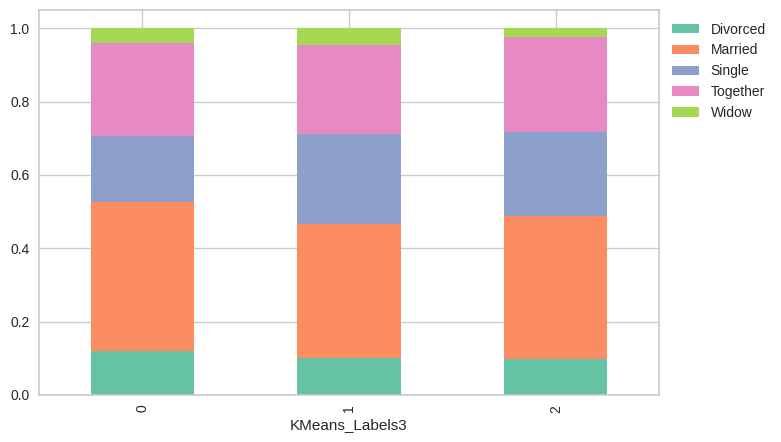

In [156]:
stacked_barplot(df,'KMeans_Labels3', 'Marital_Status')

Family_Size       1    2    3    4   5   All
KMeans_Labels3                              
All             230  689  808  273  28  2028
0                25  173  286   87   8   579
1               163  262   70    1   2   498
2                42  254  452  185  18   951
------------------------------------------------------------------------------------------------------------------------


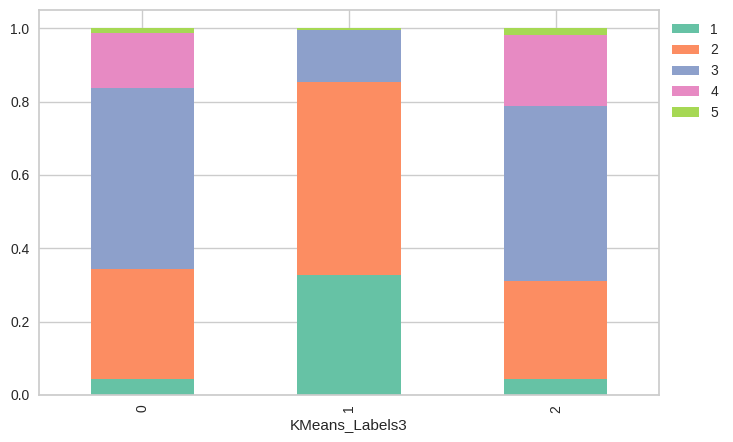

In [157]:
#Group 1 is smaller family size
stacked_barplot(df,'KMeans_Labels3', 'Family_Size')

Education       Basic  Graduation  Master  PhD   All
KMeans_Labels3                                      
All                49        1020     520  439  2028
0                   1         282     145  151   579
1                   0         273     113  112   498
2                  48         465     262  176   951
------------------------------------------------------------------------------------------------------------------------


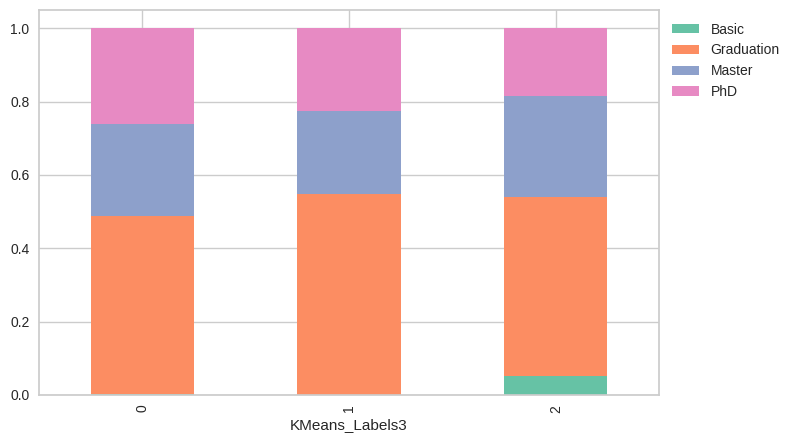

In [158]:
# Group 2 contains almost all of our basic education
stacked_barplot(df,'KMeans_Labels3', 'Education')

### **Analysis of characteristics of each cluster**

**Summary of each cluster:** This is a pretty simple breakdown of groupings primarily by income

*   Cluster 2 is Low Income
*   Cluster 0 is Medium Income
*   Cluster 1 is High Income

Our Low Income Cluster is visiting the website the most and has the largest family size.  They also purchase more deals than the high income group despite making fewer purchases.  They also have a bit slightly lower education level.

Our Medium Income Cluster is making the most purchases online and purchasing the most deals. (Not as much of a percent of total compared to low income but this is likely due to their ability to make more purchases in general).  They care more for sales than the income group but still have expendable income.

Our High Income Cluster also as smaller families on average.  aprox 80% being size 2 or less. They also spend the most per purchase and spend the most on luxury goods as a porportion of total spending.

We split our data but didn't really get a lot of additional information out of it so I'm going to try the next elbow despite the silhouette score being lower.

## Trying K means with 5 clusters

In [159]:
# Copy PCA DF to add labels to
df_kmeans5 = data_pca.copy()

In [160]:
# Initialize K-Means algorithm with 5 clusters and fitting to copy of PCA data frame
kmeans5 = KMeans(n_clusters=5, random_state=1, init='k-means++', n_init=20).fit(df_kmeans5)

In [161]:
# Adding cluster prediction labels to the data frame
df_kmeans5['KMeans_Labels5'] = kmeans5.predict(df_kmeans5)

In [162]:
# Checking the distribution of counts within the clusters
# One of our clusters is a clear outlier on its own.
df_kmeans5['KMeans_Labels5'].value_counts()

,count
KMeans_Labels5,
2,540
0,454
4,434
3,376
1,224


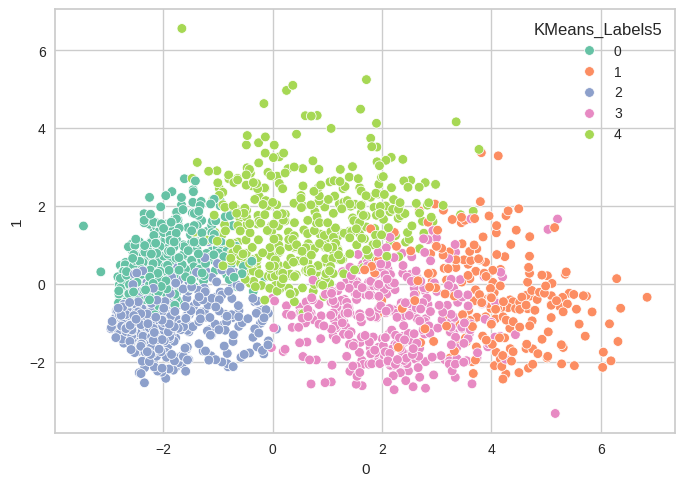

In [163]:
# Approximatly split split our side clusters into two
# Group 0 & 2 and 1 & 3 have more in common with each other than the others and group 4
PCA_PLOT(0,1, df_kmeans5, 'KMeans_Labels5')

In [164]:
#Adding labels to our initial DF
df['KMeans_Labels5'] = df_kmeans5['KMeans_Labels5']

In [165]:
kmeans5_analysis = columns_analysis + product_columns + campaign_columns + ['KMeans_Labels5']

mean = df[kmeans5_analysis].groupby('KMeans_Labels5').mean()
median = df[kmeans5_analysis].groupby('KMeans_Labels5').median()

df_kmeans5_analysis = pd.concat([mean, median], axis = 0)
df_kmeans5_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_4 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median']
df_kmeans5_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1)

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median
NumDealsPurchases,2.248899,1.196429,1.801852,1.571809,4.283410,2.000000,1.000000,2.000000,1.000000,4.000000
NumWebPurchases,2.451542,5.633929,2.062963,4.712766,7.110599,2.000000,5.000000,2.000000,5.000000,7.000000
NumCatalogPurchases,0.596916,6.071429,0.659259,5.776596,2.889401,0.000000,6.000000,0.000000,5.000000,2.000000
NumStorePurchases,3.220264,7.812500,3.570370,8.734043,7.682028,3.000000,8.000000,3.000000,9.000000,8.000000
NumWebVisitsMonth,7.337004,3.571429,5.364815,2.539894,6.364055,7.000000,3.000000,6.000000,2.000000,6.000000
MntFoods,42.938326,664.312500,36.587037,525.494681,193.527650,29.000000,672.500000,21.000000,503.500000,158.000000
MntLuxuryProducts,74.066079,1028.830357,72.240741,596.252660,540.850230,44.000000,1069.000000,38.000000,573.000000,490.000000
Expenses,117.004405,1693.142857,108.827778,1121.747340,734.377880,79.000000,1723.000000,61.500000,1101.500000,662.500000
TotalAcceptedCmp,0.240088,2.178571,0.116667,0.223404,0.405530,0.000000,2.000000,0.000000,0.000000,0.000000
AmountPerPurchase,16.588194,91.349107,14.278741,60.124601,41.183733,14.235000,95.145000,11.585000,63.855000,36.670000


Marital_Status  Divorced  Married  Single  Together  Widow   All
KMeans_Labels5                                                  
All                  213      786     445       514     70  2028
0                     43      173     112       115     11   454
1                     23       81      61        50      9   224
2                     55      216     117       139     13   540
3                     35      150      74        99     18   376
4                     57      166      81       111     19   434
------------------------------------------------------------------------------------------------------------------------


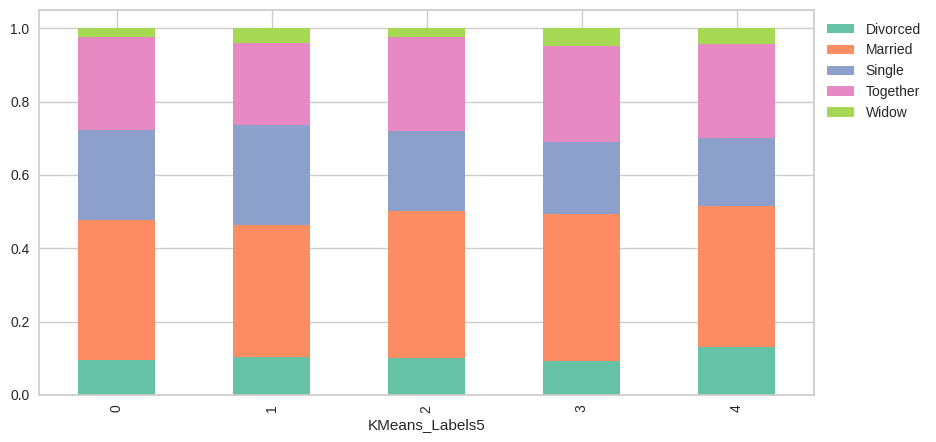

In [166]:
stacked_barplot(df,'KMeans_Labels5', 'Marital_Status')

Family_Size       1    2    3    4   5   All
KMeans_Labels5                              
All             230  689  808  273  28  2028
0                21  129  214   84   6   454
1                83  107   32    1   1   224
2                23  135  257  112  13   540
3                86  185  100    4   1   376
4                17  133  205   72   7   434
------------------------------------------------------------------------------------------------------------------------


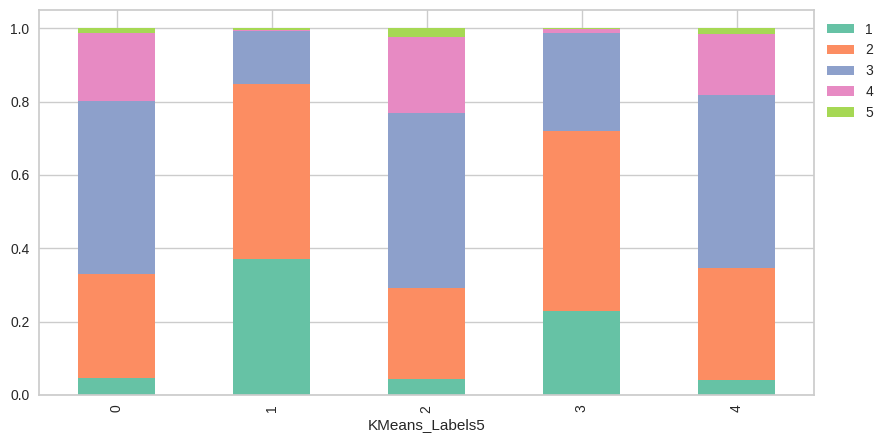

In [167]:
#Group 1 is smaller family size
stacked_barplot(df,'KMeans_Labels5', 'Family_Size')

Education       Basic  Graduation  Master  PhD   All
KMeans_Labels5                                      
All                49        1020     520  439  2028
0                  34         241     106   73   454
1                   0         116      53   55   224
2                  14         246     164  116   540
3                   0         215      85   76   376
4                   1         202     112  119   434
------------------------------------------------------------------------------------------------------------------------


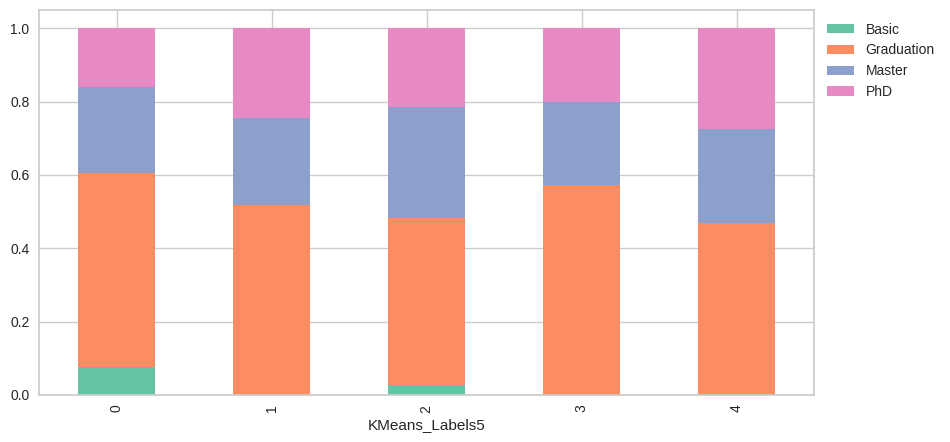

In [168]:
# Group 0 and 2 are a bit less educated
stacked_barplot(df,'KMeans_Labels5', 'Education')

### **Analysis of characteristics of each cluster**

**Summary of each cluster:** Breaking into 5 clusters gives us more detail and charactarization to each cluster but it mostly has split our low and high income groups from the previous clustering

The marketing campaigns are barely resonating with anyone other than cluster 1 and even then campaigns 1, 5, 6 performed much better. (Are they wine focused?)

*   Cluster 0 & 2 is Low Income
*   Cluster 4 is Medium Income
*   Cluster 1 & 3 is High Income & don't visit the website much

Cluster 0 Is the youngest and lowest income cluster.  They are chronically online and visit the website the most but make the fewest purchases.  They barely make any catalog purchases.

Cluster 2 are similar to cluster 0 but tend to be enrolled with us for half as long (about a year less) as cluster 0.  They are new to our campaigns and favor shoping in store a bit more than online.  They also spend less than Cluster 0 simple due to them spending less per purchase.

Cluster 1 is engaging the most with the campaigns.  The accept more of the campaigns than the rest of the clusters combined and are highly engaged with ordering through the catalog. They also spend twice as much on wine compared to our other high income cluster and have the smallest families overall. (Wine Moms / Catalog Purchasers)

Cluster 3 is averse to visiting the website.  They'll make purchases when they are on it but don't visit often.  We don't have data for store visits but their purchase behavior skews more to in store purchases compared to catalog purcheses of Cluster 1.  They also spend a fairly significat less with us compared to Cluster 1 and are not engaged with the campaigns unliked Cluster 1. (Dinks)

Cluster 4 is our responsible adults.  They are the oldest (Not much older than cluster 3) and make both the most purchases online and the most deals.  They don't have a clear preference for shoping online vs in store and while they make purchases through the catalog it's a bit less than half as much as the other two methods.  Comparing how much they spend on different catagories compared to higher income groups their wine purchasing stands out as disproportionally higher.

## **K-Medoids**

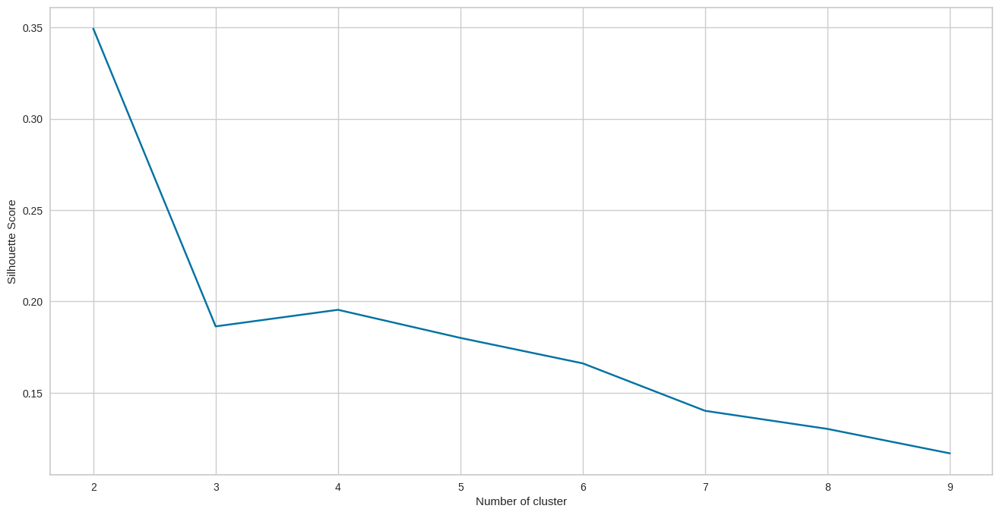

In [169]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 10):

    kmedo = KMedoids(n_clusters = k, random_state = 1)

    kmedo.fit(data_pca)
    labels = kmedo.predict(data_pca)

    sc[k] = silhouette_score(data_pca, labels)

# Elbow plot
plt.figure(figsize=(16, 8))
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [170]:
#another elbow at 3 clusters but there is an increase in silhouette at 4 clusters so I'll start there
sc

{2: 0.3493885126470675,
 3: 0.18631133040122017,
 4: 0.19539104311121844,
 5: 0.18000175492756243,
 6: 0.1660618783362681,
 7: 0.14007266731573656,
 8: 0.13015817923663678,
 9: 0.11677413943433622}

In [171]:
df_kmedo4 = data_pca.copy()

kmedo4 = KMedoids(n_clusters = 4, random_state = 1)

kmedo4.fit(df_kmedo4)

df_kmedo4['KMedo_Labels4'] = kmedo4.predict(df_kmedo4)

In [172]:
df_kmedo4['KMedo_Labels4'].value_counts()

,count
KMedo_Labels4,
1,621
3,493
2,458
0,456


### **Visualize the clusters using PCA**

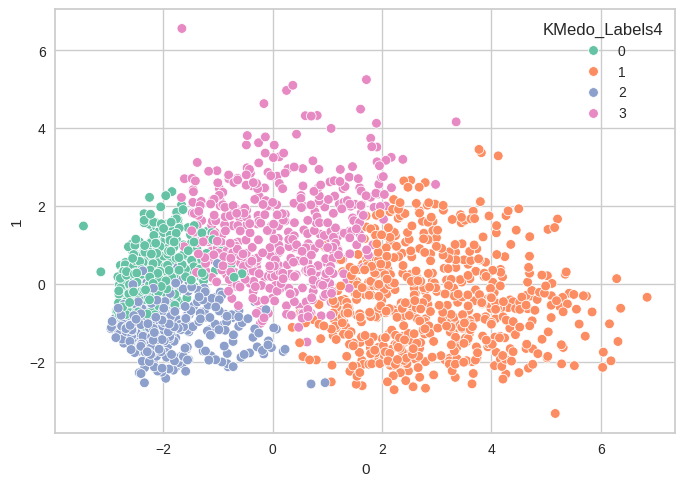

In [173]:
PCA_PLOT(0,1,df_kmedo4,'KMedo_Labels4')

In [174]:
df['KMedo_Labels4'] = df_kmedo4['KMedo_Labels4']

kmedo4_analysis = columns_analysis + product_columns + family_columns + ['KMedo_Labels4'] # + campaign_columns

mean = df[kmedo4_analysis].groupby('KMedo_Labels4').mean()
median = df[kmedo4_analysis].groupby('KMedo_Labels4').median()

df_kmedo4_analysis = pd.concat([mean, median], axis = 0)
df_kmedo4_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median']

df_kmedo4_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median
NumDealsPurchases,1.939,1.535,1.766,4.191,2.000,1.000,2.000,4.000
NumWebPurchases,2.022,5.382,2.007,6.418,2.000,5.000,2.000,6.000
NumCatalogPurchases,0.432,5.968,0.712,2.402,0.000,6.000,1.000,2.000
NumStorePurchases,2.952,8.414,3.552,7.221,3.000,8.000,3.000,7.000
NumWebVisitsMonth,7.316,3.184,5.140,6.243,7.000,3.000,5.000,6.000
MntFoods,32.024,571.928,38.037,167.227,24.000,535.000,22.000,140.000
MntLuxuryProducts,52.002,789.306,70.570,437.771,34.500,754.000,40.000,399.000
Expenses,84.026,1361.233,108.607,604.998,62.000,1323.000,63.000,563.000
TotalAcceptedCmp,0.224,0.971,0.116,0.329,0.000,0.000,0.000,0.000
AmountPerPurchase,14.310,71.992,14.519,37.124,12.290,70.000,12.100,34.790


Marital_Status  Divorced  Married  Single  Together  Widow   All
KMedo_Labels4                                                   
All                  213      786     445       514     70  2028
0                     42      178     106       119     11   456
1                     66      233     135       158     29   621
2                     48      174     102       122     12   458
3                     57      201     102       115     18   493
------------------------------------------------------------------------------------------------------------------------


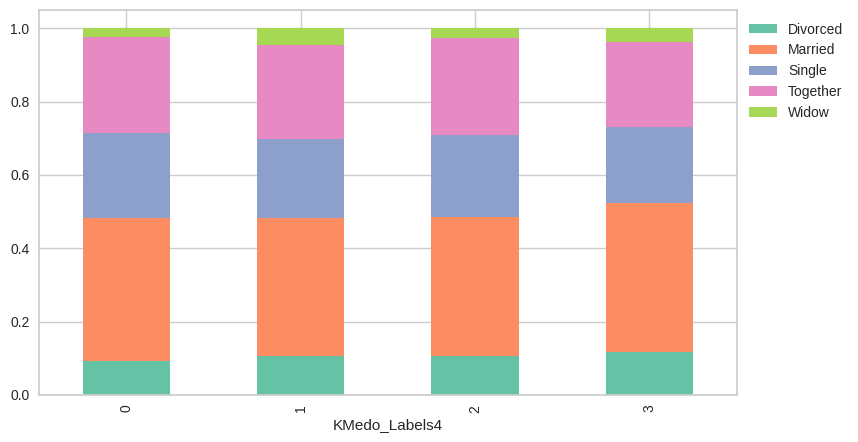

In [175]:
stacked_barplot(df,'KMedo_Labels4', 'Marital_Status')

Family_Size      1    2    3    4   5   All
KMedo_Labels4                              
All            230  689  808  273  28  2028
0               20  126  221   80   9   456
1              169  307  140    3   2   621
2               22  120  212   95   9   458
3               19  136  235   95   8   493
------------------------------------------------------------------------------------------------------------------------


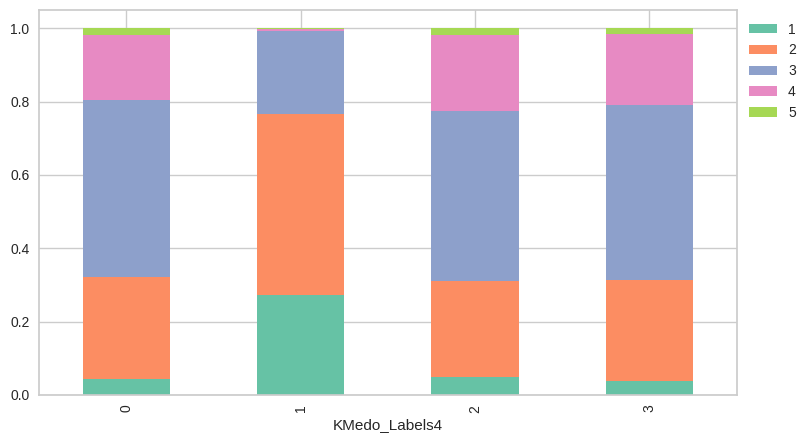

In [176]:
#Group 1 is smaller family size
stacked_barplot(df,'KMedo_Labels4', 'Family_Size')

Education      Basic  Graduation  Master  PhD   All
KMedo_Labels4                                      
All               49        1020     520  439  2028
0                 36         226     119   75   456
1                  0         335     145  141   621
2                 11         212     134  101   458
3                  2         247     122  122   493
------------------------------------------------------------------------------------------------------------------------


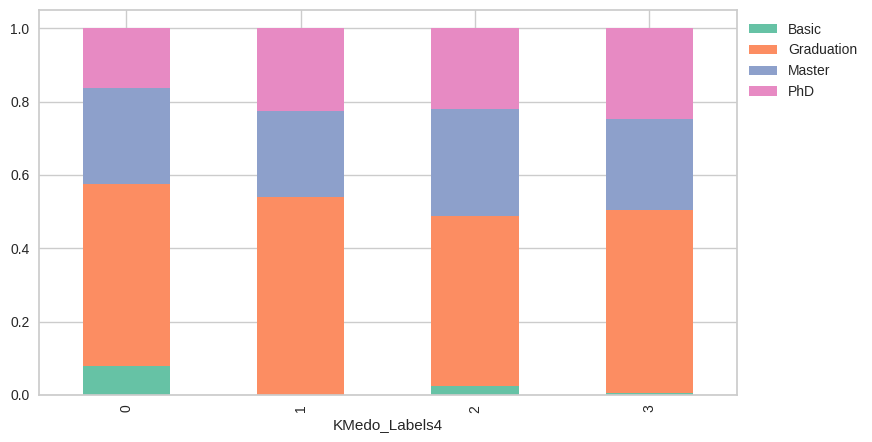

In [177]:
# Group 0 and 2 are a bit less educated
stacked_barplot(df,'KMedo_Labels4', 'Education')

### **Analysis of characteristics of each cluster**

**Summary of each cluster:** The KMedoids clusters are a bit different from K-Means.  Visually it's mostly expands the medium income cluster from KMeans a bit and combines the two higher income clusters


*   Cluster 0 is the lowest mean income around 30k
*   Cluster 2 is low to mid income around 40K
*   Cluster 3 is medium Income around 55K
*   Cluster 1 is the highest income around 75K

Cluster 0 - **"Young" adults**
same as before is our lowest income cluster.  It's also the youngest and makes the fewest number of purchases across all 3 catagories.  Their number of deals is actually 3rd & closest to that of cluster 3.  Despite that they visit the website the most and surpisingly about 60% of their spend is on luxury products.

Cluster 2 - **New Customers** Is the lower end of our medium income bracket.  Their most defining characteristic is that they tend to have been engaged with us for the least amount of time.  Less than a year.  Their spend per purchase is similar to our low income cluster though they spend twice as much on luxury goods as they do on foods (70% of their expenses).  They make purchases online but make nearly twice as many in store.

Cluster 3 - **Wine Moms** is our median income cluster and they also purchase the most deals on average.  They purchase evenly between the web and in store and even use the catalog some.  This cluster spends significantly more money with us than the other two but half as much as our final cluster.  They make 3 times as many purchases as the lower income and spend over twice as much per purchase.  This cluster purchases the most deals showing that while they have more disposable income and purchasing power they are conscious of pricing and good deals. Their spend is almost 75% on luxury goods but most of that is wine which they spend more money on than all other catagories combined.

Cluster 1 - **DINKs**
This is the most affluent and also the smallest family size by a large margin.  This is cluster primarily the DINKs and Single Adults with less than 35% reporting a child in the house.  These are still catagorized by purchasing from the catalogs more than the rest of the clusters combined and purchasing the fewest deals.  The don't seem concerned about savings when ordering their fine wine from the catalog.  They have a pretty even split on thir purchases between Foods and Luxury products.  However if looking at the individual catagories Their two largest by far are Meats and Wines which go together when hosting social gatherings.  This Cluster also interacted with the prior campaigns the most. (Not very much but significantly more than the others.)

## What if we also did 5 clusters for no reason other than I tried this first before looking at silhouette scores

In [178]:
df_kmedo5 = data_pca.copy()

kmedo5 = KMedoids(n_clusters = 5, random_state = 1)

kmedo5.fit(df_kmedo5)

df_kmedo5['KMedo_Labels5'] = kmedo5.predict(df_kmedo5)

In [179]:
df_kmedo5['KMedo_Labels5'].value_counts()

,count
KMedo_Labels5,
0,442
4,441
3,430
1,417
2,298


### **Visualize the clusters using PCA**

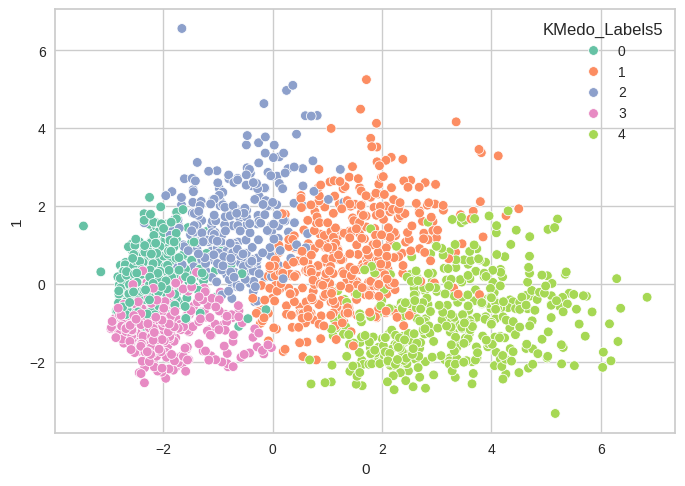

In [180]:
PCA_PLOT(0,1,df_kmedo5,'KMedo_Labels5')

In [181]:
#Adding labels to our initial DF
df['KMedo_Labels5'] = df_kmedo5['KMedo_Labels5']

In [182]:
kmedo5_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['KMedo_Labels5']

mean = df[kmedo5_analysis].groupby('KMedo_Labels5').mean()
median = df[kmedo5_analysis].groupby('KMedo_Labels5').median()

df_kmedo5_analysis = pd.concat([mean, median], axis = 0)
df_kmedo5_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_4 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median']

df_kmedo5_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median
NumDealsPurchases,1.828,2.981,4.594,1.760,1.213,2.000,3.000,4.000,1.500,1.000
NumWebPurchases,1.910,6.803,5.866,1.944,4.721,2.000,7.000,6.000,2.000,4.000
NumCatalogPurchases,0.434,3.880,1.802,0.605,6.363,0.000,3.000,1.000,0.000,6.000
NumStorePurchases,2.932,9.223,5.352,3.491,7.982,3.000,9.000,5.000,3.000,8.000
NumWebVisitsMonth,7.192,5.055,6.990,5.188,2.594,7.000,5.000,7.000,5.000,2.000
MntFoods,29.647,287.837,112.789,33.614,654.052,23.000,261.000,93.000,21.000,646.000
MntLuxuryProducts,49.880,654.153,291.809,62.449,801.299,33.000,612.000,264.500,38.000,776.000
Expenses,79.527,941.990,404.597,96.063,1455.351,59.500,907.000,397.000,61.000,1440.000
TotalAcceptedCmp,0.210,0.324,0.372,0.112,1.209,0.000,0.000,0.000,0.000,1.000
AmountPerPurchase,14.020,47.806,30.815,13.546,79.467,12.000,41.910,29.640,11.400,73.000


In [183]:
kmedo5_analysis = columns_analysis + product_columns + campaign_columns + ['KMedo_Labels5']

mean = df[kmedo5_analysis].groupby('KMedo_Labels5').mean()

df_kmeans5_analysis = pd.concat([mean], axis = 0)
df_kmeans5_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_4 Mean']
df_kmeans5_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.2f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean
NumDealsPurchases,1.83,2.98,4.59,1.76,1.21
NumWebPurchases,1.91,6.80,5.87,1.94,4.72
NumCatalogPurchases,0.43,3.88,1.80,0.60,6.36
NumStorePurchases,2.93,9.22,5.35,3.49,7.98
NumWebVisitsMonth,7.19,5.06,6.99,5.19,2.59
MntFoods,29.65,287.84,112.79,33.61,654.05
MntLuxuryProducts,49.88,654.15,291.81,62.45,801.30
Expenses,79.53,941.99,404.60,96.06,1455.35
TotalAcceptedCmp,0.21,0.32,0.37,0.11,1.21
AmountPerPurchase,14.02,47.81,30.81,13.55,79.47


Marital_Status  Divorced  Married  Single  Together  Widow   All
KMedo_Labels5                                                   
All                  213      786     445       514     70  2028
0                     41      176     103       111     11   442
1                     53      161      70       114     19   417
2                     31      123      62        72     10   298
3                     48      164      94       114     10   430
4                     40      162     116       103     20   441
------------------------------------------------------------------------------------------------------------------------


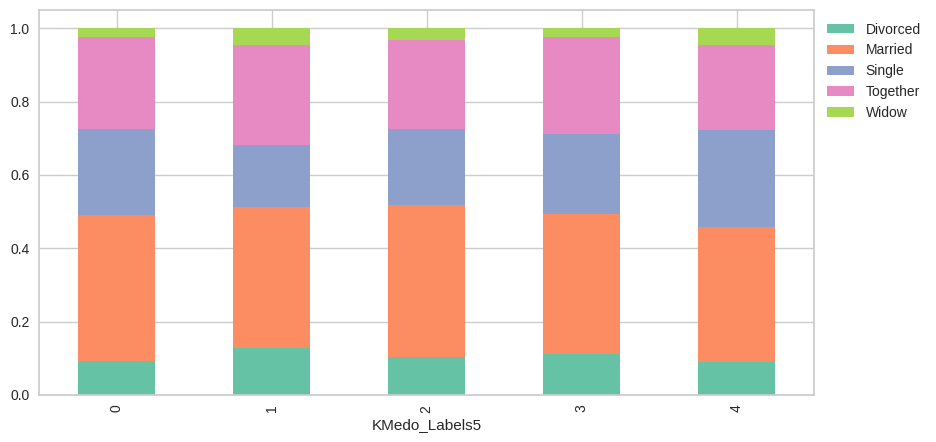

In [184]:
stacked_barplot(df,'KMedo_Labels5', 'Marital_Status')

Family_Size      1    2    3    4   5   All
KMedo_Labels5                              
All            230  689  808  273  28  2028
0               21  124  214   75   8   442
1               31  135  216   34   1   417
2                7   72  141   71   7   298
3               19  111  198   92  10   430
4              152  247   39    1   2   441
------------------------------------------------------------------------------------------------------------------------


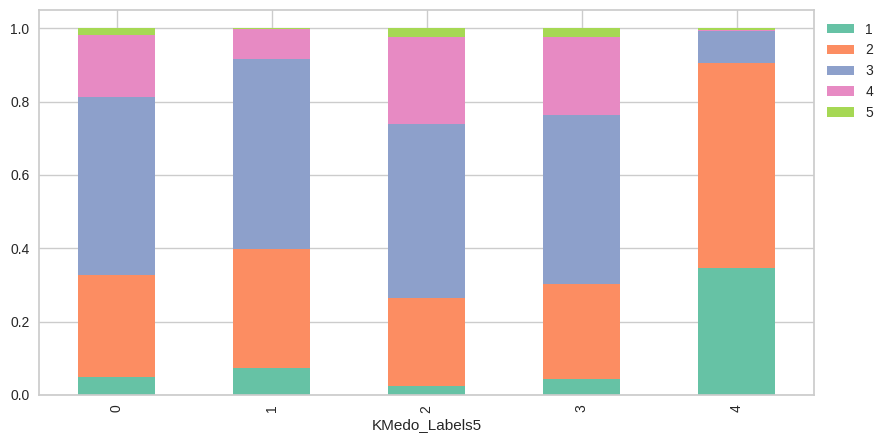

In [185]:
#Group 1 is smaller family size
stacked_barplot(df,'KMedo_Labels5', 'Family_Size')

Education      Basic  Graduation  Master  PhD   All
KMedo_Labels5                                      
All               49        1020     520  439  2028
0                 36         211     123   72   442
1                  0         217      89  111   417
2                  2         153      80   63   298
3                 11         204     124   91   430
4                  0         235     104  102   441
------------------------------------------------------------------------------------------------------------------------


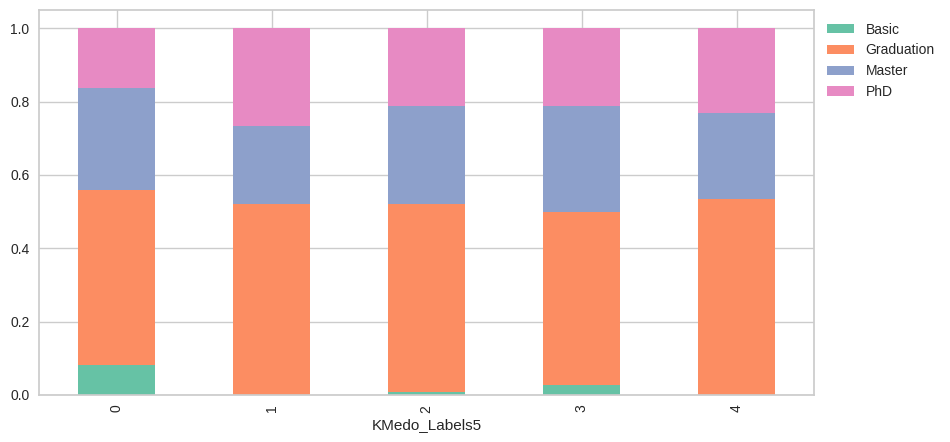

In [186]:
# Group 0 and 2 are a bit less educated
stacked_barplot(df,'KMedo_Labels5', 'Education')

### **Analysis of characteristics of each cluster**

**Summary of each cluster:** This analysis is largely the same as with 4 clusters

*   Cluster 0 is the lowest mean income around 30k
*   Clusters 3 & 2 are Mid mean income around 40k-47k
*   Clusters 1 & 4 are Higher mean income 63k - 78k

Cluster 0 - **"Young" adults**
same as before is our lowest income cluster.  It's also the youngest and makes the fewest number of purchases across all 3 catagories.  Their number of deals is actually 3rd & closest to that of cluster 3.  Despite that they visit the website the most. And surpisingly about 60% of their spend is on luxury products.

Cluster 3 - **New Customers** Is the lower end of our medium income bracket.  Their most defining characteristic is that they tend to have been engaged with us for the least amount of time.  Less than a year.  Their spend per purchase is similar to our low income cluster though they spend twice as much on luxury goods as they do on foods.  They make purchases online but make nearly twice as many in store.

Cluster 2 - **Wine Moms** is our median income cluster and they also purchase the most deals on average.  They purchase evenly between the web and in store and even use the catalog some.  Their spend is almost 75% on luxury goods.  Cluster 2 has the most kids on average (1.3) but not much more than 3 and 1.  They spend more on wine than every other product combined.

Cluster 1 - **Wealthy Families** our 2nd wealthiest cluster.  They have fewer kids than the lower income groups but significantly more than our wealthiest cluster.  THey make several purchases and do shop for deals though that may be more to do with the volume of purchases they make rather than a desire to seek them out.  About 2/3rds of their purchases are luxury goods. (Primarily wine)

Cluster 4 - **DINKs**
This is the most affluent and also the smallest family size by a large margin.  This is cluster primarily the DINKs and Single Adults with only 16% reporting a child in the house.  These are still catagorized by purchasing from the catalogs more than the rest of the clusters combined and purchasing the fewest deals.  The don't seem concerned about savings when ordering their fine wine from the catalog.  They have a pretty even split on thir purchases between Foods and Luxury products.  However if looking at the individual catagories Their too largest by far are Meats and Wines which go together when hosting social gatherings.  This Cluster also interacted with the prior campaigns the most. (Not very much but significantly more than the others.)

## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages
- Explore different linkages with each distance metric

In [187]:
df_hierarch = data_pca.copy()

# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average"]

high_cophenet_corr = 0                                                 # Creating a variable by assigning 0 to it
high_dm_lm = [0, 0]                                                    # Creating a list by assigning 0's to it

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(df_hierarch, metric=dm, method=lm)                    # Applying different linkages with different distance on df_hierarch
        c, coph_dists = cophenet(Z, pdist(df_hierarch))                   # Calculating cophenetic correlation
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:                                     # Checking if cophenetic correlation is higher than previous score
            high_cophenet_corr = c                                     # Appending to high_cophenet_corr list if it is higher
            high_dm_lm[0] = dm                                         # Appending its corresponding distance
            high_dm_lm[1] = lm                                         # Appending its corresponding method or linkage

Cophenetic correlation for Euclidean distance and single linkage is 0.6730931050973864.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7369635595986183.
Cophenetic correlation for Euclidean distance and average linkage is 0.8163124272727085.
Cophenetic correlation for Chebyshev distance and single linkage is 0.6811324171880593.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7354320316502677.
Cophenetic correlation for Chebyshev distance and average linkage is 0.7563146863403043.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.6937705530246814.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.6589533423393777.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.7216277655017092.
Cophenetic correlation for Cityblock distance and single linkage is 0.6984669866096429.
Cophenetic correlation for Cityblock distance and complete linkage is 0.7862888843558027.
Cophenetic corr

In [188]:
# Printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(f'Highest cophenetic correlation is {high_cophenet_corr}, which is obtained with {high_dm_lm[0]} distance and {high_dm_lm[1]} linkage.')

Highest cophenetic correlation is 0.8163124272727085, which is obtained with euclidean distance and average linkage.


In [189]:
def chart_dendrogram(data, distance_measure):
  # List of linkage methods
  linkage_methods = ['single', 'complete', 'average']

  # To create a subplot image
  fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))            # Setting the plot size

  # We will enumerate through the list of linkage methods above
  # For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
  for i, method in enumerate(linkage_methods):
      Z = linkage(data, metric=distance_measure, method=method)                  # Measures the distances between two clusters

      dendrogram(Z, ax=axs[i])
      axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')           # Title of dendrogram

      coph_corr, coph_dist = cophenet(Z, pdist(data))                       # Finding cophenetic correlation for different linkages with city block distance
      axs[i].annotate(
          f'Cophenetic\nCorrelation\n{coph_corr:0.2f}',
          (0.80, 0.80),
          xycoords='axes fraction',
      )

In [190]:
df_hierarch = data_pca.copy()

**Let's have a look at the dendrograms for different linkages with `Cityblock distance`**

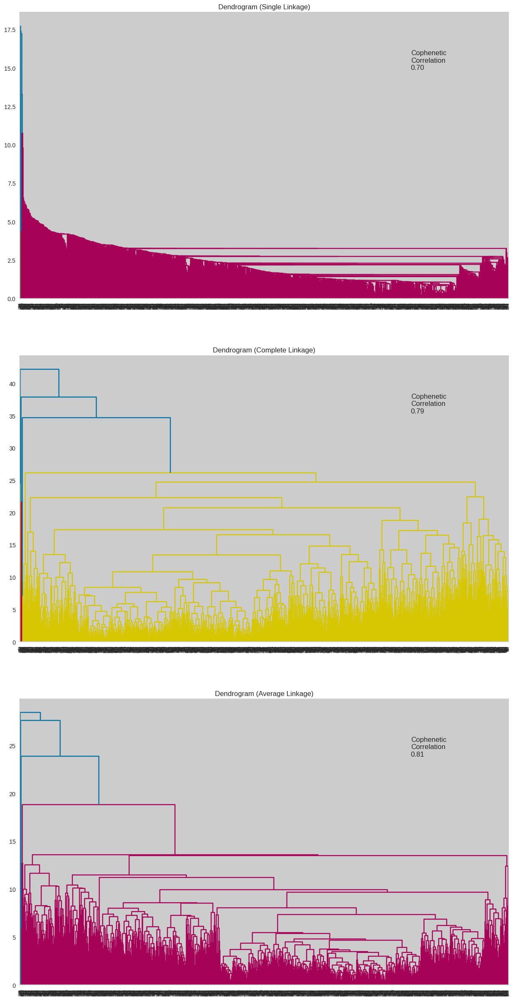

In [191]:
chart_dendrogram(df_hierarch,'Cityblock')

**Let's have a look at the dendrograms for different linkages with `Chebyshev distance`**

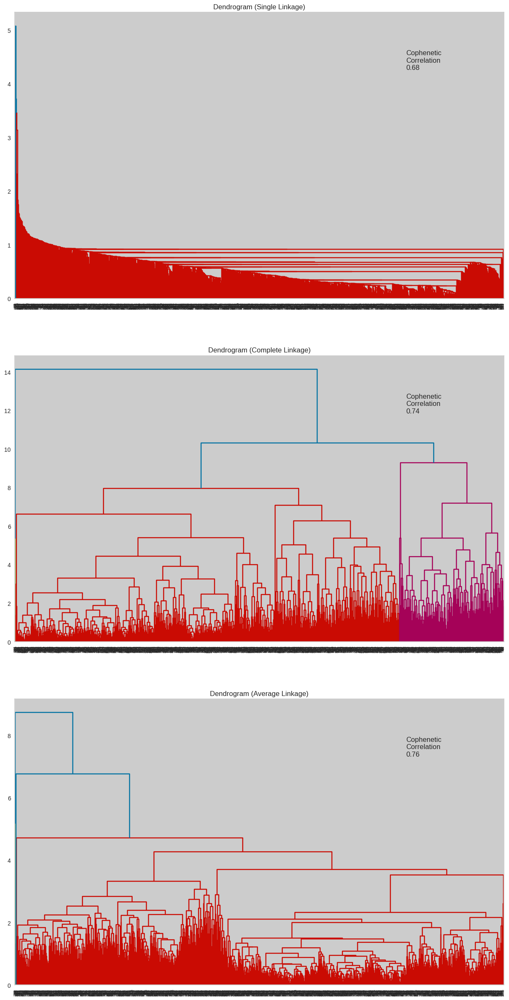

In [192]:
chart_dendrogram(df_hierarch,'Chebyshev')

In [193]:
#I hit a limit on the next one
import sys
sys.setrecursionlimit(1250)

**Let's have a look at the dendrograms for different linkages with `Mahalanobis distance`**

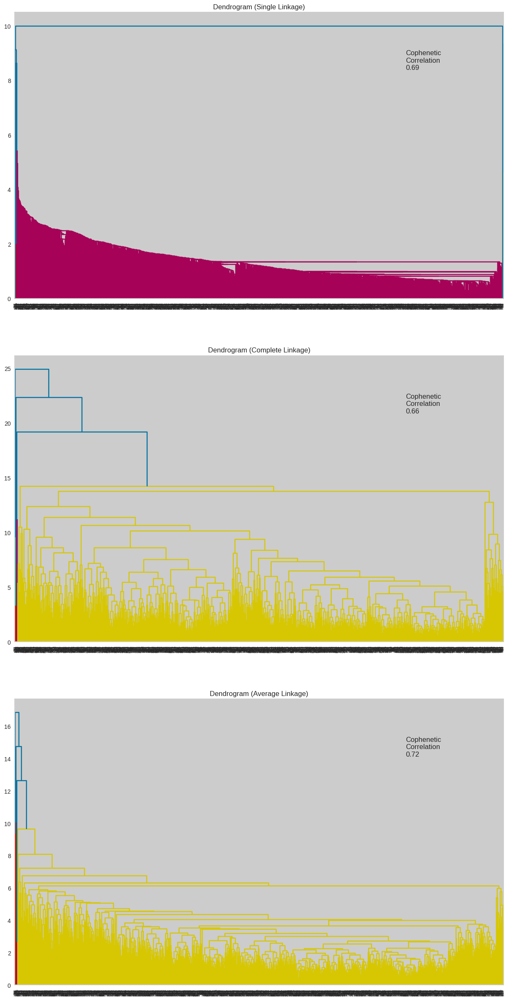

In [194]:
chart_dendrogram(df_hierarch,'Mahalanobis')

**Let's have a look at the dendrograms for different linkages with `Euclidean distance`**

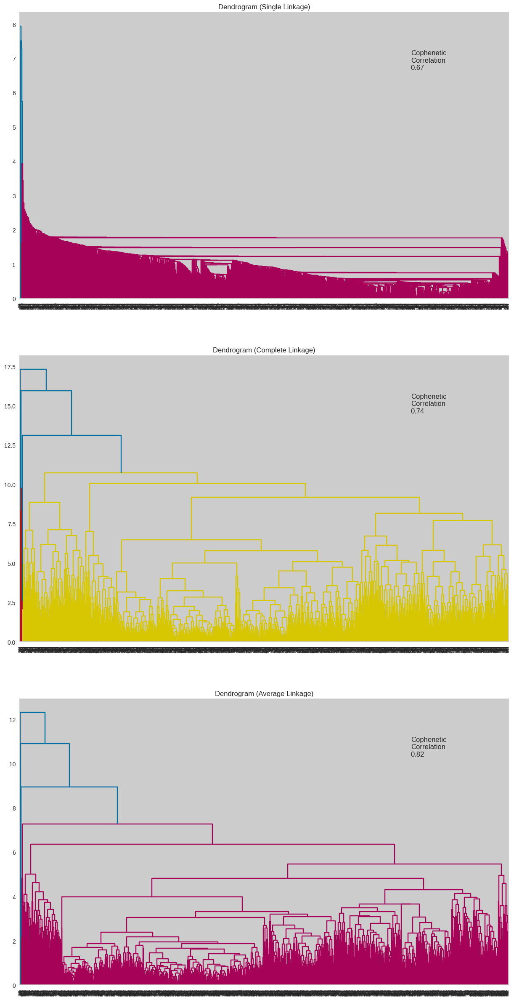

In [195]:
chart_dendrogram(df_hierarch,'Euclidean')

**Finally, Euclidean using `Ward distance` which is way more sensitive when you try to graph it with linkage**

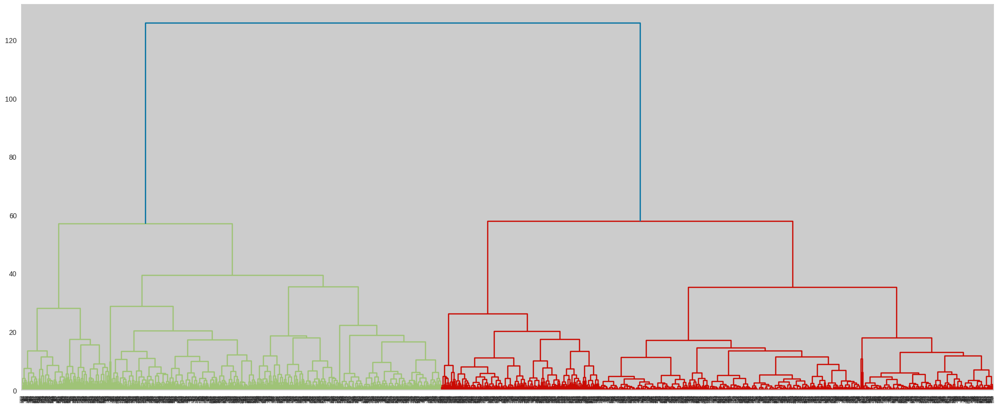

In [196]:
Z = linkage(df_hierarch, 'ward')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)

## Of all these Dendograms only the chebyshev with complete linkage and the euclidan with ward linkage are the only ones that look like they have a cluster distribution that might be useful


In [197]:
#Upon further evaluation this does not appear to be distributed in a way that's useful to us
df_hierarch = data_pca.copy()
HCmodel = AgglomerativeClustering(n_clusters= 4 , metric='chebyshev', linkage='complete')
HCmodel.fit(df_hierarch)
df_hierarch['HC_CC_Labels4'] = HCmodel.labels_
df_hierarch['HC_CC_Labels4'].value_counts()

,count
HC_CC_Labels4,
0,1591
2,416
1,17
3,4


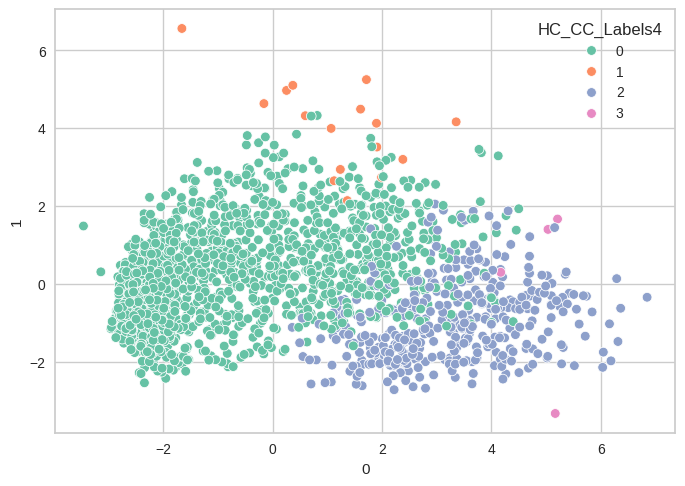

In [198]:
PCA_PLOT(0,1,df_hierarch,'HC_CC_Labels4')

In [199]:
#Adding labels to our initial DF
df['HC_CC_Labels4'] = df_hierarch['HC_CC_Labels4']

In [200]:
HC_CC_4_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['HC_CC_Labels4']

mean = df[HC_CC_4_analysis].groupby('HC_CC_Labels4').mean()
median = df[HC_CC_4_analysis].groupby('HC_CC_Labels4').median()

HC_CC_4_analysis = pd.concat([mean, median], axis = 0)
HC_CC_4_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median']

HC_CC_4_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median
NumDealsPurchases,2.523,10.882,1.125,11.250,2.000,11.000,1.000,15.000
NumWebPurchases,3.920,5.588,4.844,0.000,3.000,6.000,4.500,0.000
NumCatalogPurchases,1.744,3.118,5.959,26.500,1.000,2.000,6.000,28.000
NumStorePurchases,5.175,8.471,8.123,0.250,4.000,9.000,8.000,0.000
NumWebVisitsMonth,5.990,7.706,2.601,0.500,6.000,7.000,2.000,0.500
MntFoods,121.340,348.529,634.526,1673.500,50.000,344.000,633.500,1691.000
MntLuxuryProducts,260.200,690.294,808.197,22.750,122.000,705.000,778.000,13.000
Expenses,381.540,1038.824,1442.724,1696.250,189.000,1092.000,1436.500,1723.500
TotalAcceptedCmp,0.254,0.176,1.233,0.000,0.000,0.000,1.000,0.000
AmountPerPurchase,26.223,69.649,79.383,63.970,22.910,69.420,73.170,61.790


## Checking out the Euclidean with Ward linkage which seems functional at least

In [201]:
df_hierarch = data_pca.copy()
HCmodel = AgglomerativeClustering(n_clusters= 3 , metric='euclidean', linkage='ward')
HCmodel.fit(df_hierarch)
df_hierarch['HC_EW_Labels3'] = HCmodel.labels_
df_hierarch['HC_EW_Labels3'].value_counts()

,count
HC_EW_Labels3,
0,876
1,822
2,330


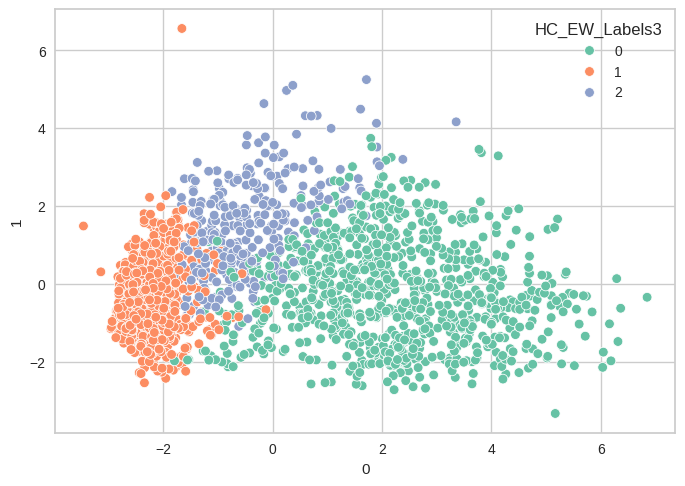

In [202]:
PCA_PLOT(0,1,df_hierarch,'HC_EW_Labels3')

In [203]:
#Adding labels to our initial DF
df['HC_EW_Labels3'] = df_hierarch['HC_EW_Labels3']

In [204]:
HC_EW_3_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['HC_EW_Labels3']

mean = df[HC_EW_3_analysis].groupby('HC_EW_Labels3').mean()
median = df[HC_EW_3_analysis].groupby('HC_EW_Labels3').median()

HC_EW_3_analysis = pd.concat([mean, median], axis = 0)
HC_EW_3_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']

HC_EW_3_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_0 Median,group_1 Median,group_2 Median
NumDealsPurchases,1.914,1.883,4.506,1.000,2.000,4.000
NumWebPurchases,5.554,1.880,5.870,5.000,2.000,6.000
NumCatalogPurchases,5.016,0.425,2.030,4.000,0.000,2.000
NumStorePurchases,8.393,3.026,5.815,8.000,3.000,5.500
NumWebVisitsMonth,3.650,6.478,6.736,3.000,7.000,7.000
MntFoods,461.483,27.702,129.103,413.500,21.000,101.000
MntLuxuryProducts,702.392,47.347,326.667,666.500,33.000,280.000
Expenses,1163.874,75.049,455.770,1130.500,57.000,408.500
TotalAcceptedCmp,0.759,0.176,0.333,0.000,0.000,0.000
AmountPerPurchase,62.712,13.077,31.816,63.620,11.400,30.310


Summary of each cluster: This is a pretty simple breakdown of groupings primarily by income similar yet different from our KMeans n = 3 clustering

Cluster 1 is Low Income

Cluster 2 is Medium Income

Cluster 0 is High Income

There's not much character shining through with this clustering method.  It's just not the right tool for our data set.

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, we have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

In [205]:
df_dbs = data_pca.copy()

dbs = DBSCAN(eps = .5, min_samples = 5)
df_dbs['DBS_Labels'] = dbs.fit_predict(df_dbs)
df_dbs['DBS_Labels'].value_counts()

,count
DBS_Labels,
-1,1535
1,282
0,160
2,26
3,19
4,6


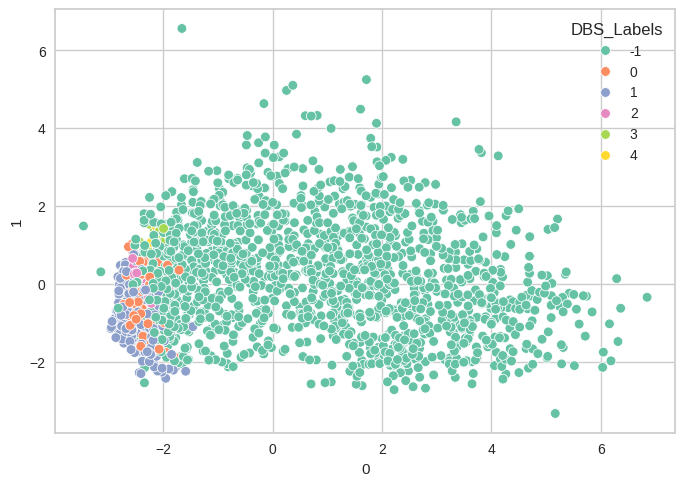

In [206]:
# -1 values are noise which means that the bulk of our customers aren't getting clustered which means we need to try some new settings.
# Most likely we will need to increase the eps score so that clusters can form with more space between each point.
PCA_PLOT(0,1,df_dbs,'DBS_Labels')

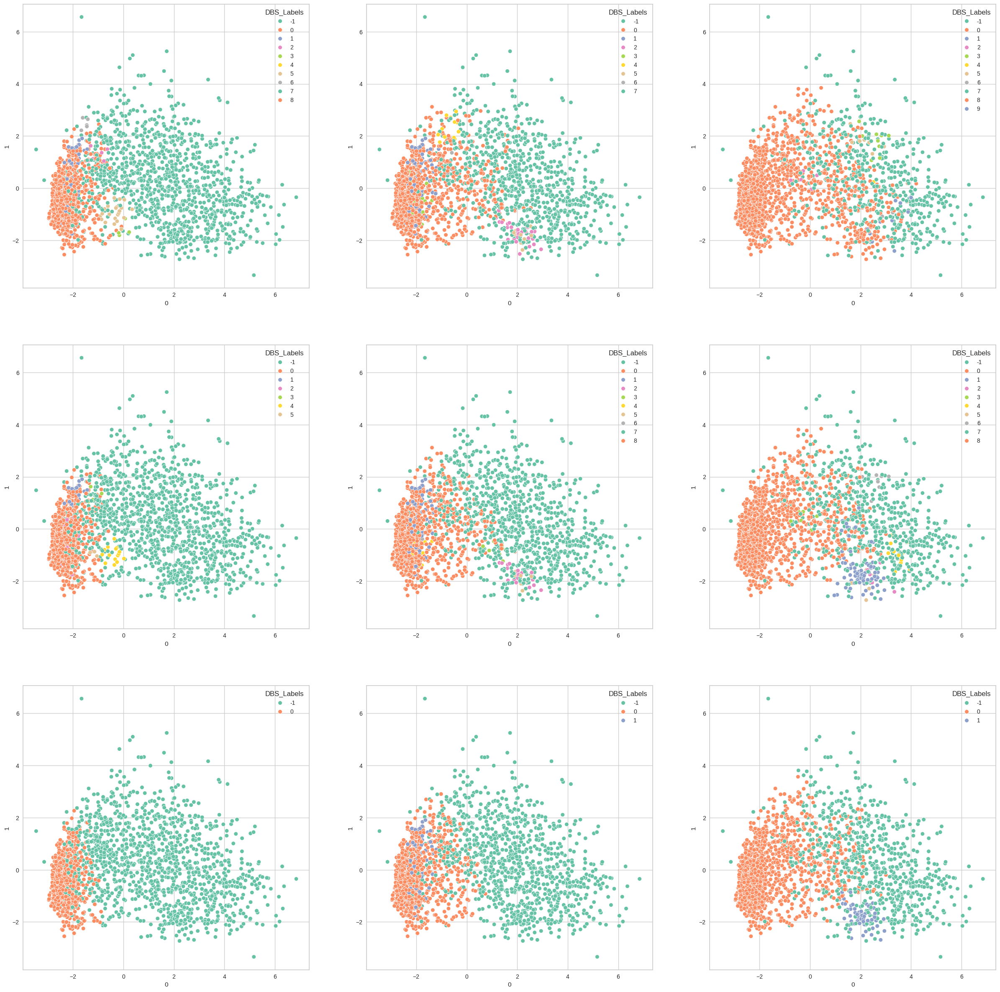

In [207]:
# Increasing EPS and trying a variety of minimum number of points for cluster to form as well.
eps1 = .75
eps2 = 1
eps3 = 1.25 # Any higher and our plot quickly becomes a single cluster with some outliers
values = {}
dbs_params = [
              {'plt': 1, 'eps': eps1, 'min':5},  {'plt': 2, 'eps': eps2, 'min':5},  {'plt': 3, 'eps': eps3, 'min':5}
             ,{'plt': 4, 'eps': eps1, 'min':7},  {'plt': 5, 'eps': eps2, 'min':7},  {'plt': 6, 'eps': eps3, 'min':7}
             ,{'plt': 7, 'eps': eps1, 'min':10}, {'plt': 8, 'eps': eps2, 'min':10}, {'plt': 9, 'eps': eps3, 'min':10}
             ]

plt.figure(figsize = (30,30))

for i in dbs_params:

  df_dbs = data_pca.copy()
  dbs = DBSCAN(eps = i['eps'], min_samples = i['min'])
  df_dbs['DBS_Labels'] = dbs.fit_predict(df_dbs)

  values['plot_'+str(i['plt'])] = df_dbs['DBS_Labels'].value_counts()

  plt.subplot(3, 3, i['plt'])
  PCA_PLOT(0,1,df_dbs,'DBS_Labels')

In [208]:
#Value counts of our plots show that when we do get more than a single cluster the clusters are likely too small to be worth catering to with specific marketing content
values

{'plot_1': DBS_Labels
 -1    1148
  0     770
  1      55
  5      22
  2       8
  6       6
  7       5
  3       5
  4       5
  8       4
 Name: count, dtype: int64,
 'plot_2': DBS_Labels
  0    1006
 -1     845
  1      91
  2      30
  3      21
  4      14
  5      11
  7       5
  6       5
 Name: count, dtype: int64,
 'plot_3': DBS_Labels
  0    1414
 -1     562
  5       9
  3       9
  1       7
  2       6
  9       5
  8       5
  6       4
  7       4
  4       3
 Name: count, dtype: int64,
 'plot_4': DBS_Labels
 -1    1217
  0     741
  2      25
  1      19
  4      15
  3       6
  5       5
 Name: count, dtype: int64,
 'plot_5': DBS_Labels
  0    942
 -1    932
  1     87
  2     22
  4     10
  7      9
  5      8
  3      7
  8      6
  6      5
 Name: count, dtype: int64,
 'plot_6': DBS_Labels
  0    1266
 -1     633
  1      79
  4      11
  2       7
  3       7
  6       7
  5       7
  7       6
  8       5
 Name: count, dtype: int64,
 'plot_7': DBS_Labels
 -1 

**Observations and Insights:**
DBSCAN is the wrong tool for this job.  

DBSCAN is more suited for density-based cluster structures in large or complex datasets.  Our data is comparatively linear in nature and very globular. As a result DBSCAN just wants to put it all into a single cluster.  

If we want to have more than a single cluster we end up throwing out the majority of our data and the clusters are too small and specific to the individual members.  We are not going to get any actionable insights out of using DBSCAN for our audience segmentation compared to other algorithms like KMeans or KMedoids.

## **Gaussian Mixture Model**

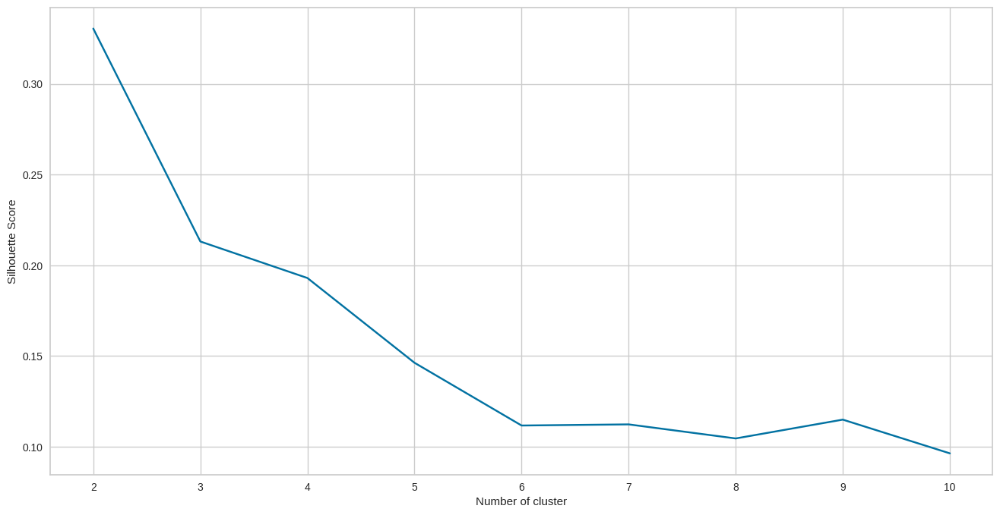

In [209]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 11):

    GMM = GaussianMixture(
    n_components=k,          # k clusters
    random_state=1,          # Seeding the randomization for consistent results across runs
    covariance_type='full',  # Default in older versions
    init_params='kmeans',    # Ensures 'kmeans' initialization
    tol=1e-3,                # Standard tolerance (check old sklearn defaults if unsure)
    max_iter=100,            # Standard max iterations in older versions
    n_init=10                # Matches the old default behavior
    )

    GMM.fit(data_pca)
    labels = GMM.predict(data_pca)

    sc[k] = silhouette_score(data_pca, labels)

# Elbow plot
plt.figure(figsize=(16, 8))
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()


In [210]:
sc

{2: 0.330522879998556,
 3: 0.21310820703848887,
 4: 0.19296875764929647,
 5: 0.14622736311491,
 6: 0.11162574895194335,
 7: 0.11224397961358833,
 8: 0.1044909943528553,
 9: 0.114870313534163,
 10: 0.09626909935550679}

### Trying 3 Clusters

In [211]:
GMM3 = GaussianMixture(
    n_components=3,          # 3 clusters
    random_state=1,          # Seeding the randomization for consistent results across runs
    covariance_type='full',  # Default in older versions
    init_params='kmeans',    # Ensures 'kmeans' initialization
    tol=1e-3,                # Standard tolerance (check old sklearn defaults if unsure)
    max_iter=100,            # Standard max iterations in older versions
    n_init=10                # Matches the old default behavior
)

In [212]:
df_gmm3 = data_pca.copy()

GMM3.fit(df_gmm3)

df_gmm3['GMM_Labels3'] = GMM3.predict(df_gmm3)

df_gmm3['GMM_Labels3'].value_counts()

,count
GMM_Labels3,
1,716
2,659
0,653


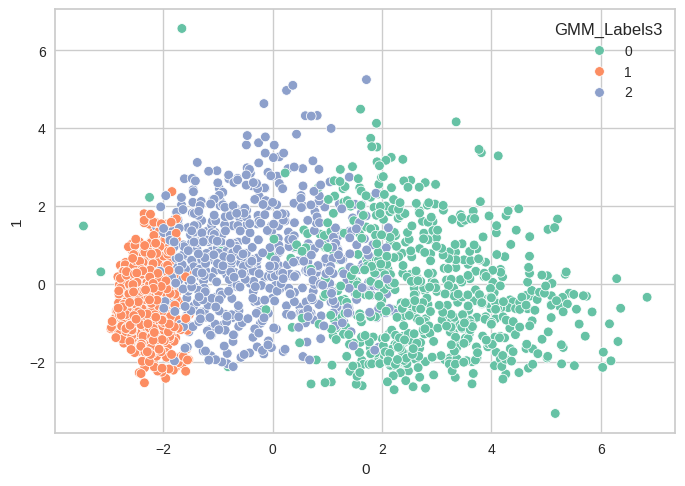

In [213]:
PCA_PLOT(0,1,df_gmm3,'GMM_Labels3')

In [214]:
#Adding labels to our initial DF
df['GMM_Labels3'] = df_gmm3['GMM_Labels3']

In [215]:
gmm3_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['GMM_Labels3']

mean = df[gmm3_analysis].groupby('GMM_Labels3').mean()
median = df[gmm3_analysis].groupby('GMM_Labels3').median()

df_gmm3_analysis = pd.concat([mean, median], axis = 0)
df_gmm3_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']

df_gmm3_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_0 Median,group_1 Median,group_2 Median
NumDealsPurchases,1.864,1.778,3.372,1.000,1.000,3.000
NumWebPurchases,5.571,1.662,5.340,5.000,2.000,5.000
NumCatalogPurchases,5.750,0.334,2.153,5.000,0.000,2.000
NumStorePurchases,7.986,2.904,6.774,8.000,3.000,6.000
NumWebVisitsMonth,3.723,6.365,5.701,3.000,7.000,6.000
MntFoods,544.412,21.778,149.530,520.000,19.000,111.000
MntLuxuryProducts,798.326,34.816,327.434,784.000,30.000,293.000
Expenses,1342.738,56.594,476.964,1305.000,51.000,433.000
TotalAcceptedCmp,0.992,0.159,0.240,1.000,0.000,0.000
AmountPerPurchase,72.997,10.909,31.422,70.440,10.500,31.150


### Trying 4 Clusters

In [216]:
GMM4 = GaussianMixture(
    n_components=4,          # 3 clusters
    random_state=1,          # Seeding the randomization for consistent results across runs
    covariance_type='full',  # Default in older versions
    init_params='kmeans',    # Ensures 'kmeans' initialization
    tol=1e-3,                # Standard tolerance (check old sklearn defaults if unsure)
    max_iter=100,            # Standard max iterations in older versions
    n_init=10                # Matches the old default behavior
)

In [217]:
df_gmm4 = data_pca.copy()

GMM4.fit(df_gmm4)

df_gmm4['GMM_Labels4'] = GMM4.predict(df_gmm4)

df_gmm4['GMM_Labels4'].value_counts()

,count
GMM_Labels4,
1,713
3,557
0,541
2,217


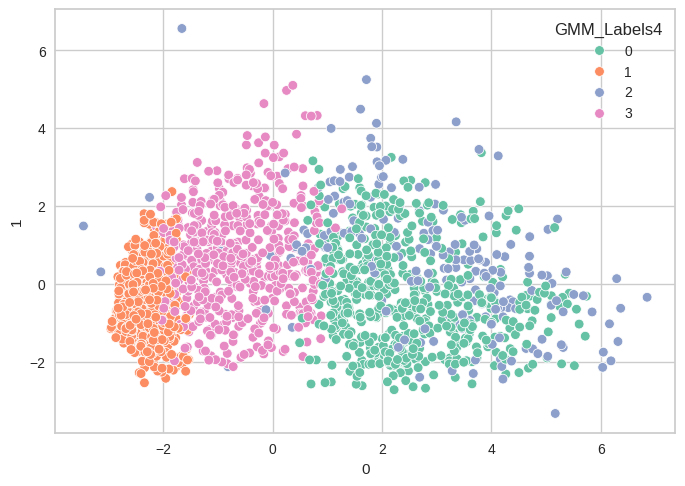

In [218]:
PCA_PLOT(0,1,df_gmm4,'GMM_Labels4')

In [219]:
#Adding labels to our initial DF
df['GMM_Labels4'] = df_gmm4['GMM_Labels4']

In [220]:
gmm4_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['GMM_Labels4']

mean = df[gmm4_analysis].groupby('GMM_Labels4').mean()
median = df[gmm4_analysis].groupby('GMM_Labels4').median()

df_gmm4_analysis = pd.concat([mean, median], axis = 0)
df_gmm4_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median',]

df_gmm4_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median
NumDealsPurchases,1.717,1.781,2.779,3.429,1.000,2.000,1.000,3.000
NumWebPurchases,5.930,1.656,5.226,5.070,6.000,2.000,4.000,5.000
NumCatalogPurchases,5.580,0.334,5.263,1.820,5.000,0.000,5.000,2.000
NumStorePurchases,8.821,2.900,7.341,5.969,9.000,3.000,7.000,6.000
NumWebVisitsMonth,3.272,6.363,5.143,5.964,3.000,7.000,5.000,6.000
MntFoods,521.403,21.707,489.843,118.101,492.000,19.000,405.000,96.000
MntLuxuryProducts,712.595,34.548,903.041,279.905,683.000,30.000,955.000,246.000
Expenses,1233.998,56.255,1392.885,398.005,1156.000,51.000,1445.000,384.000
TotalAcceptedCmp,0.547,0.158,1.696,0.257,0.000,0.000,1.000,0.000
AmountPerPurchase,62.311,10.872,84.197,29.535,67.470,10.500,74.110,29.500


Higher income split more on ratio between purchasing foods and luxury goods with Group 2 extreme on meats and wines.  # of kids is higher than most clustering for the higher income clusters and their engagmenet with prior campaigns sets them apart from each other.

### Trying 5 Clusters

In [221]:
GMM5 = GaussianMixture(
    n_components=5,          # 5 clusters
    random_state=1,          # Seeding the randomization for consistent results across runs
    covariance_type='full',  # Default in older versions
    init_params='kmeans',    # Ensures 'kmeans' initialization
    tol=1e-3,                # Standard tolerance (check old sklearn defaults if unsure)
    max_iter=100,            # Standard max iterations in older versions
    n_init=10                # Matches the old default behavior
)

In [222]:
df_gmm5 = data_pca.copy()

GMM5.fit(df_gmm5)

df_gmm5['GMM_Labels5'] = GMM5.predict(df_gmm5)

df_gmm5['GMM_Labels5'].value_counts()

,count
GMM_Labels5,
0,661
4,410
1,406
3,351
2,200


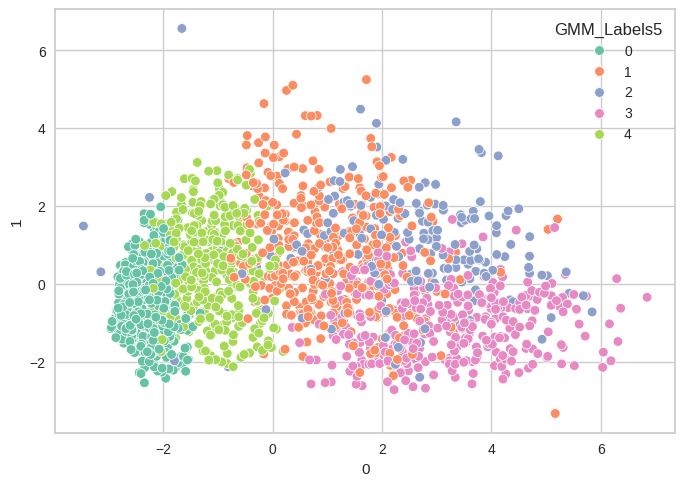

In [223]:
PCA_PLOT(0,1,df_gmm5,'GMM_Labels5')

In [224]:
#Adding labels to our initial DF
df['GMM_Labels5'] = df_gmm5['GMM_Labels5']

In [225]:
gmm5_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['GMM_Labels5']

mean = df[gmm5_analysis].groupby('GMM_Labels5').mean()
median = df[gmm5_analysis].groupby('GMM_Labels5').median()

df_gmm5_analysis = pd.concat([mean, median], axis = 0)
df_gmm5_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_4 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median']

df_gmm5_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median
NumDealsPurchases,1.803,3.426,2.750,1.057,2.946,2.000,3.000,2.000,1.000,3.000
NumWebPurchases,1.703,6.734,5.890,4.946,3.837,2.000,7.000,5.000,5.000,4.000
NumCatalogPurchases,0.307,4.192,4.650,5.801,1.322,0.000,3.000,4.000,6.000,1.000
NumStorePurchases,3.027,8.993,7.515,7.678,4.654,3.000,9.000,7.500,7.000,5.000
NumWebVisitsMonth,6.274,5.099,5.945,2.268,6.202,7.000,5.000,6.000,2.000,7.000
MntFoods,23.573,271.963,375.535,672.986,78.805,19.000,241.000,348.500,663.000,67.500
MntLuxuryProducts,37.263,528.882,895.765,776.265,173.256,30.000,506.000,951.000,752.000,171.000
Expenses,60.837,800.845,1271.300,1449.251,252.061,52.000,769.500,1296.500,1429.000,263.000
TotalAcceptedCmp,0.000,0.273,1.370,0.980,0.466,0.000,0.000,1.000,1.000,0.000
AmountPerPurchase,11.197,39.500,75.913,79.418,23.629,10.500,39.050,70.440,73.160,25.000


Trying 6

In [226]:
GMM6 = GaussianMixture(
    n_components=6,          # 5 clusters
    random_state=1,          # Seeding the randomization for consistent results across runs
    covariance_type='full',  # Default in older versions
    init_params='kmeans',    # Ensures 'kmeans' initialization
    tol=1e-3,                # Standard tolerance (check old sklearn defaults if unsure)
    max_iter=100,            # Standard max iterations in older versions
    n_init=10                # Matches the old default behavior
)

In [227]:
df_gmm6 = data_pca.copy()

GMM6.fit(df_gmm6)

df_gmm6['GMM_Labels6'] = GMM6.predict(df_gmm6)

df_gmm6['GMM_Labels6'].value_counts()

,count
GMM_Labels6,
0,629
3,603
4,277
1,257
2,135
5,127


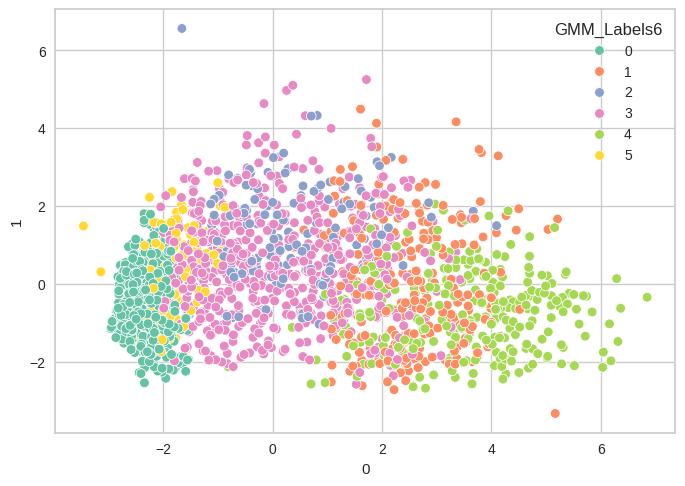

In [228]:
PCA_PLOT(0,1,df_gmm6,'GMM_Labels6')

In [229]:
#Adding labels to our initial DF
df['GMM_Labels6'] = df_gmm6['GMM_Labels6']

In [230]:
gmm6_analysis = columns_analysis + product_columns + family_columns + campaign_columns + ['GMM_Labels6']

mean = df[gmm6_analysis].groupby('GMM_Labels6').mean()
median = df[gmm6_analysis].groupby('GMM_Labels6').median()

df_gmm6_analysis = pd.concat([mean, median], axis = 0)
df_gmm6_analysis.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_4 Mean', 'group_5 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median', 'group_4 Median', 'group_5 Median']

df_gmm6_analysis.T.style.highlight_max(color='darkgreen', axis=1).highlight_min(color='indianred', axis=1).format('{:.3f}')

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_4 Mean,group_5 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median,group_4 Median,group_5 Median
NumDealsPurchases,1.773,2.288,3.993,3.139,1.061,2.228,1.000,1.000,4.000,3.000,1.000,2.000
NumWebPurchases,1.645,5.241,7.415,5.456,5.036,2.197,2.000,5.000,7.000,5.000,5.000,2.000
NumCatalogPurchases,0.281,5.471,3.044,2.756,5.949,0.858,0.000,4.000,2.000,2.000,6.000,1.000
NumStorePurchases,2.981,7.728,6.496,7.461,7.917,2.583,3.000,8.000,6.000,7.000,8.000,2.000
NumWebVisitsMonth,6.258,3.856,6.541,5.275,2.899,7.488,7.000,3.000,7.000,5.000,2.000,7.000
MntFoods,21.803,513.350,133.067,192.267,671.343,32.488,19.000,500.000,94.000,145.000,668.000,26.000
MntLuxuryProducts,34.064,796.043,485.756,368.740,864.350,68.134,28.000,797.000,463.000,323.000,858.000,45.000
Expenses,55.866,1309.393,618.822,561.007,1535.693,100.622,48.000,1295.000,546.000,490.000,1603.000,79.000
TotalAcceptedCmp,0.000,0.580,1.207,0.000,1.646,1.197,0.000,0.000,1.000,0.000,1.000,1.000
AmountPerPurchase,10.702,71.287,37.073,33.276,85.703,18.284,10.000,70.930,35.170,33.180,84.750,14.500


Family_Size    1    2    3    4   5   All
GMM_Labels6                              
All          230  689  808  273  28  2028
0             21  157  293  140  18   629
1             55  126   66    8   2   257
2             10   41   63   19   2   135
3             35  186  298   79   5   603
4            101  149   24    2   1   277
5              8   30   64   25   0   127
------------------------------------------------------------------------------------------------------------------------


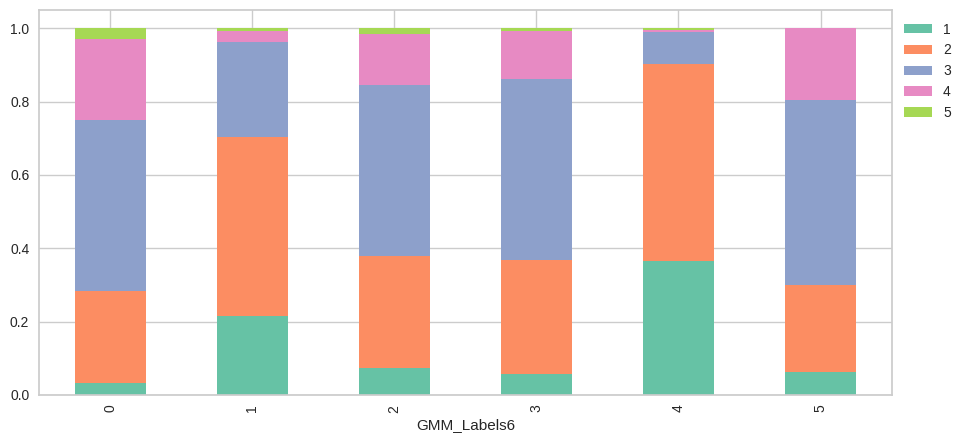

In [231]:
stacked_barplot(df,'GMM_Labels6', 'Family_Size')

**Observations and Insights:**

Still primarily broken into 3 groups of income with sub clusters in each income bracket

Lower Income Clusters ~32K

Tend to have the most kids, larger families, and higher web site engagement

* Cluster 0
  * Size 629
  * Rarely makes any catalog purchases
  * Has not accepted a single campaign
  * Buys small items or deals amounting to  $10/purchase
    
    * Spent about $55 total

* Cluster 5
  *	Size 127
  * Spent more per purchase ~$18/per
  * Has accepted 1.6 campaigns on average
  * Lower income than cluster 0 but spends twice as much
    * Biggest difference in spending on gold, wine, and meats
    * Spent $100 on average
    

Medium Income Clusters ~54K

* Cluster 2
  * Size 135
  * Highest number of web purchases (7.5)
  * Purchases more weighted to luxury products than Cluster 3 (75%)
  * Spends heavily on wine (65% of total)
  * 25 to 40% engagmenet with campaigns 3,4 and 6

* Cluster 3
  * Size 603
  * Has not engaged with a single campaign
  * More balanced spending between foods and luxury items
    * Still spends 50% of their expenses on wine

Higher Income Clusters

Smaller families.  Most 2 or less

Spends about 3x as much as medium income clusters

* Cluster 1 ~70K
  * Size 257
  * avg # of kids .5
  * Oldest cluster Avg age of 50
  * Much less engaged with previous campaigns
  * Spends most heavily on wine and meat

* Cluster 4 ~79K
  * Size	277
  * avg # of kids .15
  * Spends the most on all catagories of product
  * Visits the website the least but makes similar amount of purchases across all avenues
  * Purcheses the fewest deals.  Isn't motivated by deals.
  * Most engaged with previous campaigns
    * Campaign 1 and 5 were much more engaged than the average
  * Spends most heavily on wine and meat

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

Of the techniques that I employed the ones that I felt performed the best were KMeans, KMedoids, and Gaussian Mixture Model.  DBSCAN and Heirarchical Clustering felt that they did not perform well in this scenario simply due to either the size or shape of our dataset and I don't think any type of additional tuning would have changed that.

**2. Refined insights**:
- What are the most meaningful insights from the data relevant to the problem?

People are spending so much money on wine with us.  I would hope that this business is primarily selling wine.  

We really need to know what the previously accepted marketing campaigns were about.  

We would also benefit greatly from location data.  Primarily a customer's proximity to a physical store locat.  We could likely predict preferred shopping mehotds better that way.

**3. Proposal for the final solution design:**
- What model do you propose to be adopted? Why is this the best solution to adopt?

My reccomendation is to use the final Model tested, Gausian Mixture model with 6 clusters.  The silhuette score was not as good but it had a clear elbow and the additional clusters broke each of our overarching income based clusters apart and provided more fine detail and character to each cluster which I believe will lead to more actionable attempts to cater to the different groups with specialized marketing.

For example, campaigns 1 & 5 were really popular with our biggest spenders who have very few children and love to buy Meats and wine.  If we knew what those campaigns were about that would probably lead to some great insights into who those people are and how we can match the success of those campaigns in the future to market directly to that demographic.